In [4]:
import asyncio
from copra.websocket import Channel, Client
import matplotlib.pyplot as plt
from collections import OrderedDict
from time import sleep
from dateutil import parser
import copy
import datetime
import itertools
from operator import itemgetter
import numpy as np
from dateutil.tz import tzutc
import math
import pytz
from pytz import timezone
import pickle
import pylab
from scipy.stats import probplot,expon,kstest,norm
import matplotlib.pyplot as plt
import json
from datetime import timedelta
import pandas as pd
from scipy.stats.stats import pearsonr
import bisect

# Load Data

In [5]:
def parse_file_json(file_name):
    with open(file_name, "r") as f:
        data = [json.loads(line) for line in f]
    starting_time = parser.parse(data[0][0])
    starting_bids = data[0][1]
    starting_asks = data[0][2]
    
    raw_updates = data[1:]
    
    Bids = {}
    Asks = {}    
    
    updates = []
    
    for price, amount in starting_bids:
        Bids[int(round((float(price)*100)))] = float(amount)
    for price, amount in starting_asks:
        Asks[int(round((float(price)*100)))] = float(amount)
        
    for u in raw_updates:
        price = int(round((float(u["price"])*100)))  
        side = u["side"]
        amount = float(u["amount"])
        time = parser.parse(u["time"])
        
        if side == "buy":
            change = amount - Bids.get(price,0)
        else:
            change = amount - Asks.get(price,0)
        
        updates.append({\
            "Bids": copy.copy(Bids), \
            "Asks": copy.copy(Asks), \
            "time": time, \
            "side": side, \
            "price": price, \
            "change": change            
        })
        
        if side == "buy":
            if amount == "0":
                del Bids[price]
            else:
                Bids[price] = float(amount)
        else:
            if amount == "0":
                del Asks[price]
            else:
                Asks[price] = float(amount)   

    return(starting_time, updates)

In [6]:
def shortened_updates(file_name,K):
    starting_time, updates = parse_file_json(file_name)
    
    res = []
    
    # Caluclate first reference price
    starting_bids = updates[0]['Bids']
    starting_asks = updates[0]['Asks']
    sorted_bids = list(reversed(sorted(starting_bids.items())))
    sorted_asks = list(sorted(starting_asks.items()))        
    best_bid = sorted_bids[0][0]
    best_ask = sorted_asks[0][0]
    if ((best_bid + best_ask) % 2) != 0:
        old_reference_price = round((best_bid+best_ask)/2, 1)
    else:
        old_reference_price = round((best_bid+best_ask+1)/2, 1)
            
    for u in updates:      
        # Find reference price
        sorted_bids = list(reversed(sorted(u['Bids'].items())))
        sorted_asks = list(sorted(u['Asks'].items()))        
        best_bid = sorted_bids[0][0]
        best_ask = sorted_asks[0][0]
        if ((best_bid + best_ask) % 2) != 0:
            reference_price = round((best_bid+best_ask)/2, 1)
        else:
            middle = (best_bid+best_ask)/2
            if old_reference_price > middle:
                reference_price = round((best_bid+best_ask)/2 + 0.5,1)
            else:
                old_reference_price = round((best_bid+best_ask)/2 - 0.5,1)
                
        shortened_book = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
        first_bid = int(round(reference_price - 0.5))
        first_ask = int(round(reference_price + 0.5))        
        for k in range(-K,0):
            shortened_book[k] = u['Bids'].get(first_bid + k + 1,0)
        for k in range(1,K+1):
            shortened_book[k] = u['Asks'].get(first_ask + k - 1,0)
            
        # Find k from the price. Keep track of event if
        # abs(k) <= K
        price = u["price"]
        k = price - reference_price
        if k < 0:
            k = int(round(k - 0.5))
        else:
            k = int(round(k + 0.5))
        if abs(k) <= K:                 
            res.append({
                'reference_price': reference_price,
                'LOB': copy.copy(shortened_book),
                'k': k,
                'change': u['change'],
                'time': u['time']
            })
        
        old_reference_price = reference_price

    return starting_time, res

starting_time,updates = shortened_updates('12_28_18.json',10)
len(updates)

129997

# Combine Updates that Occur At Same Time

In [7]:
grouped_by_time = OrderedDict([(k, list(v)) for k, v in itertools.groupby(updates, key=lambda x:x['time'])])
# Contains dictionary of time, reference price, order book, list of changes
cleaned_updates = []
for t, us in grouped_by_time.items():
    if len(us) == 1:
        u = us[0]
        cleaned_updates.append(copy.copy(u))
    else:
        new_update = {'time': t}
        us = sorted(us, key=lambda u:-abs(u['k']))
        grouped_by_k = OrderedDict((k, list(v)) for k, v in itertools.groupby(us, key=lambda u:u['k']))
        reference_k = list(grouped_by_k.keys())[0]
        new_update['reference_price'] = grouped_by_k[reference_k][0]['reference_price']
        new_update['LOB'] = copy.copy(grouped_by_k[reference_k][0]['LOB'])
        events = []
        for k in grouped_by_k:
            combined_change = 0
            for u in grouped_by_k[k]:
                combined_change = combined_change + u['change']
            events.append((k,combined_change))
        for k,change in events:
            new_update = copy.deepcopy(new_update)
            new_update['k'] = k
            new_update['change'] = change
            cleaned_updates.append(new_update)

cleaned_updates
len(cleaned_updates)

129047

# Combine Orders that Occur in Quick Succession
### (Orders that occur within 0.01 seconds of each other)

In [8]:
combined_updates = []
i = 0
while i < len(cleaned_updates):
    reference_price = cleaned_updates[i]['reference_price']
    j = i
    updates_at_reference = []
    while (j < len(cleaned_updates)) and (cleaned_updates[j]['reference_price'] == reference_price):
        updates_at_reference.append(cleaned_updates[j])
        j += 1
    updates_at_reference = sorted(updates_at_reference,key=lambda u:u['k'])
    grouped_by_k = OrderedDict((k, list(v)) for k, v in itertools.groupby(updates_at_reference, key=lambda u:u['k']))
    for k,us in grouped_by_k.items():
        us = copy.deepcopy(sorted(us,key=lambda u:u['time']))
        keep_index = [True for u in us]
        for m in reversed(range(1,len(us))):
            quick_same_order = (us[m]['time'] - us[m-1]['time']).total_seconds() < 0.01
            same_sign = (us[m]['change'] * us[m-1]['change']) > 0
            if quick_same_order and same_sign:
                us[m-1]['change'] += us[m]['change']
                keep_index[m] = False
        for (u,keep) in zip(us, keep_index):
            if keep:
                combined_updates.append(u)
    i = j + 1
    
combined_updates = sorted(combined_updates,key=lambda u:u['time'])
len(combined_updates)

123931

# Calculate Average Event Size at Each Position

-10
Proportion not 5000: 0.9768339768339769
Average not 5000: 378.6734617437945
Average 5000: 485.73121938679543


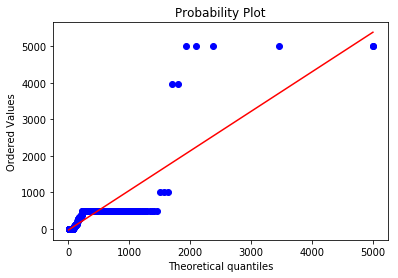

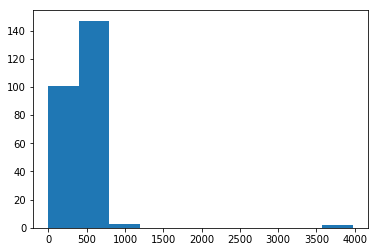

-9
Proportion not 5000: 1.0
Average not 5000: 393.7158791132831
Average 5000: 393.7158791132831


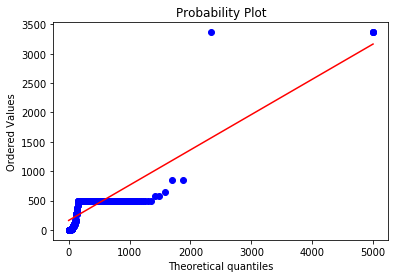

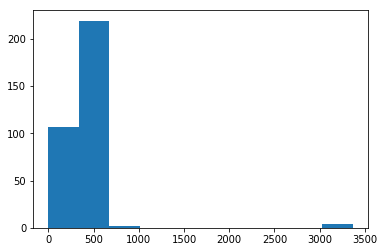

-8
Proportion not 5000: 0.9832214765100671
Average not 5000: 396.9845115034983
Average 5000: 474.21631500176187


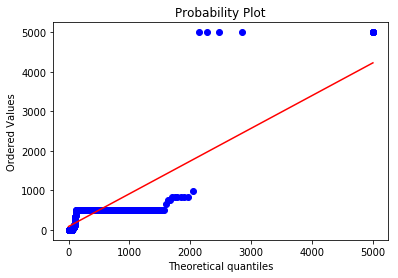

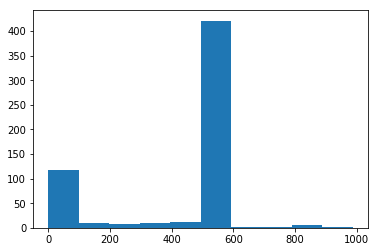

-7
Proportion not 5000: 1.0
Average not 5000: 397.50576373618054
Average 5000: 397.50576373618054


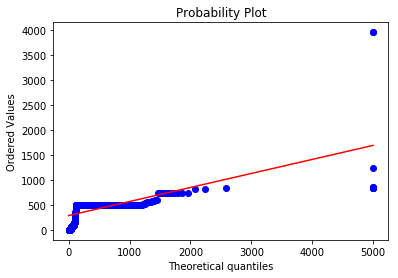

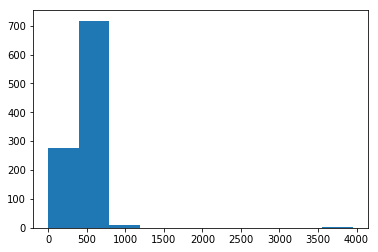

-6
Proportion not 5000: 0.9914841849148418
Average not 5000: 378.24768127099384
Average 5000: 417.605669386691


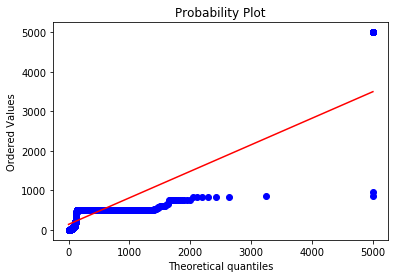

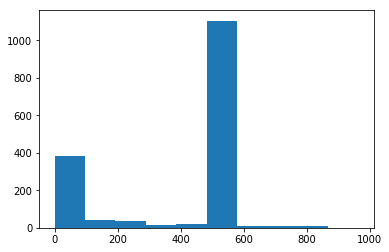

-5
Proportion not 5000: 0.9982375749030666
Average not 5000: 377.70305828009185
Average 5000: 385.84951041565733


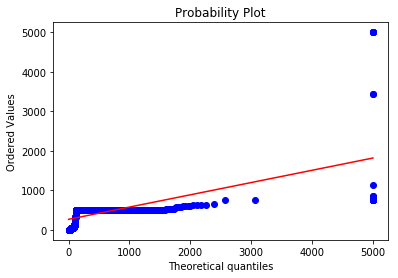

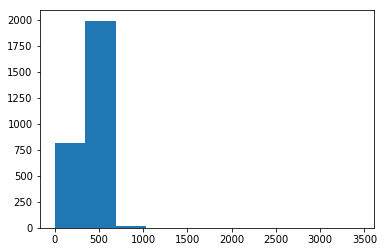

-4
Proportion not 5000: 0.9927248677248677
Average not 5000: 386.97948706658224
Average 5000: 420.5398214860715


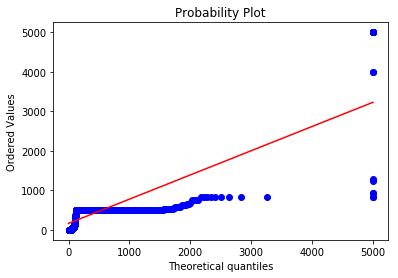

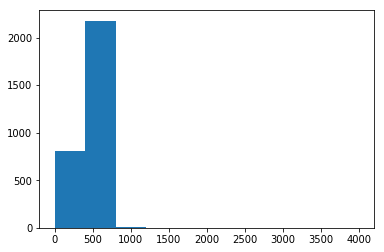

-3
Proportion not 5000: 0.9979736575481256
Average not 5000: 304.3602026753096
Average 5000: 313.8751769353394


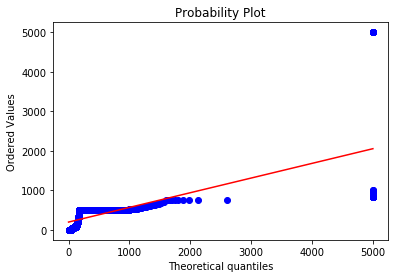

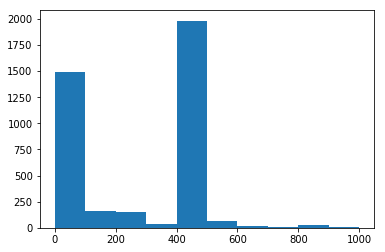

-2
Proportion not 5000: 0.9937202664129401
Average not 5000: 320.8154769949598
Average 5000: 350.1995092041256


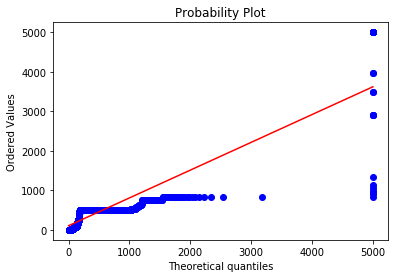

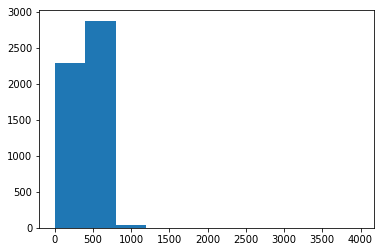

-1
Proportion not 5000: 0.9972403776325345
Average not 5000: 281.5137005867871
Average 5000: 294.5349409192273


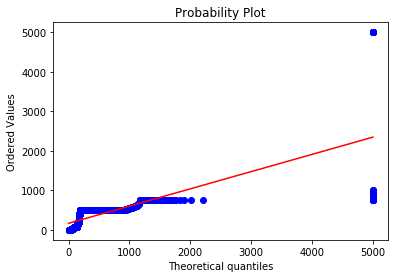

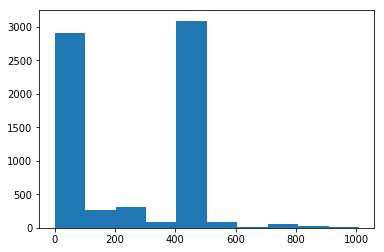

1
Proportion not 5000: 0.9935275080906149
Average not 5000: 272.216536360971
Average 5000: 302.81707657869936


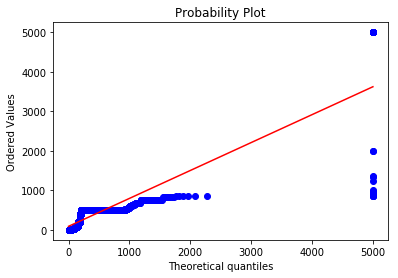

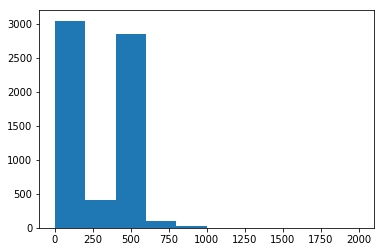

2
Proportion not 5000: 0.9937711577522004
Average not 5000: 266.8103552607903
Average 5000: 296.29264688678944


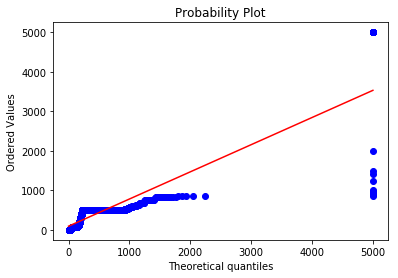

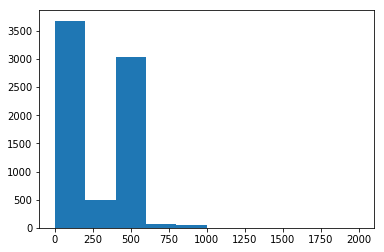

3
Proportion not 5000: 0.9938381487060113
Average not 5000: 301.907421698698
Average 5000: 330.8563695315829


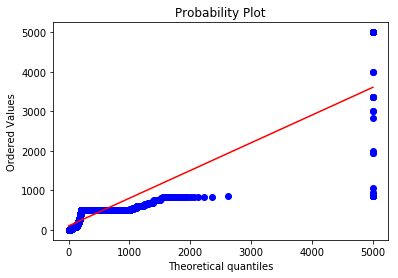

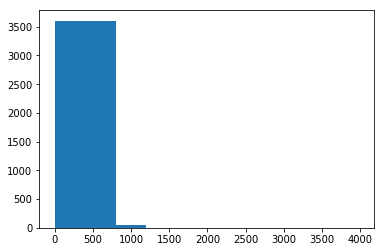

4
Proportion not 5000: 0.9944326617179216
Average not 5000: 242.50149449703636
Average 5000: 268.98809805365414


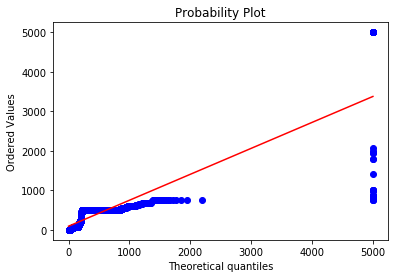

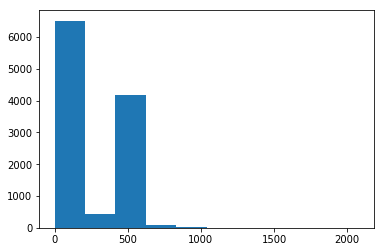

5
Proportion not 5000: 0.9961236732810337
Average not 5000: 249.04361165979805
Average 5000: 267.45987084856483


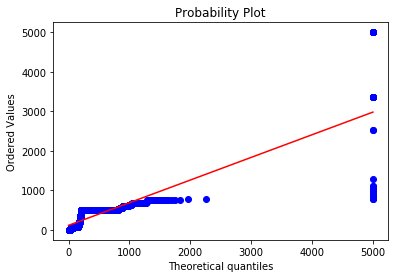

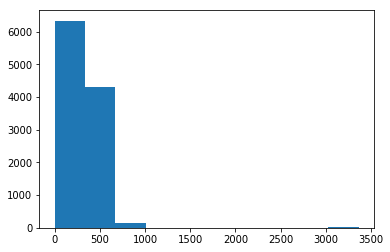

6
Proportion not 5000: 0.995113369820172
Average not 5000: 270.68934762776473
Average 5000: 293.7997397914288


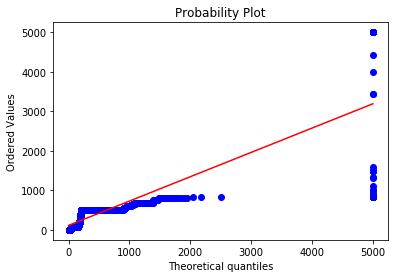

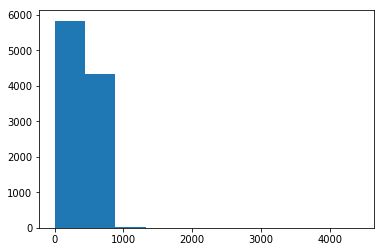

7
Proportion not 5000: 0.9954103176060216
Average not 5000: 285.4401407254159
Average 5000: 307.0784731068854


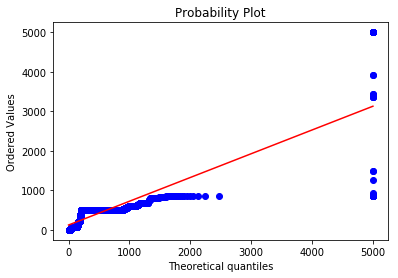

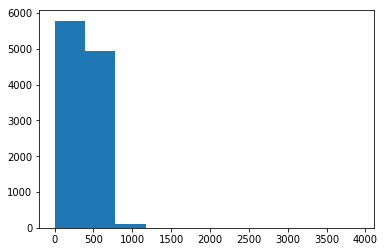

8
Proportion not 5000: 0.9979200713118407
Average not 5000: 228.71329275155134
Average 5000: 238.63722885339027


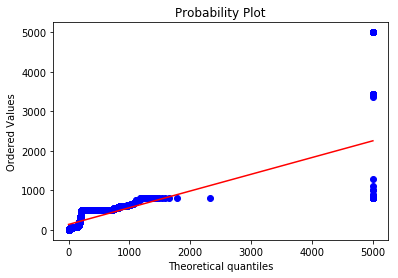

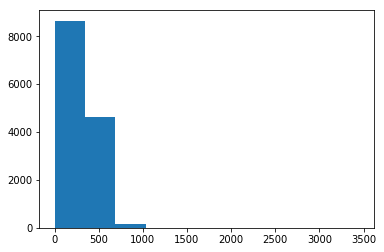

9
Proportion not 5000: 0.9921827411167513
Average not 5000: 237.25708675661616
Average 5000: 274.488681103798


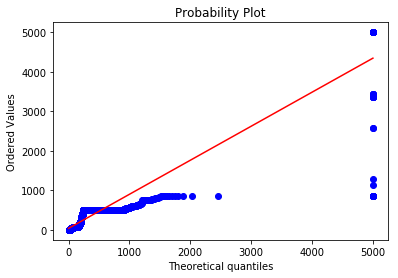

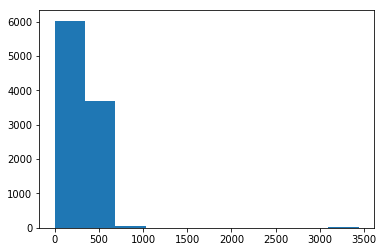

10
Proportion not 5000: 0.9964344222800424
Average not 5000: 220.22865699196902
Average 5000: 237.2713031990903


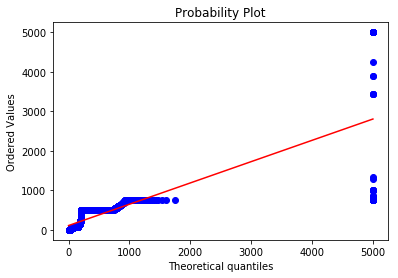

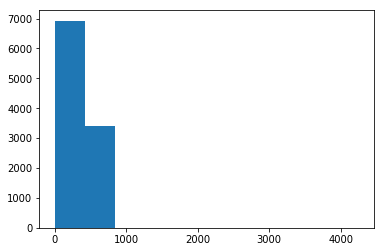

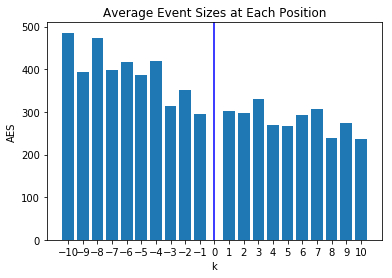

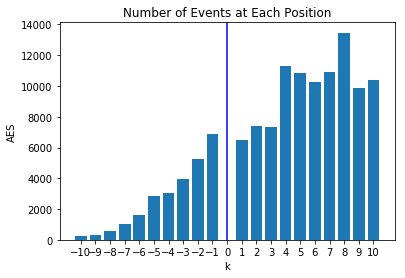

In [9]:
K = 10
starting_ref_price = 457.5
# Get Average Event Sizes
event_sizes = OrderedDict([(i,[]) for i in range(-K,K+1) if i != 0])
for update in combined_updates:
    event_sizes[update['k']].append(abs(update['change']))
    
class queue_dist:
    def __init__(self, AES):
        self.AES = AES
    def ppf(self,ys):
        rate = 1/(self.AES-50)
        res = [y for y in ys]
        for i in range(len(res)):
            if res[i] >= 0.99:
                res[i] = np.float64(5000)
            else:
                res[i] = -np.log(1-(1-np.exp(-5000*rate))*res[i]/0.99)/rate
        return np.float64(res)
    
for k,sizes in event_sizes.items():
    print(k)
    not_5000 = [s for s in sizes if s < 4500]
    print("Proportion not 5000: {}".format(len(not_5000)/len(sizes)))
    print("Average not 5000: {}".format(np.mean(not_5000)))
    AES = np.mean(sizes)
    print("Average 5000: {}".format(AES))
    probplot(sizes, dist=queue_dist(AES), plot=pylab)
    pylab.show()
    plt.hist(not_5000)
    plt.show()
    
    
AESs = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
numbers_of_events = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
for (k,sizes) in event_sizes.items():
    AESs[k] = np.mean(sizes)
    numbers_of_events[k] = len(sizes)
    
k,AES = zip(*AESs.items())
        
b1 = plt.bar(k, AES)
v = plt.axvline(x=0, color='b')
plt.xticks([i for i in range(-K,K+1)])        
plt.title('Average Event Sizes at Each Position')
plt.xlabel('k')
plt.ylabel('AES')
plt.show()

k,number_of_events = zip(*numbers_of_events.items())
b1 = plt.bar(k, number_of_events)
v = plt.axvline(x=0, color='b')
plt.xticks([i for i in range(-K,K+1)])        
plt.title('Number of Events at Each Position')
plt.xlabel('k')
plt.ylabel('AES')
plt.show()

# Get time between events at each position and queue size

In [11]:
def transform_book(book):
    res = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
    for k,actual_size in book.items():
        if math.isnan(AESs[k]):
            size = 1
        else:
            size = int(actual_size / AESs[k])
        res[k] = size
    return res

# Get times between events
maximum_sizes = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
for update in combined_updates:
    transformed_book = transform_book(update['LOB'])
    for k,size in transformed_book.items():
        if size > maximum_sizes[k]:
            maximum_sizes[k] = size
            
time_between_events_pos = OrderedDict([(k,OrderedDict()) for k in range(-K,K+1) if k != 0])
time_between_events_neg = OrderedDict([(k,OrderedDict()) for k in range(-K,K+1) if k != 0])

for k in range(-K,K+1):
    if k != 0:
        for i in range(maximum_sizes[k] + 1):
            time_between_events_pos[k][i] = []
        for i in range(1,maximum_sizes[k] + 1):
            time_between_events_neg[k][i] = []           
                
t = starting_time
reference_change_time = t
last_change_time_at_k = OrderedDict([(k,reference_change_time) for k in range(-K,K+1) if k != 0])
old_reference_price = starting_ref_price

for update in combined_updates:
    reference_price = update['reference_price']
    transformed_book = transform_book(update['LOB'])
    t = update['time']
    if reference_price != old_reference_price:
        last_change_time_at_k = OrderedDict([(k,reference_change_time) for k in range(-K,K+1) if k != 0])
        reference_change_time = t
        old_reference_price = reference_price

    k = update['k']
    time_between_change = (t-last_change_time_at_k[k]).total_seconds()
    size = transformed_book[k]
    if update['change'] > 0:
        time_between_events_pos[k][size].append(time_between_change)
        last_change_time_at_k[k]= t
    else:
        if size > 0:
            time_between_events_neg[k][size].append(time_between_change)
            last_change_time_at_k[k] = t 

# QQ Plots of Times Between Events Compared to Exponential Distribution

k = -10, size = 0
Number of positive jump times: 58
Mean: 311.5535172413793


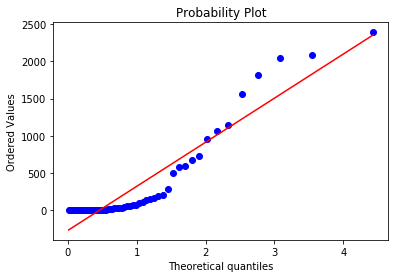



k = -10, size = 1
Number of positive jump times: 24
Mean: 76.29279166666667


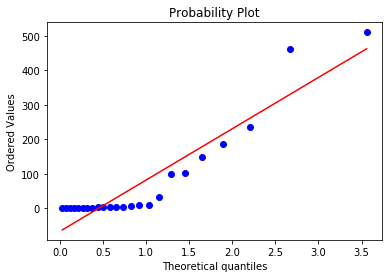



k = -10, size = 2
Number of positive jump times: 18
Mean: 19.761777777777773


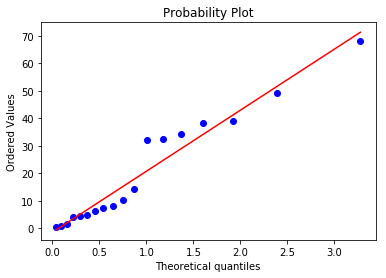



k = -10, size = 3
Number of positive jump times: 7
Mean: 265.5345714285714


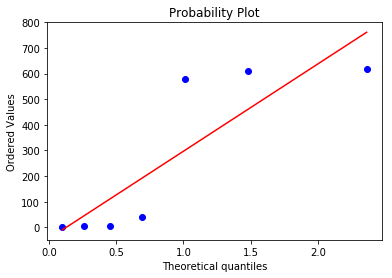



k = -10, size = 4
Number of positive jump times: 0
Mean: nan


k = -10, size = 5
Number of positive jump times: 0
Mean: nan


k = -10, size = 6
Number of positive jump times: 0
Mean: nan


k = -10, size = 7
Number of positive jump times: 0
Mean: nan


k = -10, size = 8
Number of positive jump times: 0
Mean: nan


k = -10, size = 9
Number of positive jump times: 0
Mean: nan


k = -10, size = 10
Number of positive jump times: 1
Mean: 657.713


/Users/andrewwang/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/scipy/stats/_stats_mstats_common.py:115: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/scipy/stats/_stats_mstats_common.py:125: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/scipy/stats/_stats_mstats_common.py:127: RuntimeWarning: invalid value encountered in double_scalars
  sterrest = np.sqrt((1 - r**2) * ssym / ssxm / df)


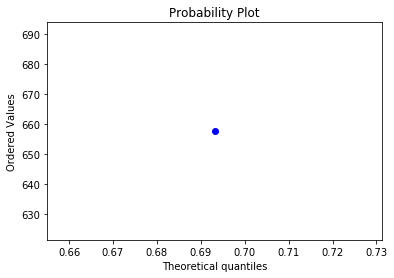



k = -10, size = 11
Number of positive jump times: 0
Mean: nan


k = -10, size = 12
Number of positive jump times: 12
Mean: 4.60925


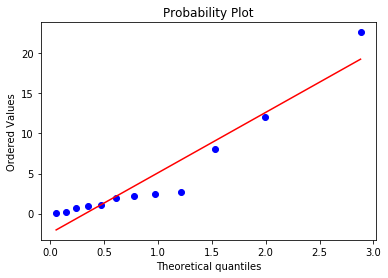



k = -10, size = 13
Number of positive jump times: 0
Mean: nan


k = -10, size = 14
Number of positive jump times: 0
Mean: nan


k = -9, size = 0
Number of positive jump times: 115
Mean: 110.80441739130434


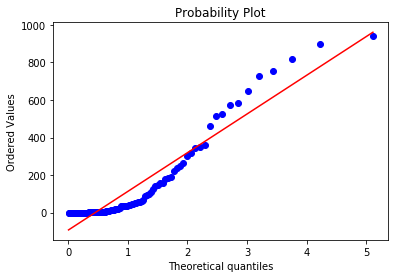



k = -9, size = 1
Number of positive jump times: 10
Mean: 619.5319


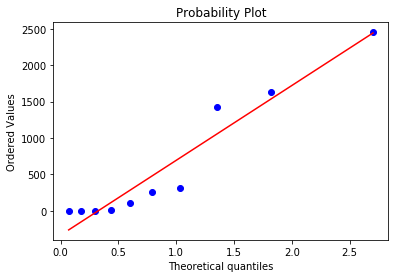



k = -9, size = 2
Number of positive jump times: 25
Mean: 4.0636


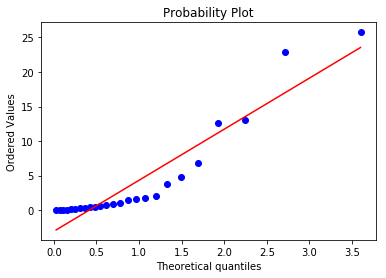



k = -9, size = 3
Number of positive jump times: 0
Mean: nan


k = -9, size = 4
Number of positive jump times: 0
Mean: nan


k = -9, size = 5
Number of positive jump times: 0
Mean: nan


k = -9, size = 6
Number of positive jump times: 0
Mean: nan


k = -9, size = 7
Number of positive jump times: 0
Mean: nan


k = -9, size = 8
Number of positive jump times: 0
Mean: nan


k = -9, size = 9
Number of positive jump times: 0
Mean: nan


k = -9, size = 10
Number of positive jump times: 0
Mean: nan


k = -9, size = 11
Number of positive jump times: 0
Mean: nan


k = -9, size = 12
Number of positive jump times: 0
Mean: nan


k = -8, size = 0
Number of positive jump times: 146
Mean: 105.18200231506849


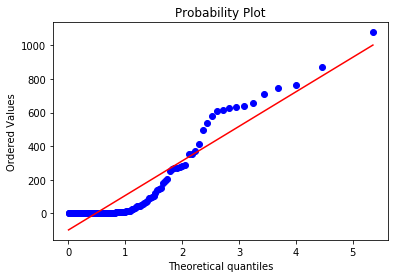



k = -8, size = 1
Number of positive jump times: 33
Mean: 5.189515151515152


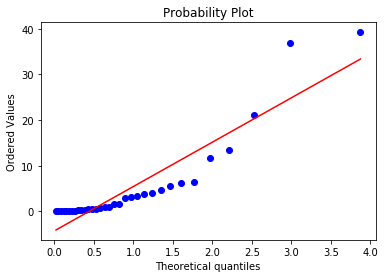



k = -8, size = 2
Number of positive jump times: 23
Mean: 0.7757391304347826


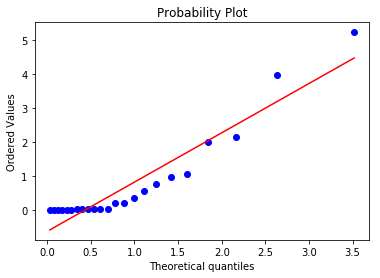



k = -8, size = 3
Number of positive jump times: 8
Mean: 0.4513750000000001


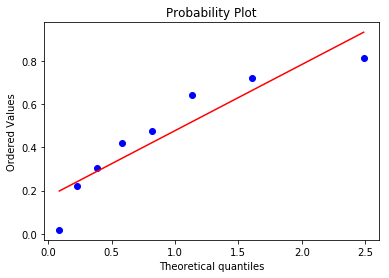



k = -8, size = 4
Number of positive jump times: 0
Mean: nan


k = -8, size = 5
Number of positive jump times: 0
Mean: nan


k = -8, size = 6
Number of positive jump times: 0
Mean: nan


k = -8, size = 7
Number of positive jump times: 0
Mean: nan


k = -8, size = 8
Number of positive jump times: 0
Mean: nan


k = -8, size = 9
Number of positive jump times: 0
Mean: nan


k = -8, size = 10
Number of positive jump times: 12
Mean: 4.45


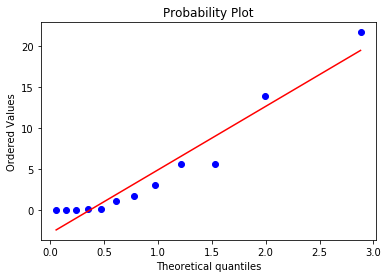



k = -8, size = 11
Number of positive jump times: 6
Mean: 0.19216666666666668


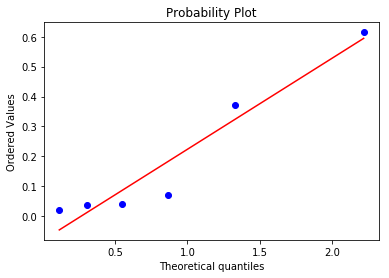



k = -8, size = 12
Number of positive jump times: 24
Mean: 0.22258333333333333


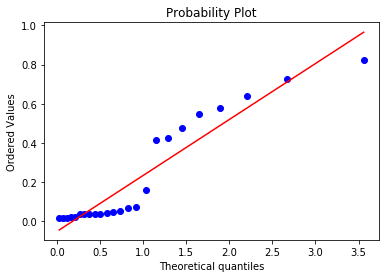



k = -8, size = 13
Number of positive jump times: 12
Mean: 0.04733333333333334


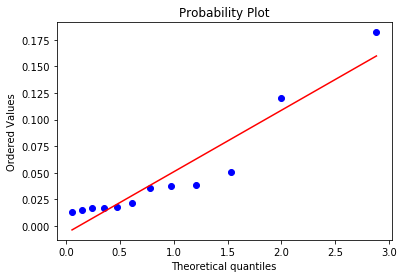



k = -8, size = 14
Number of positive jump times: 2
Mean: 0.2125


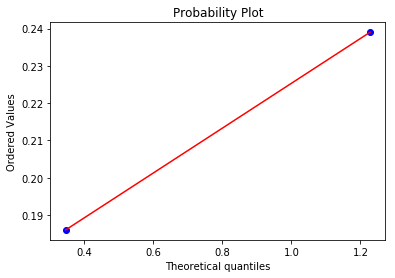



k = -8, size = 15
Number of positive jump times: 0
Mean: nan


k = -7, size = 0
Number of positive jump times: 121
Mean: 33.15281818181818


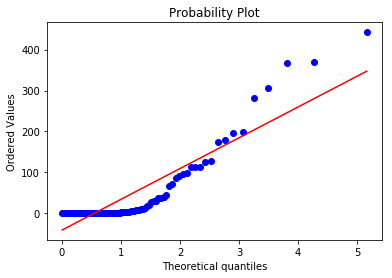



k = -7, size = 1
Number of positive jump times: 52
Mean: 1.7853846153846151


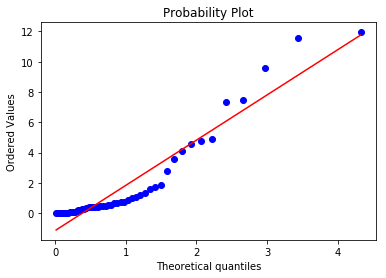



k = -7, size = 2
Number of positive jump times: 64
Mean: 0.32489062500000004


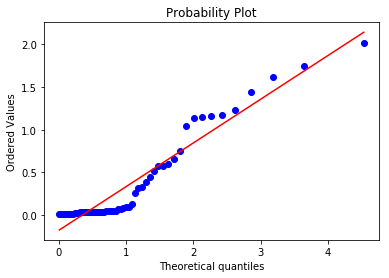



k = -7, size = 3
Number of positive jump times: 60
Mean: 0.57145


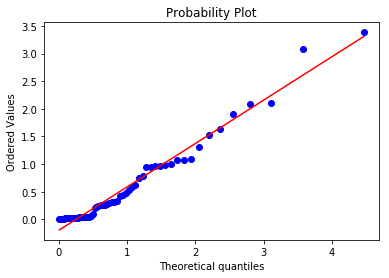



k = -7, size = 4
Number of positive jump times: 52
Mean: 1.444


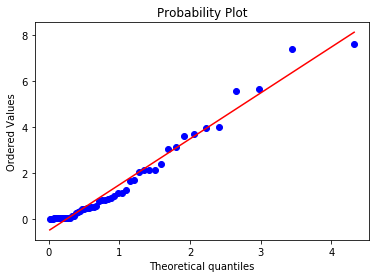



k = -7, size = 5
Number of positive jump times: 27
Mean: 1.178074074074074


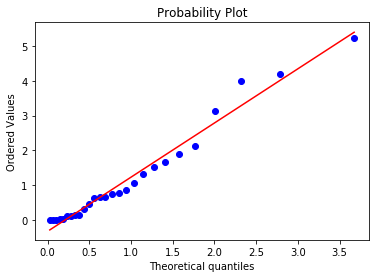



k = -7, size = 6
Number of positive jump times: 13
Mean: 0.5116923076923078


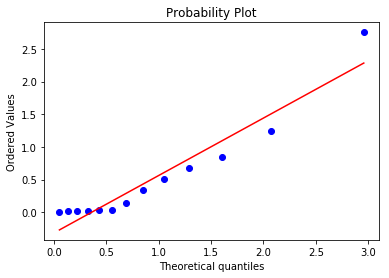



k = -7, size = 7
Number of positive jump times: 2
Mean: 1.2454999999999998


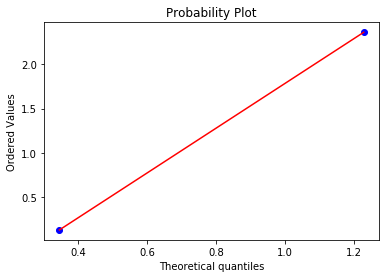



k = -7, size = 8
Number of positive jump times: 0
Mean: nan


k = -7, size = 9
Number of positive jump times: 4
Mean: 0.014499999999999999


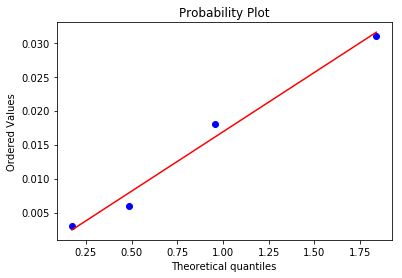



k = -7, size = 10
Number of positive jump times: 8
Mean: 19.203875


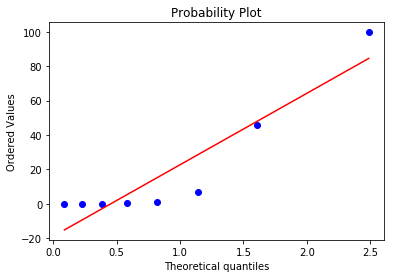



k = -7, size = 11
Number of positive jump times: 0
Mean: nan


k = -7, size = 12
Number of positive jump times: 7
Mean: 0.044857142857142866


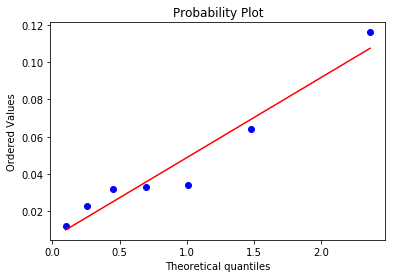



k = -7, size = 13
Number of positive jump times: 14
Mean: 0.3827142857142857


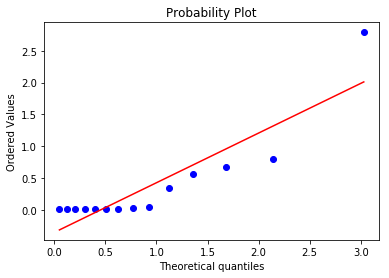



k = -7, size = 14
Number of positive jump times: 3
Mean: 1.3483333333333334


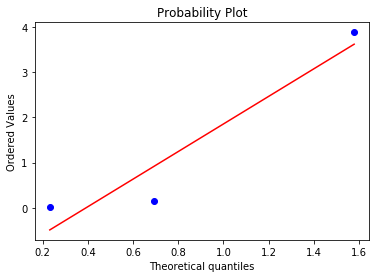



k = -7, size = 15
Number of positive jump times: 28
Mean: 0.5178214285714285


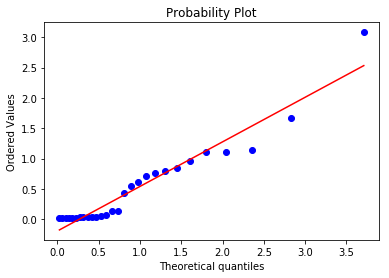



k = -7, size = 16
Number of positive jump times: 3
Mean: 31.030333333333335


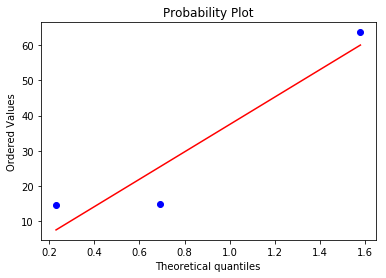



k = -7, size = 17
Number of positive jump times: 0
Mean: nan


k = -6, size = 0
Number of positive jump times: 249
Mean: 2.609172690763052


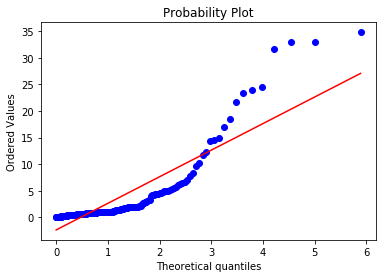



k = -6, size = 1
Number of positive jump times: 117
Mean: 1.0511965811965813


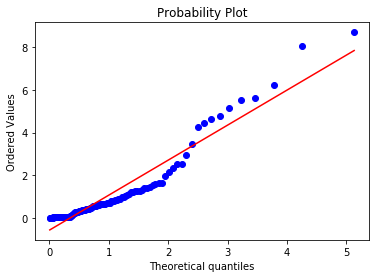



k = -6, size = 2
Number of positive jump times: 24
Mean: 2.3850416666666665


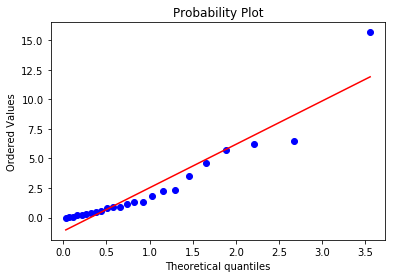



k = -6, size = 3
Number of positive jump times: 40
Mean: 0.9619500000000001


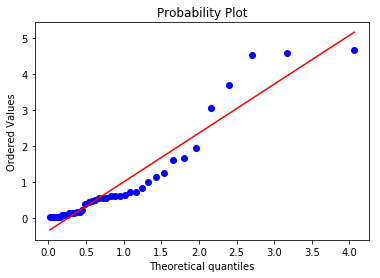



k = -6, size = 4
Number of positive jump times: 29
Mean: 0.6343448275862068


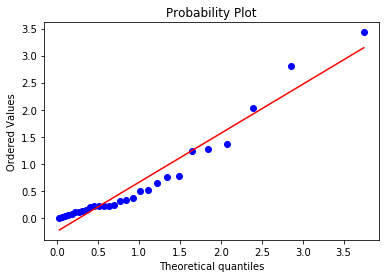



k = -6, size = 5
Number of positive jump times: 20
Mean: 0.22445000000000004


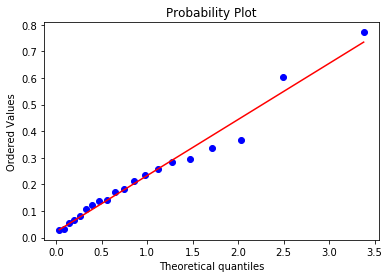



k = -6, size = 6
Number of positive jump times: 7
Mean: 0.21885714285714286


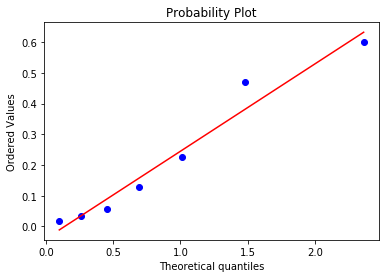



k = -6, size = 7
Number of positive jump times: 0
Mean: nan


k = -6, size = 8
Number of positive jump times: 0
Mean: nan


k = -6, size = 9
Number of positive jump times: 0
Mean: nan


k = -6, size = 10
Number of positive jump times: 0
Mean: nan


k = -6, size = 11
Number of positive jump times: 0
Mean: nan


k = -6, size = 12
Number of positive jump times: 66
Mean: 2.1515151515151514


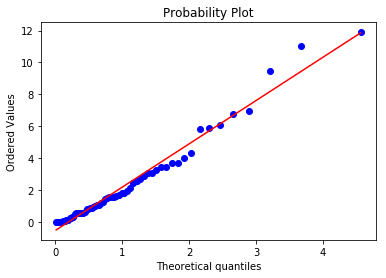



k = -6, size = 13
Number of positive jump times: 16
Mean: 6.2216875


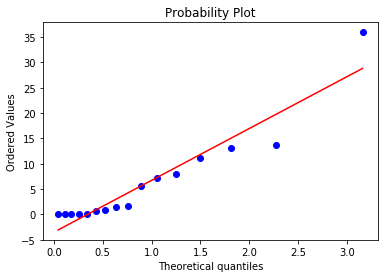



k = -6, size = 14
Number of positive jump times: 77
Mean: 0.39538961038961035


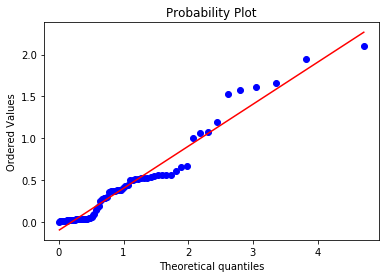



k = -6, size = 15
Number of positive jump times: 55
Mean: 0.578


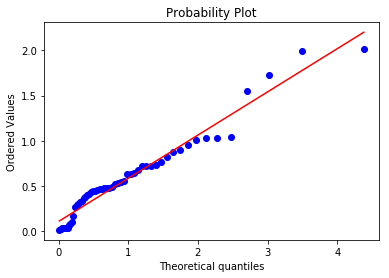



k = -6, size = 16
Number of positive jump times: 8
Mean: 0.6968749999999999


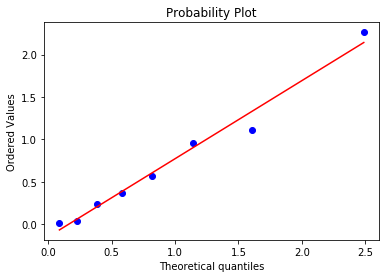



k = -6, size = 17
Number of positive jump times: 4
Mean: 1.80325


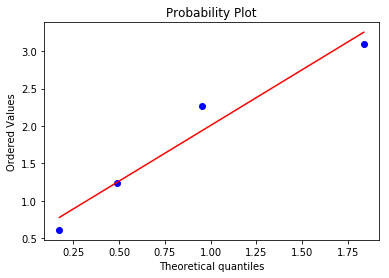



k = -6, size = 18
Number of positive jump times: 0
Mean: nan


k = -5, size = 0
Number of positive jump times: 502
Mean: 2.1974422310756974


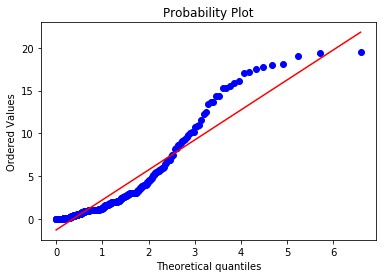



k = -5, size = 1
Number of positive jump times: 203
Mean: 1.7778029556650246


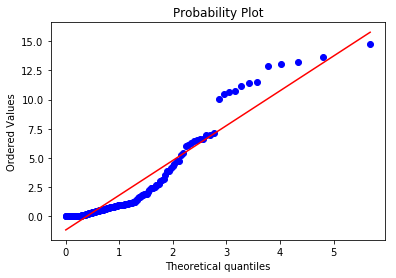



k = -5, size = 2
Number of positive jump times: 127
Mean: 0.9031574803149607


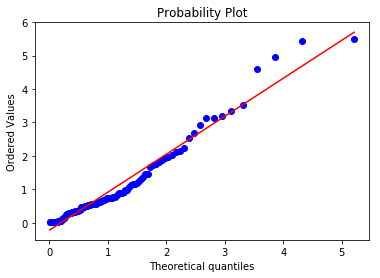



k = -5, size = 3
Number of positive jump times: 216
Mean: 0.7577546296296297


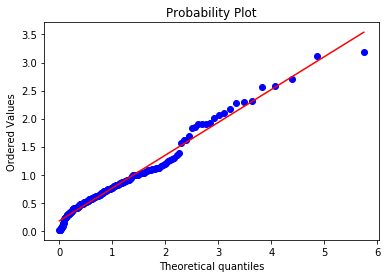



k = -5, size = 4
Number of positive jump times: 38
Mean: 1.9679210526315787


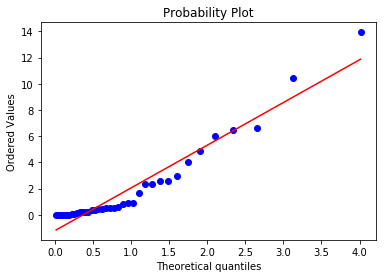



k = -5, size = 5
Number of positive jump times: 15
Mean: 0.8506000000000001


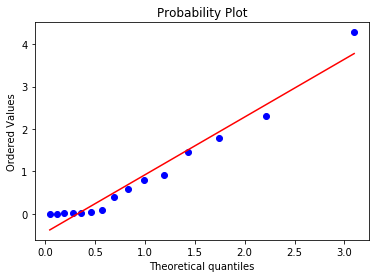



k = -5, size = 6
Number of positive jump times: 17
Mean: 6.126470588235295


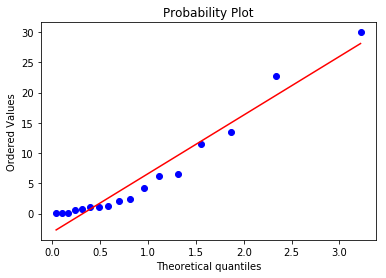



k = -5, size = 7
Number of positive jump times: 0
Mean: nan


k = -5, size = 8
Number of positive jump times: 0
Mean: nan


k = -5, size = 9
Number of positive jump times: 0
Mean: nan


k = -5, size = 10
Number of positive jump times: 0
Mean: nan


k = -5, size = 11
Number of positive jump times: 0
Mean: nan


k = -5, size = 12
Number of positive jump times: 0
Mean: nan


k = -5, size = 13
Number of positive jump times: 13
Mean: 0.3675384615384614


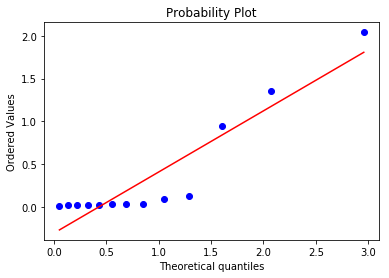



k = -5, size = 14
Number of positive jump times: 4
Mean: 17.03575


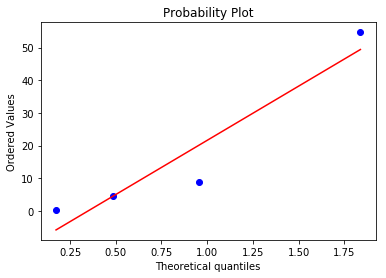



k = -5, size = 15
Number of positive jump times: 3
Mean: 0.05933333333333333


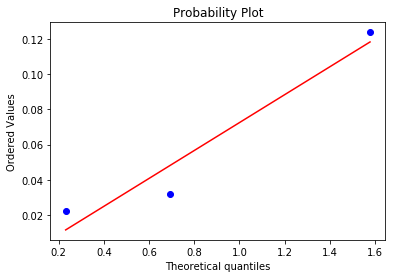



k = -5, size = 16
Number of positive jump times: 124
Mean: 0.6911693548387098


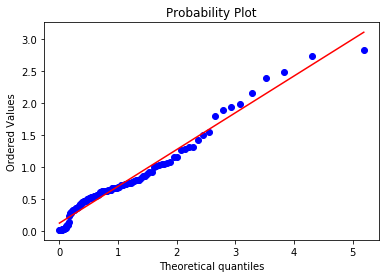



k = -5, size = 17
Number of positive jump times: 1
Mean: 3.018


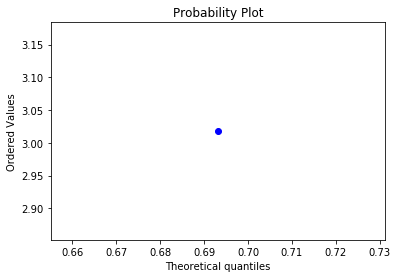



k = -5, size = 18
Number of positive jump times: 2
Mean: 0.159


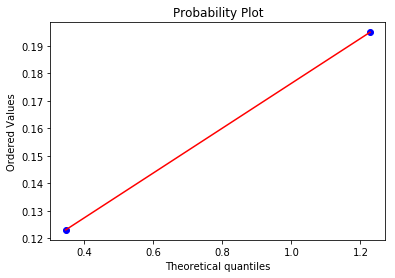



k = -5, size = 19
Number of positive jump times: 0
Mean: nan


k = -5, size = 20
Number of positive jump times: 0
Mean: nan


k = -4, size = 0
Number of positive jump times: 559
Mean: 1.8205545617173526


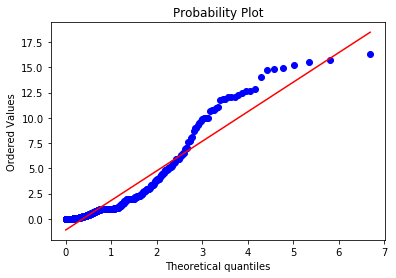



k = -4, size = 1
Number of positive jump times: 184
Mean: 0.6241141304347826


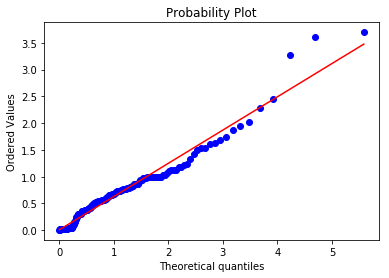



k = -4, size = 2
Number of positive jump times: 52
Mean: 1.581596153846154


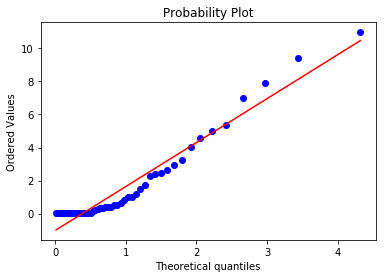



k = -4, size = 3
Number of positive jump times: 159
Mean: 0.8256729559748428


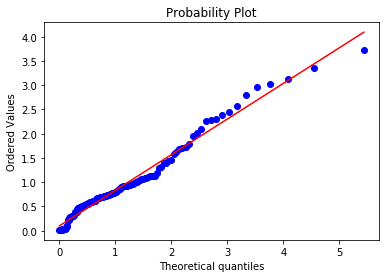



k = -4, size = 4
Number of positive jump times: 17
Mean: 6.756882352941177


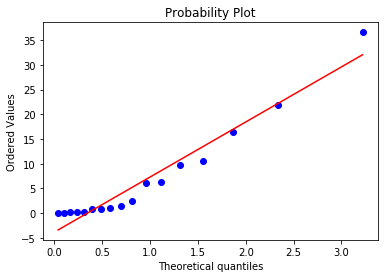



k = -4, size = 5
Number of positive jump times: 24
Mean: 1.0759166666666669


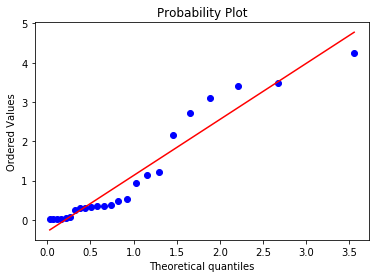



k = -4, size = 6
Number of positive jump times: 5
Mean: 1.5778000000000003


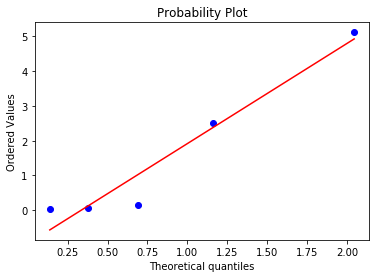



k = -4, size = 7
Number of positive jump times: 1
Mean: 0.1


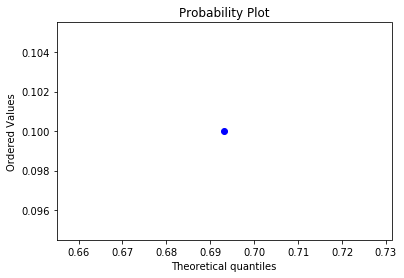



k = -4, size = 8
Number of positive jump times: 0
Mean: nan


k = -4, size = 9
Number of positive jump times: 0
Mean: nan


k = -4, size = 10
Number of positive jump times: 0
Mean: nan


k = -4, size = 11
Number of positive jump times: 28
Mean: 0.03457142857142858


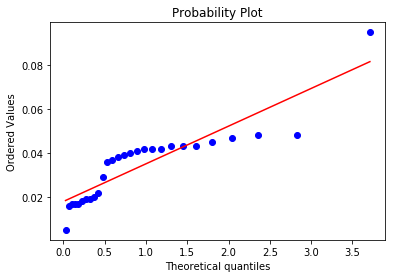



k = -4, size = 12
Number of positive jump times: 165
Mean: 0.5605151515151516


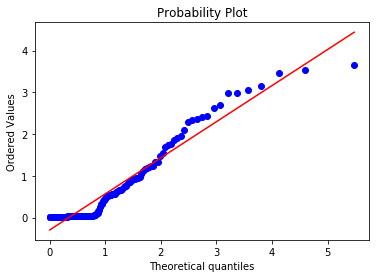



k = -4, size = 13
Number of positive jump times: 41
Mean: 0.7850487804878048


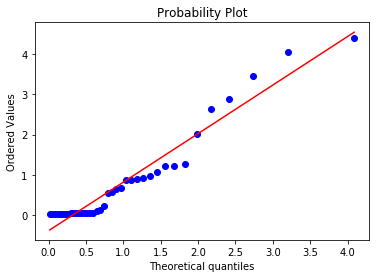



k = -4, size = 14
Number of positive jump times: 42
Mean: 0.5081428571428571


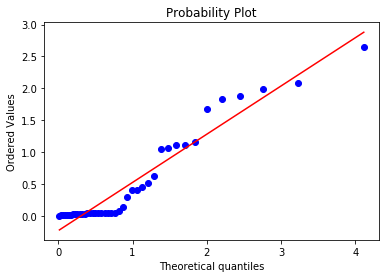



k = -4, size = 15
Number of positive jump times: 19
Mean: 0.9401578947368421


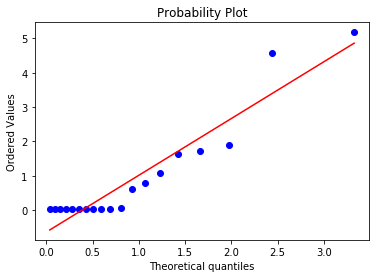



k = -4, size = 16
Number of positive jump times: 33
Mean: 0.6903030303030303


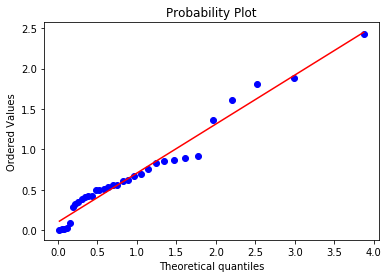



k = -4, size = 17
Number of positive jump times: 17
Mean: 0.5628823529411764


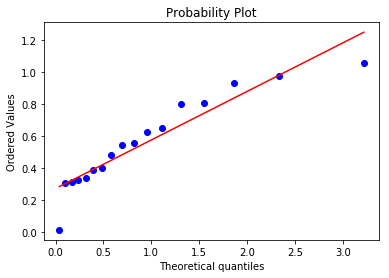



k = -4, size = 18
Number of positive jump times: 0
Mean: nan


k = -4, size = 19
Number of positive jump times: 0
Mean: nan


k = -4, size = 20
Number of positive jump times: 0
Mean: nan


k = -4, size = 21
Number of positive jump times: 0
Mean: nan


k = -4, size = 22
Number of positive jump times: 0
Mean: nan


k = -3, size = 0
Number of positive jump times: 833
Mean: 2.005857142857143


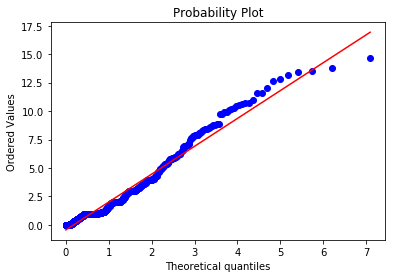



k = -3, size = 1
Number of positive jump times: 153
Mean: 3.0149346405228754


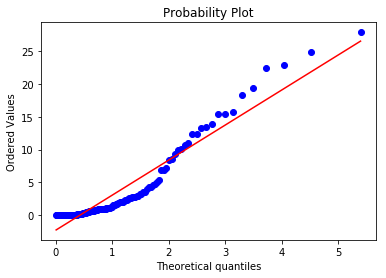



k = -3, size = 2
Number of positive jump times: 108
Mean: 1.5248703703703705


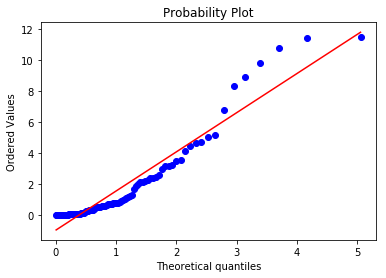



k = -3, size = 3
Number of positive jump times: 97
Mean: 0.7057422680412371


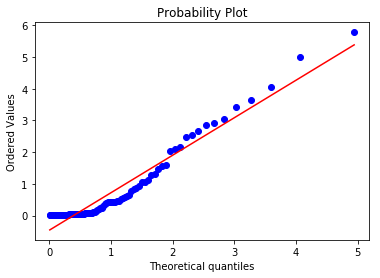



k = -3, size = 4
Number of positive jump times: 122
Mean: 2.465762295081967


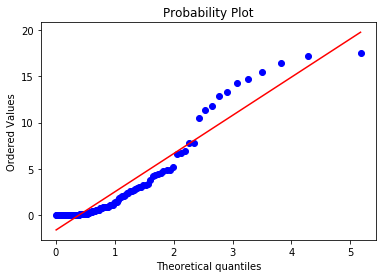



k = -3, size = 5
Number of positive jump times: 65
Mean: 1.4811846153846153


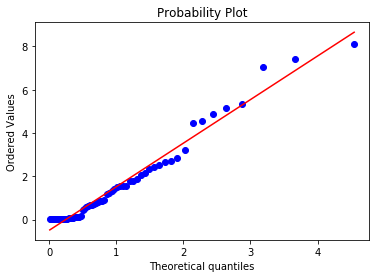



k = -3, size = 6
Number of positive jump times: 87
Mean: 1.75832183908046


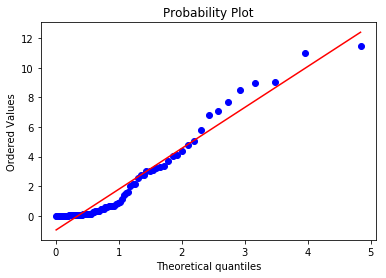



k = -3, size = 7
Number of positive jump times: 47
Mean: 2.7464893617021278


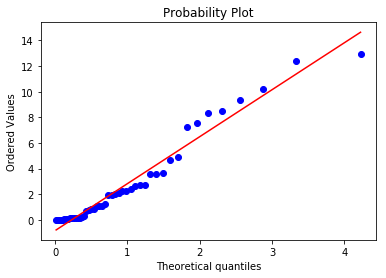



k = -3, size = 8
Number of positive jump times: 24
Mean: 1.0009166666666667


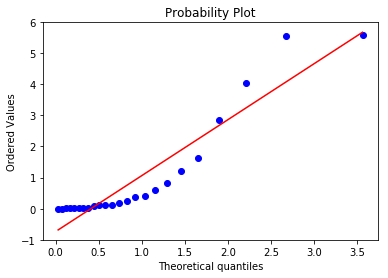



k = -3, size = 9
Number of positive jump times: 25
Mean: 0.49244


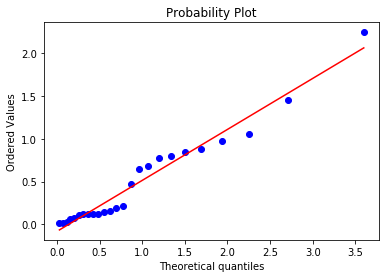



k = -3, size = 10
Number of positive jump times: 7
Mean: 0.941857142857143


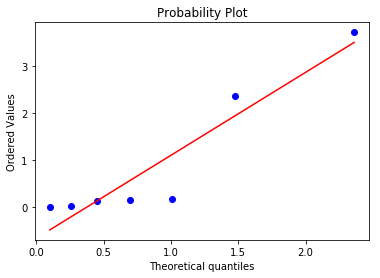



k = -3, size = 11
Number of positive jump times: 3
Mean: 0.5143333333333334


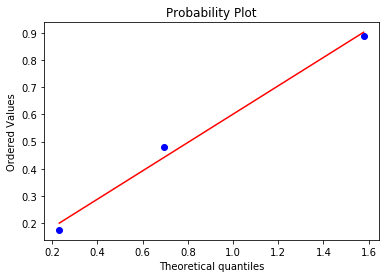



k = -3, size = 12
Number of positive jump times: 1
Mean: 0.703


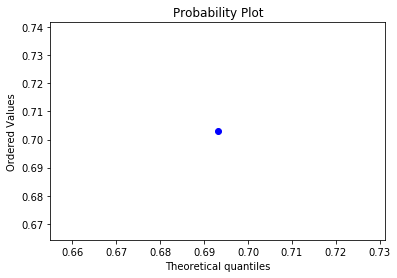



k = -3, size = 13
Number of positive jump times: 4
Mean: 1.46525


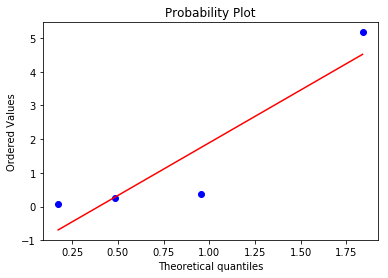



k = -3, size = 14
Number of positive jump times: 3
Mean: 0.29433333333333334


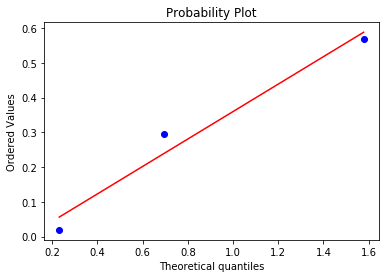



k = -3, size = 15
Number of positive jump times: 7
Mean: 0.5528571428571428


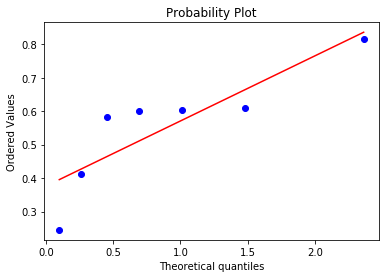



k = -3, size = 16
Number of positive jump times: 25
Mean: 0.19196000000000002


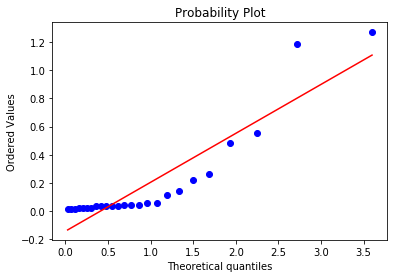



k = -3, size = 17
Number of positive jump times: 97
Mean: 0.5538144329896907


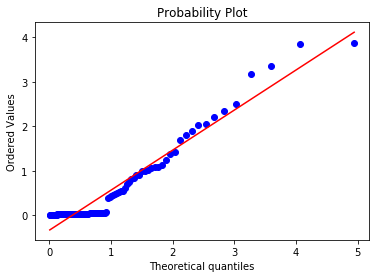



k = -3, size = 18
Number of positive jump times: 30
Mean: 0.3266


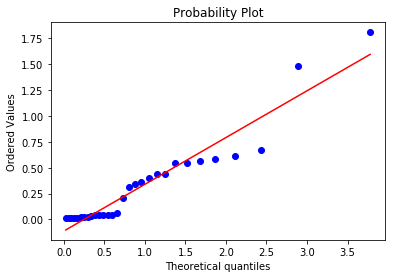



k = -3, size = 19
Number of positive jump times: 0
Mean: nan


k = -3, size = 20
Number of positive jump times: 8
Mean: 0.9874999999999999


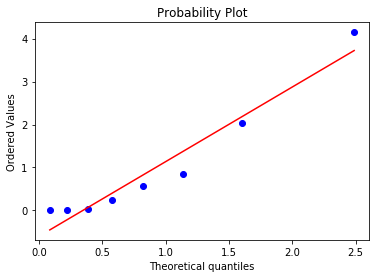



k = -3, size = 21
Number of positive jump times: 1
Mean: 0.02


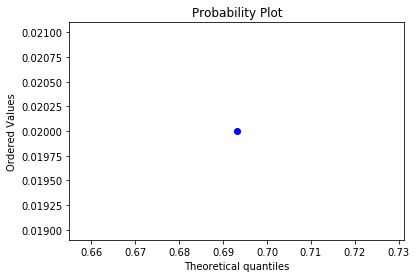



k = -3, size = 22
Number of positive jump times: 18
Mean: 0.3911666666666667


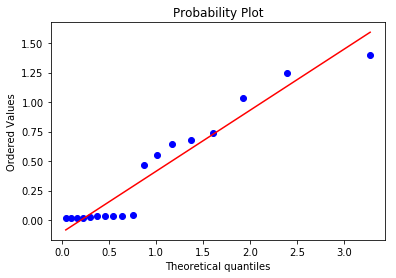



k = -3, size = 23
Number of positive jump times: 4
Mean: 2.15175


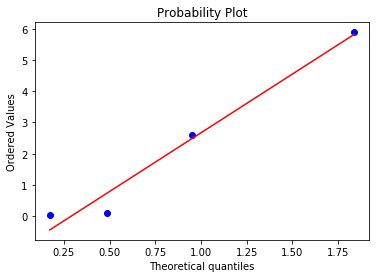



k = -3, size = 24
Number of positive jump times: 4
Mean: 0.9145000000000001


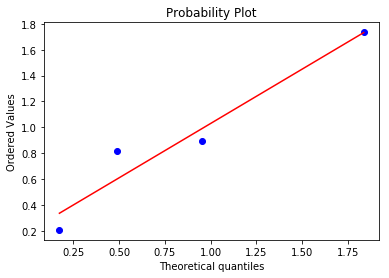



k = -3, size = 25
Number of positive jump times: 2
Mean: 29.0835


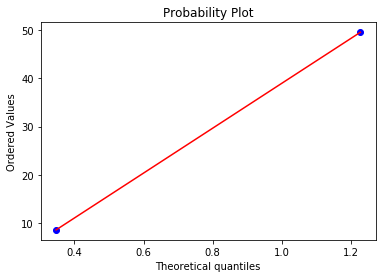



k = -3, size = 26
Number of positive jump times: 0
Mean: nan


k = -2, size = 0
Number of positive jump times: 1163
Mean: 2.0176431642304387


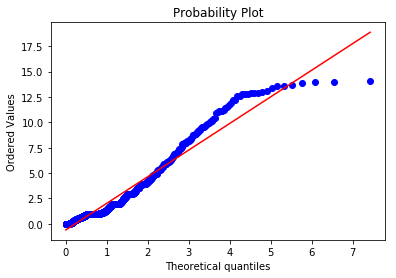



k = -2, size = 1
Number of positive jump times: 271
Mean: 1.7255510627306272


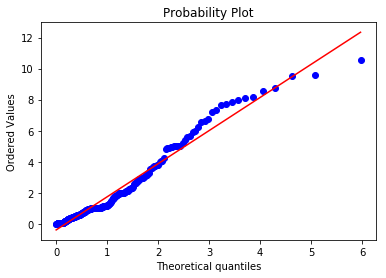



k = -2, size = 2
Number of positive jump times: 106
Mean: 1.7509528301886792


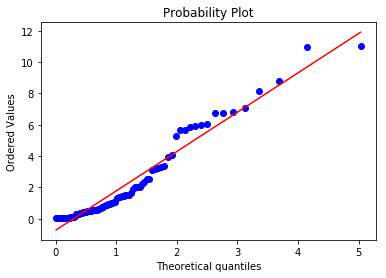



k = -2, size = 3
Number of positive jump times: 165
Mean: 1.7922969696969695


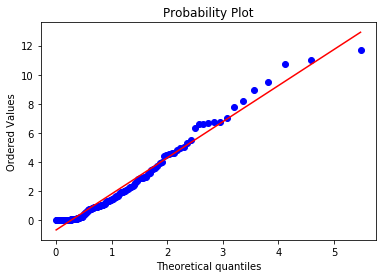



k = -2, size = 4
Number of positive jump times: 123
Mean: 2.933983739837399


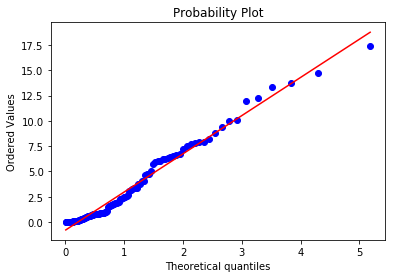



k = -2, size = 5
Number of positive jump times: 88
Mean: 3.097886363636364


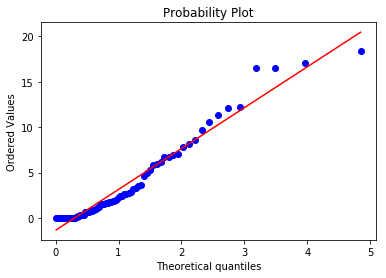



k = -2, size = 6
Number of positive jump times: 75
Mean: 3.3720666666666665


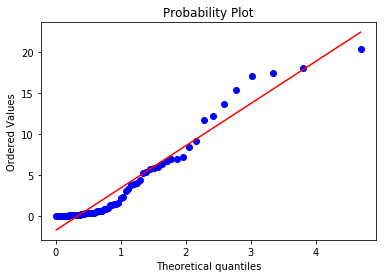



k = -2, size = 7
Number of positive jump times: 64
Mean: 1.5578906250000002


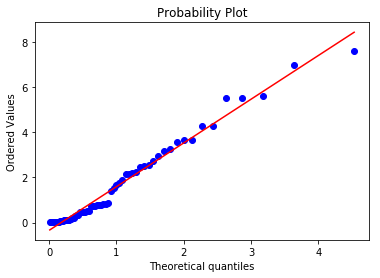



k = -2, size = 8
Number of positive jump times: 19
Mean: 0.7715263157894738


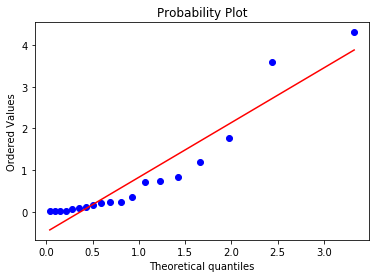



k = -2, size = 9
Number of positive jump times: 7
Mean: 0.2957142857142857


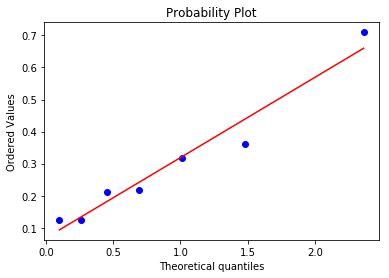



k = -2, size = 10
Number of positive jump times: 4
Mean: 0.22549999999999998


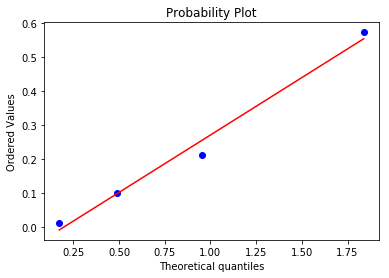



k = -2, size = 11
Number of positive jump times: 1
Mean: 12.095


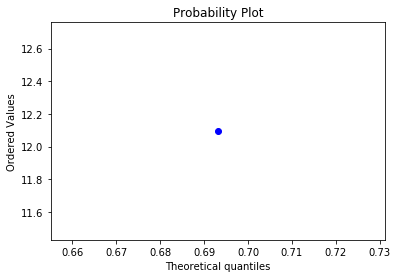



k = -2, size = 12
Number of positive jump times: 0
Mean: nan


k = -2, size = 13
Number of positive jump times: 1
Mean: 0.015


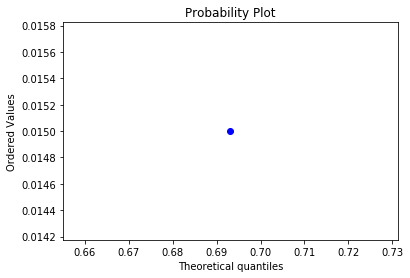



k = -2, size = 14
Number of positive jump times: 104
Mean: 0.14573076923076922


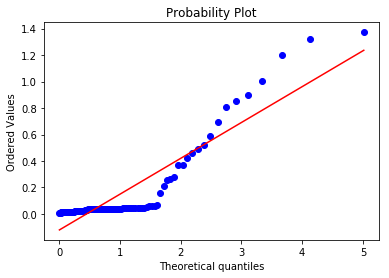



k = -2, size = 15
Number of positive jump times: 67
Mean: 0.3769402985074627


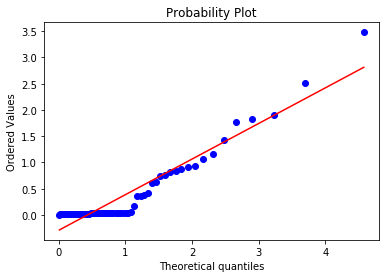



k = -2, size = 16
Number of positive jump times: 30
Mean: 0.7059666666666666


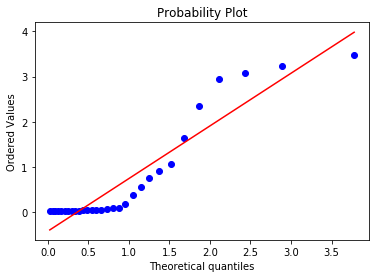



k = -2, size = 17
Number of positive jump times: 38
Mean: 2.1377368421052636


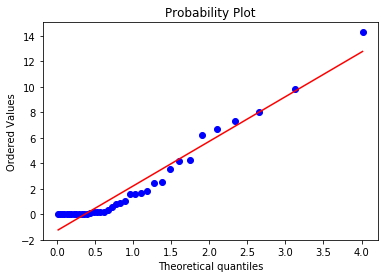



k = -2, size = 18
Number of positive jump times: 7
Mean: 0.03571428571428571


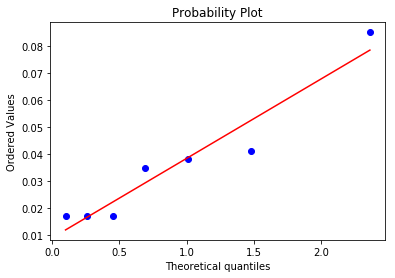



k = -2, size = 19
Number of positive jump times: 44
Mean: 0.7022272727272728


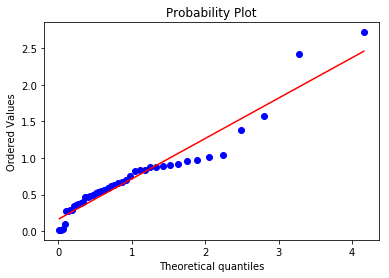



k = -2, size = 20
Number of positive jump times: 3
Mean: 45.35366666666667


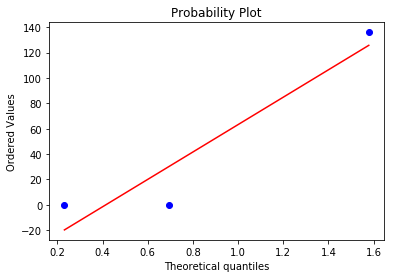



k = -2, size = 21
Number of positive jump times: 0
Mean: nan


k = -1, size = 0
Number of positive jump times: 1732
Mean: 2.0388163972286373


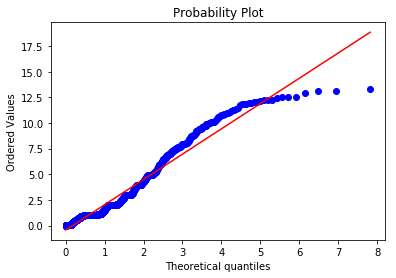



k = -1, size = 1
Number of positive jump times: 219
Mean: 0.6508401826484018


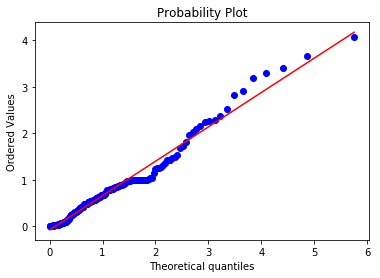



k = -1, size = 2
Number of positive jump times: 291
Mean: 1.2288109965635736


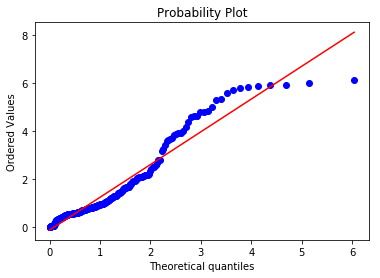



k = -1, size = 3
Number of positive jump times: 231
Mean: 1.5287316017316015


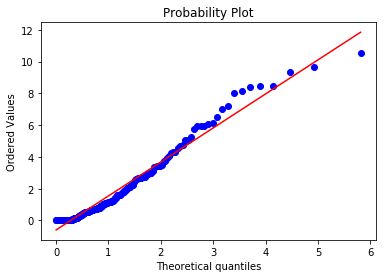



k = -1, size = 4
Number of positive jump times: 161
Mean: 1.2639565217391304


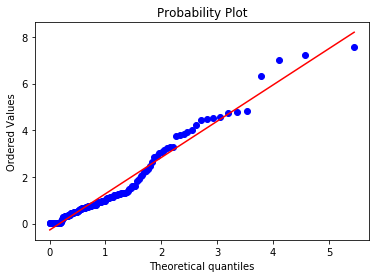



k = -1, size = 5
Number of positive jump times: 92
Mean: 2.6610434782608694


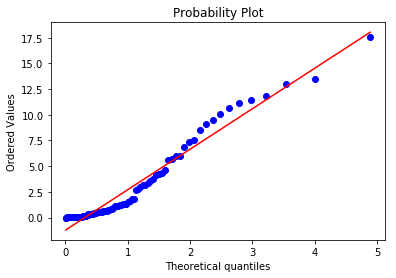



k = -1, size = 6
Number of positive jump times: 93
Mean: 0.7896881720430109


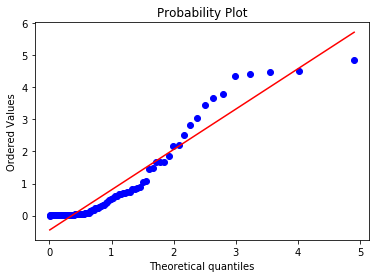



k = -1, size = 7
Number of positive jump times: 64
Mean: 1.7880625


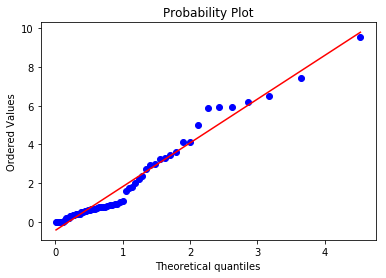



k = -1, size = 8
Number of positive jump times: 38
Mean: 3.10421052631579


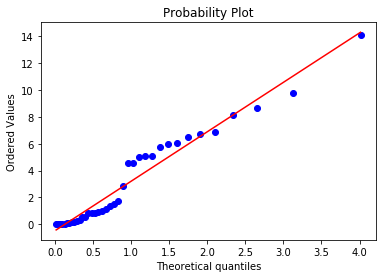



k = -1, size = 9
Number of positive jump times: 10
Mean: 1.6131


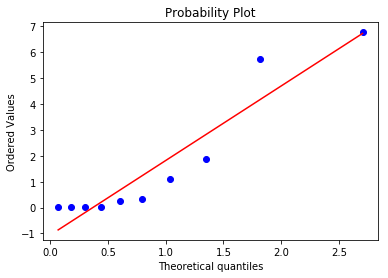



k = -1, size = 10
Number of positive jump times: 14
Mean: 1.4292142857142858


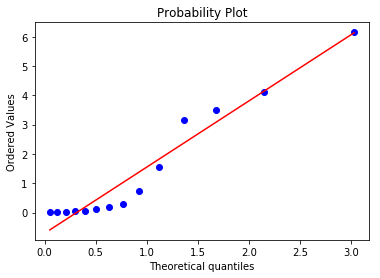



k = -1, size = 11
Number of positive jump times: 2
Mean: 1.2374999999999998


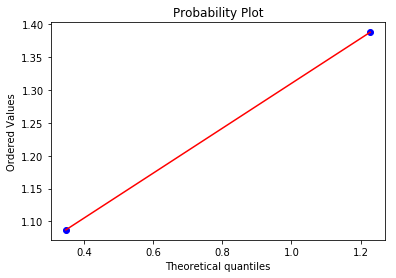



k = -1, size = 12
Number of positive jump times: 0
Mean: nan


k = -1, size = 13
Number of positive jump times: 0
Mean: nan


k = -1, size = 14
Number of positive jump times: 0
Mean: nan


k = -1, size = 15
Number of positive jump times: 0
Mean: nan


k = -1, size = 16
Number of positive jump times: 0
Mean: nan


k = -1, size = 17
Number of positive jump times: 57
Mean: 0.03103508771929825


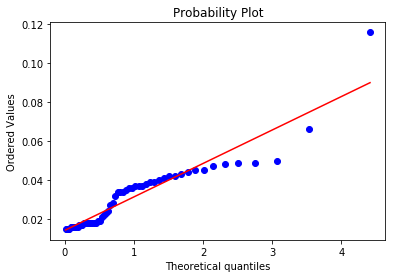



k = -1, size = 18
Number of positive jump times: 4
Mean: 7.2482500000000005


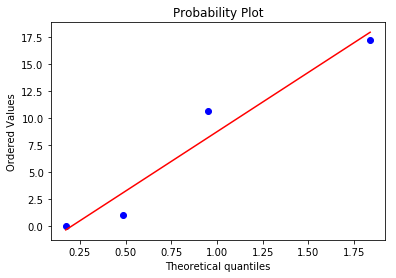



k = -1, size = 19
Number of positive jump times: 15
Mean: 1.0295999999999998


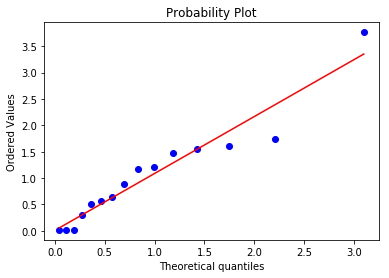



k = -1, size = 20
Number of positive jump times: 18
Mean: 1.643722222222222


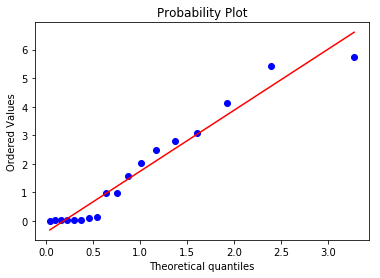



k = -1, size = 21
Number of positive jump times: 40
Mean: 1.100675


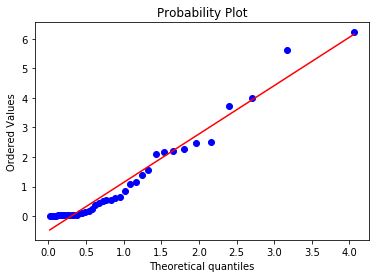



k = -1, size = 22
Number of positive jump times: 30
Mean: 0.5336


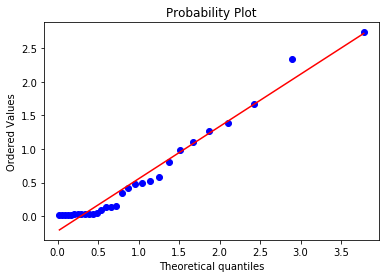



k = -1, size = 23
Number of positive jump times: 10
Mean: 1.3025999999999998


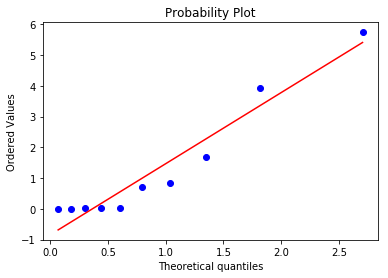



k = -1, size = 24
Number of positive jump times: 13
Mean: 0.4276153846153847


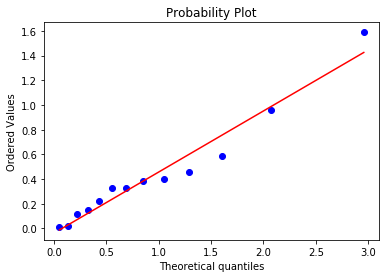



k = -1, size = 25
Number of positive jump times: 0
Mean: nan


k = -1, size = 26
Number of positive jump times: 0
Mean: nan


k = 1, size = 0
Number of positive jump times: 2516
Mean: 4.051498012718601


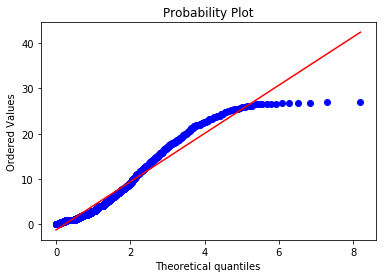



k = 1, size = 1
Number of positive jump times: 114
Mean: 1.069385964912281


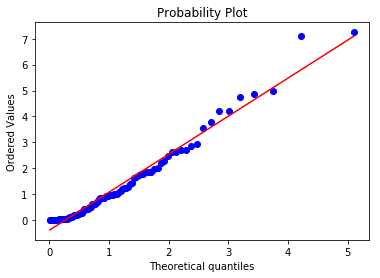



k = 1, size = 2
Number of positive jump times: 86
Mean: 1.3467790697674418


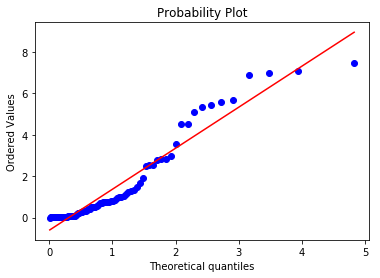



k = 1, size = 3
Number of positive jump times: 64
Mean: 1.646140625


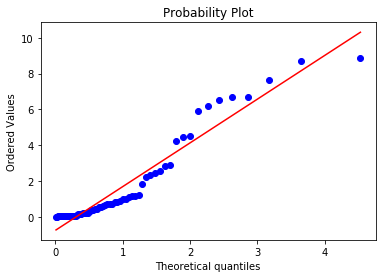



k = 1, size = 4
Number of positive jump times: 46
Mean: 2.8139782608695647


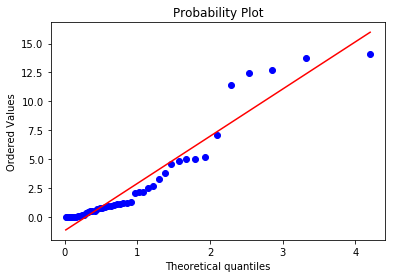



k = 1, size = 5
Number of positive jump times: 36
Mean: 1.1261111111111113


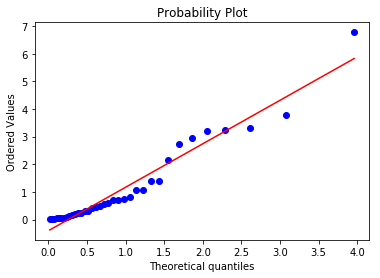



k = 1, size = 6
Number of positive jump times: 38
Mean: 1.2592983684210526


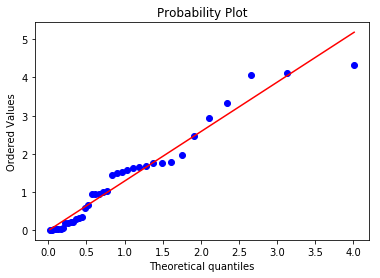



k = 1, size = 7
Number of positive jump times: 26
Mean: 1.3559615384615382


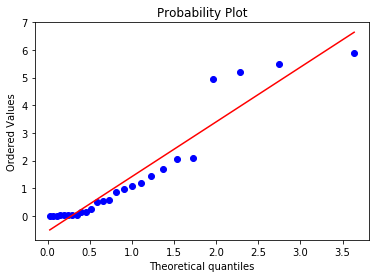



k = 1, size = 8
Number of positive jump times: 19
Mean: 6.583


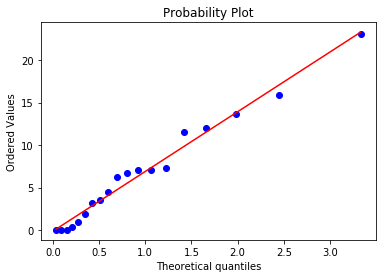



k = 1, size = 9
Number of positive jump times: 20
Mean: 4.61925


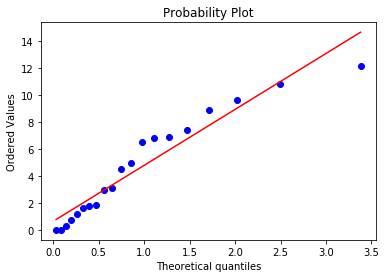



k = 1, size = 10
Number of positive jump times: 3
Mean: 3.2949999999999995


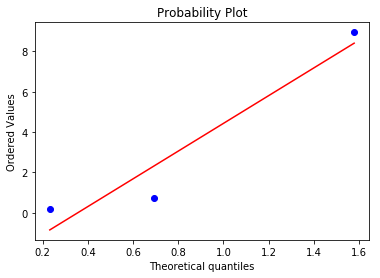



k = 1, size = 11
Number of positive jump times: 1
Mean: 0.816


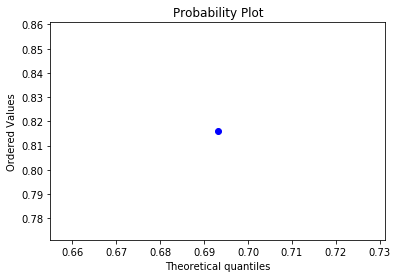



k = 1, size = 12
Number of positive jump times: 0
Mean: nan


k = 1, size = 13
Number of positive jump times: 0
Mean: nan


k = 1, size = 14
Number of positive jump times: 0
Mean: nan


k = 1, size = 15
Number of positive jump times: 0
Mean: nan


k = 1, size = 16
Number of positive jump times: 10
Mean: 2.7908


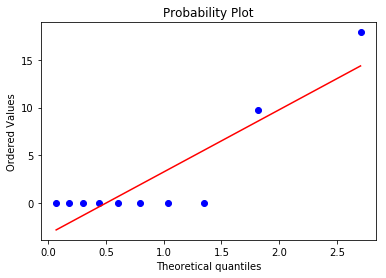



k = 1, size = 17
Number of positive jump times: 7
Mean: 0.9167142857142857


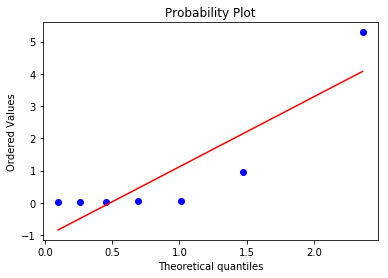



k = 1, size = 18
Number of positive jump times: 7
Mean: 0.11485714285714287


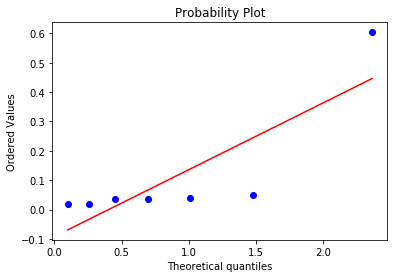



k = 1, size = 19
Number of positive jump times: 0
Mean: nan


k = 1, size = 20
Number of positive jump times: 1
Mean: 15.85


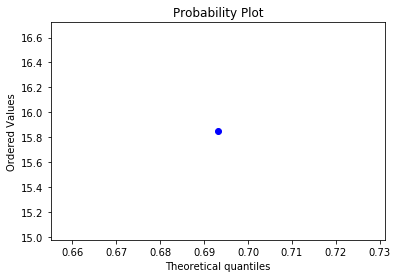



k = 1, size = 21
Number of positive jump times: 0
Mean: nan


k = 1, size = 22
Number of positive jump times: 0
Mean: nan


k = 2, size = 0
Number of positive jump times: 2022
Mean: 5.415180019782394


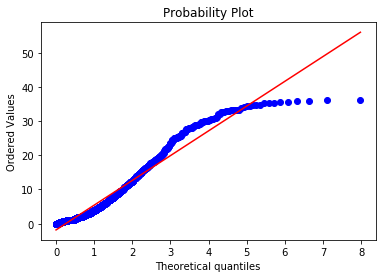



k = 2, size = 1
Number of positive jump times: 275
Mean: 0.5435818181818183


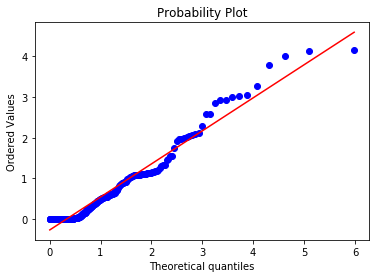



k = 2, size = 2
Number of positive jump times: 314
Mean: 1.0231464968152868


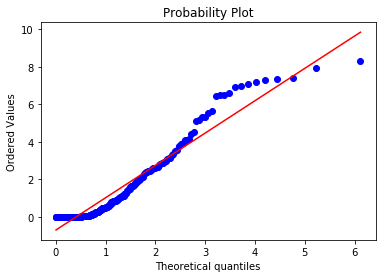



k = 2, size = 3
Number of positive jump times: 350
Mean: 0.35579428571428573


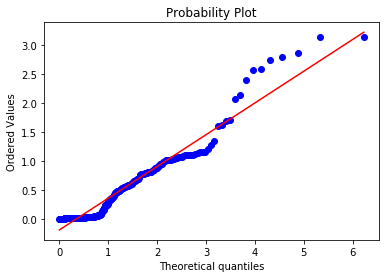



k = 2, size = 4
Number of positive jump times: 213
Mean: 0.48111267605633806


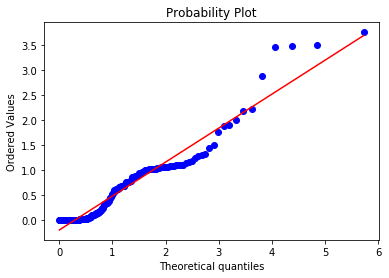



k = 2, size = 5
Number of positive jump times: 99
Mean: 0.43948484848484853


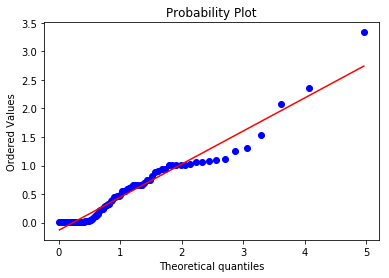



k = 2, size = 6
Number of positive jump times: 42
Mean: 1.190547619047619


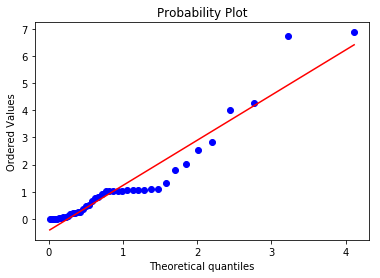



k = 2, size = 7
Number of positive jump times: 22
Mean: 0.4327272727272727


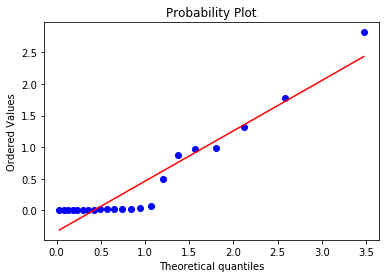



k = 2, size = 8
Number of positive jump times: 7
Mean: 0.8959999999999999


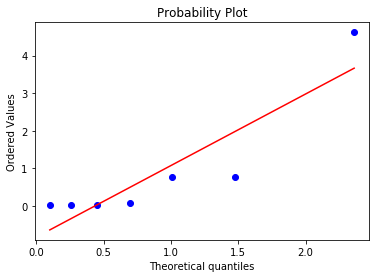



k = 2, size = 9
Number of positive jump times: 11
Mean: 0.7365454545454546


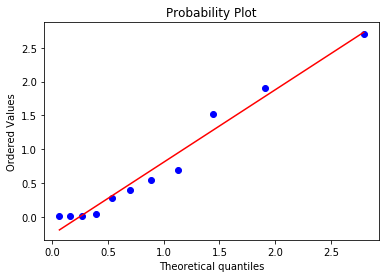



k = 2, size = 10
Number of positive jump times: 4
Mean: 6.611500000000001


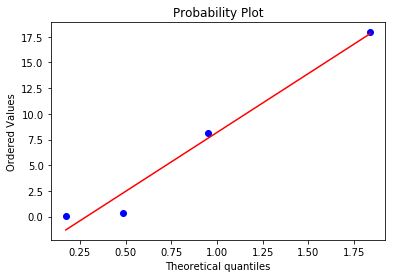



k = 2, size = 11
Number of positive jump times: 1
Mean: 56.286


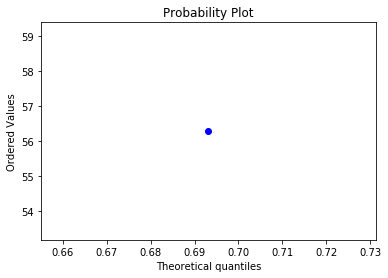



k = 2, size = 12
Number of positive jump times: 0
Mean: nan


k = 2, size = 13
Number of positive jump times: 0
Mean: nan


k = 2, size = 14
Number of positive jump times: 0
Mean: nan


k = 2, size = 15
Number of positive jump times: 0
Mean: nan


k = 2, size = 16
Number of positive jump times: 0
Mean: nan


k = 2, size = 17
Number of positive jump times: 0
Mean: nan


k = 2, size = 18
Number of positive jump times: 0
Mean: nan


k = 2, size = 19
Number of positive jump times: 0
Mean: nan


k = 2, size = 20
Number of positive jump times: 0
Mean: nan


k = 2, size = 21
Number of positive jump times: 6
Mean: 0.0365


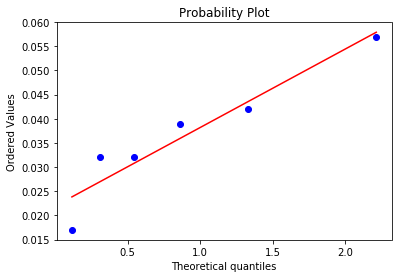



k = 2, size = 22
Number of positive jump times: 0
Mean: nan


k = 2, size = 23
Number of positive jump times: 0
Mean: nan


k = 3, size = 0
Number of positive jump times: 2276
Mean: 5.153666520210896


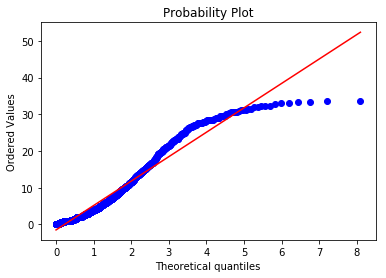



k = 3, size = 1
Number of positive jump times: 260
Mean: 1.2036846153846152


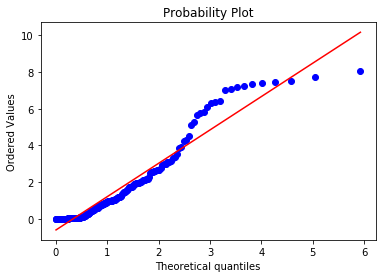



k = 3, size = 2
Number of positive jump times: 229
Mean: 0.9654672489082968


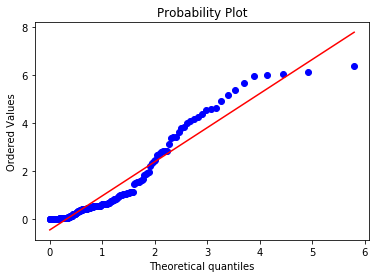



k = 3, size = 3
Number of positive jump times: 276
Mean: 1.2197898550724637


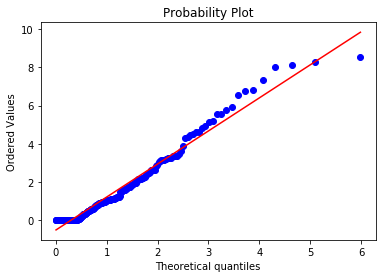



k = 3, size = 4
Number of positive jump times: 161
Mean: 1.2568509316770187


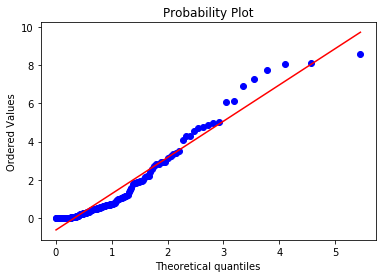



k = 3, size = 5
Number of positive jump times: 59
Mean: 3.575016949152542


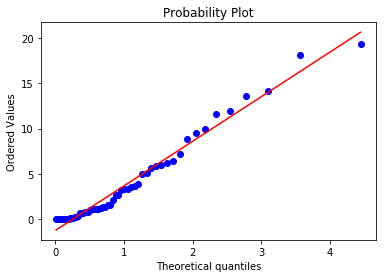



k = 3, size = 6
Number of positive jump times: 39
Mean: 1.4476666666666667


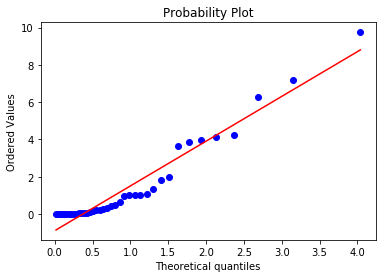



k = 3, size = 7
Number of positive jump times: 20
Mean: 1.4288999999999998


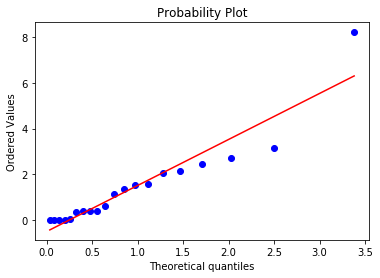



k = 3, size = 8
Number of positive jump times: 1
Mean: 67.086


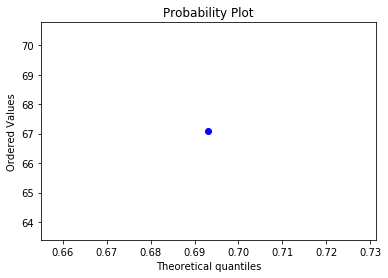



k = 3, size = 9
Number of positive jump times: 1
Mean: 0.295


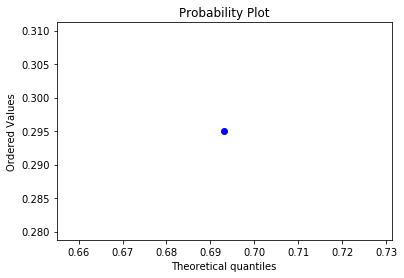



k = 3, size = 10
Number of positive jump times: 0
Mean: nan


k = 3, size = 11
Number of positive jump times: 0
Mean: nan


k = 3, size = 12
Number of positive jump times: 0
Mean: nan


k = 3, size = 13
Number of positive jump times: 0
Mean: nan


k = 3, size = 14
Number of positive jump times: 0
Mean: nan


k = 3, size = 15
Number of positive jump times: 47
Mean: 9.906489361702128


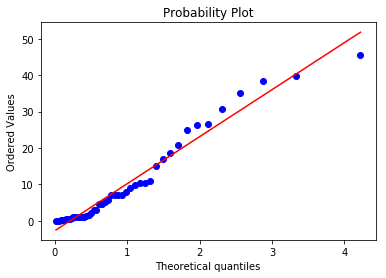



k = 3, size = 16
Number of positive jump times: 11
Mean: 0.8105454545454548


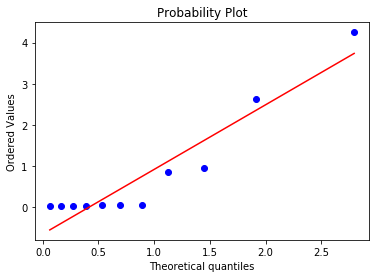



k = 3, size = 17
Number of positive jump times: 6
Mean: 0.038666666666666676


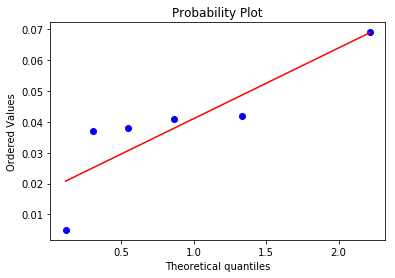



k = 3, size = 18
Number of positive jump times: 2
Mean: 4.8185


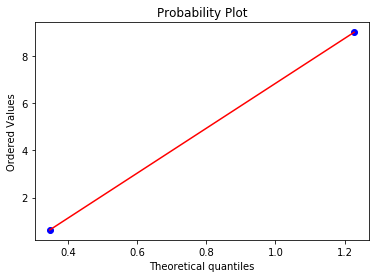



k = 3, size = 19
Number of positive jump times: 0
Mean: nan


k = 4, size = 0
Number of positive jump times: 2746
Mean: 4.306873029133285


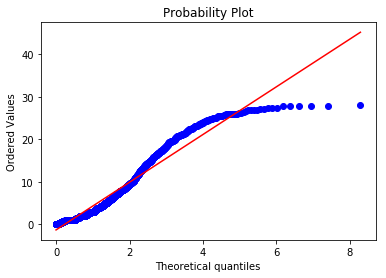



k = 4, size = 1
Number of positive jump times: 377
Mean: 0.43456233421750656


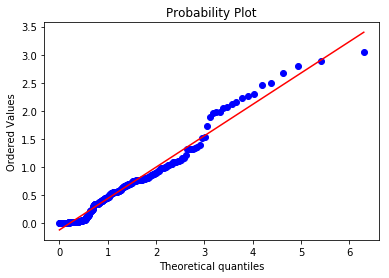



k = 4, size = 2
Number of positive jump times: 283
Mean: 0.5415371024734982


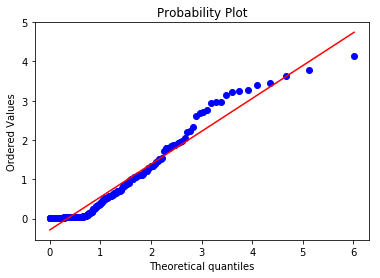



k = 4, size = 3
Number of positive jump times: 470
Mean: 0.33031276595744674


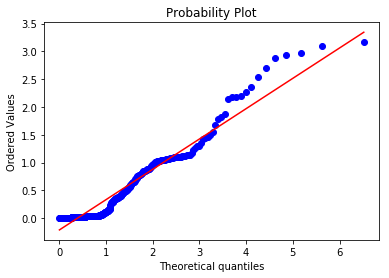



k = 4, size = 4
Number of positive jump times: 437
Mean: 0.49979405034324936


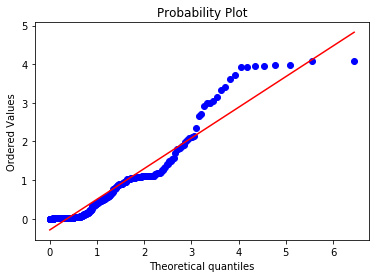



k = 4, size = 5
Number of positive jump times: 612
Mean: 0.31797385620915025


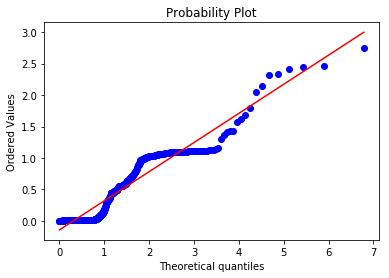



k = 4, size = 6
Number of positive jump times: 156
Mean: 0.4809423076923076


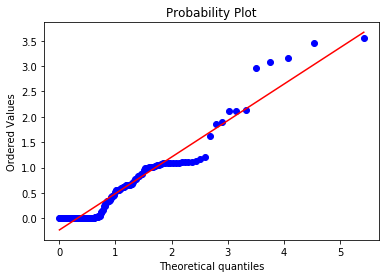



k = 4, size = 7
Number of positive jump times: 61
Mean: 0.37432786885245906


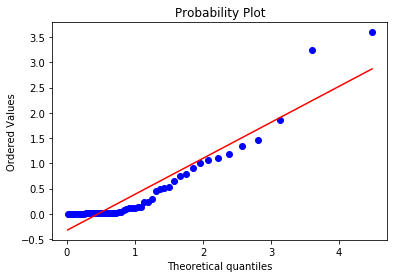



k = 4, size = 8
Number of positive jump times: 17
Mean: 0.9109411764705881


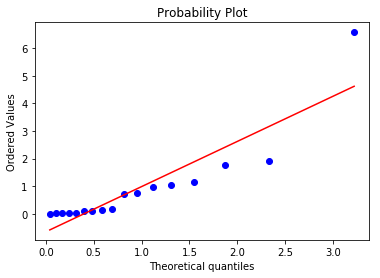



k = 4, size = 9
Number of positive jump times: 7
Mean: 8.097


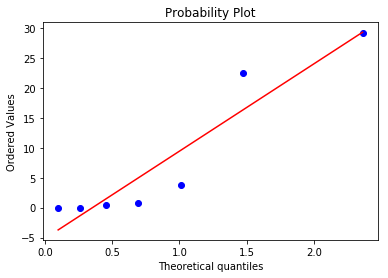



k = 4, size = 10
Number of positive jump times: 0
Mean: nan


k = 4, size = 11
Number of positive jump times: 0
Mean: nan


k = 4, size = 12
Number of positive jump times: 0
Mean: nan


k = 4, size = 13
Number of positive jump times: 0
Mean: nan


k = 4, size = 14
Number of positive jump times: 0
Mean: nan


k = 4, size = 15
Number of positive jump times: 0
Mean: nan


k = 4, size = 16
Number of positive jump times: 0
Mean: nan


k = 4, size = 17
Number of positive jump times: 0
Mean: nan


k = 4, size = 18
Number of positive jump times: 20
Mean: 5.52065


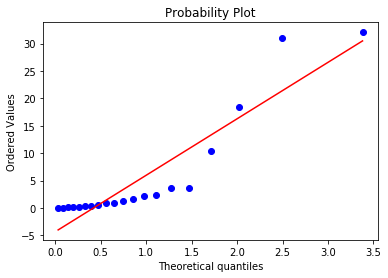



k = 4, size = 19
Number of positive jump times: 0
Mean: nan


k = 4, size = 20
Number of positive jump times: 7
Mean: 3.0959999999999996


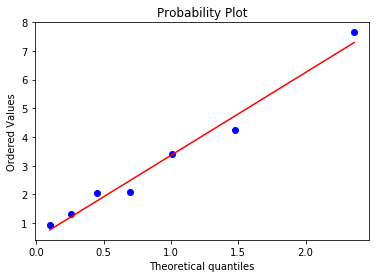



k = 4, size = 21
Number of positive jump times: 1
Mean: 0.692


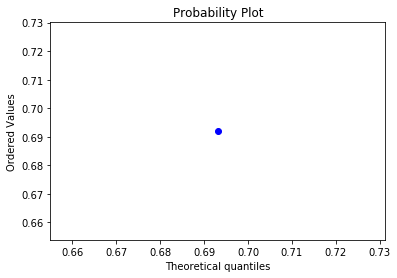



k = 4, size = 22
Number of positive jump times: 0
Mean: nan


k = 5, size = 0
Number of positive jump times: 3044
Mean: 3.593520039421813


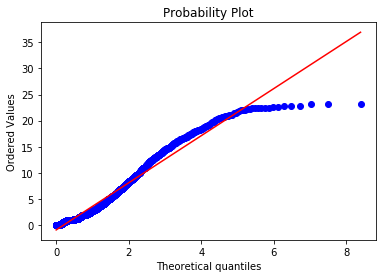



k = 5, size = 1
Number of positive jump times: 370
Mean: 0.46698648648648655


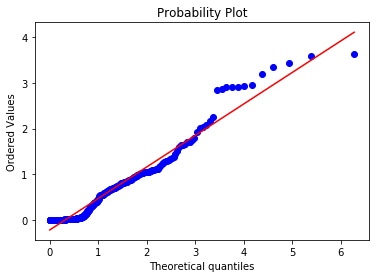



k = 5, size = 2
Number of positive jump times: 248
Mean: 0.45669758064516125


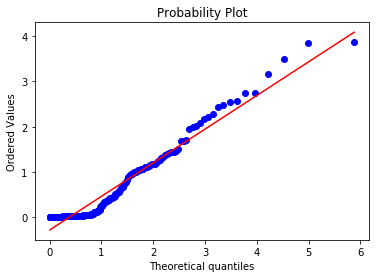



k = 5, size = 3
Number of positive jump times: 544
Mean: 0.2953106617647059


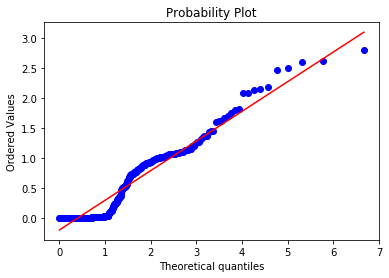



k = 5, size = 4
Number of positive jump times: 237
Mean: 1.06773417721519


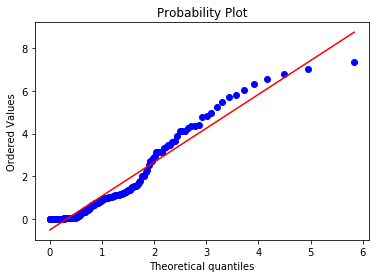



k = 5, size = 5
Number of positive jump times: 125
Mean: 0.914


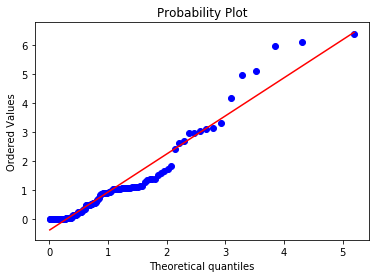



k = 5, size = 6
Number of positive jump times: 114
Mean: 0.8412719298245614


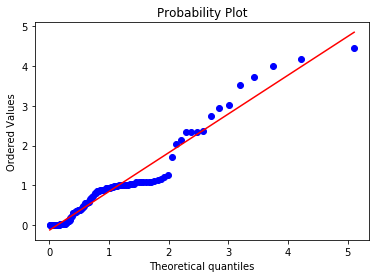



k = 5, size = 7
Number of positive jump times: 27
Mean: 1.0247407407407405


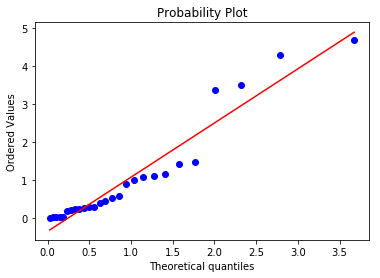



k = 5, size = 8
Number of positive jump times: 26
Mean: 0.10657692307692306


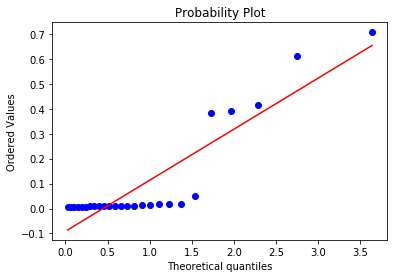



k = 5, size = 9
Number of positive jump times: 19
Mean: 3.1172631578947367


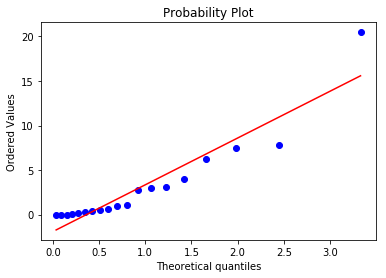



k = 5, size = 10
Number of positive jump times: 2
Mean: 1.9949999999999999


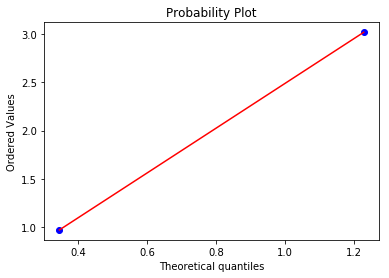



k = 5, size = 11
Number of positive jump times: 1
Mean: 1.949


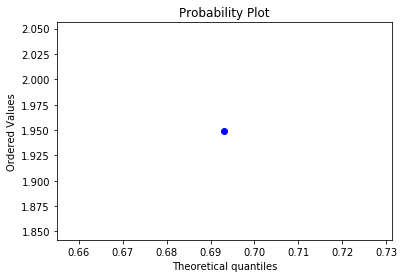



k = 5, size = 12
Number of positive jump times: 0
Mean: nan


k = 5, size = 13
Number of positive jump times: 0
Mean: nan


k = 5, size = 14
Number of positive jump times: 0
Mean: nan


k = 5, size = 15
Number of positive jump times: 0
Mean: nan


k = 5, size = 16
Number of positive jump times: 0
Mean: nan


k = 5, size = 17
Number of positive jump times: 0
Mean: nan


k = 5, size = 18
Number of positive jump times: 22
Mean: 10.272636363636364


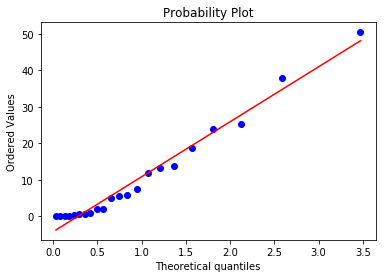



k = 5, size = 19
Number of positive jump times: 85
Mean: 6.186729411764706


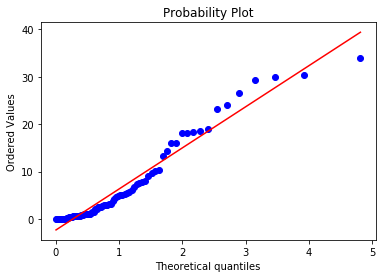



k = 5, size = 20
Number of positive jump times: 61
Mean: 0.2667377049180328


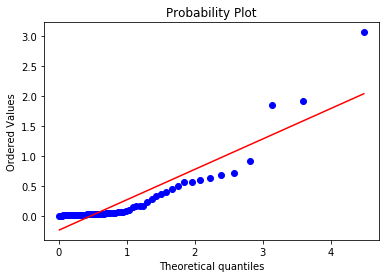



k = 5, size = 21
Number of positive jump times: 48
Mean: 2.4174375


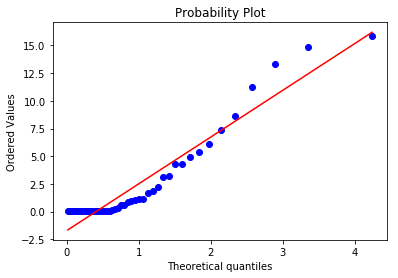



k = 5, size = 22
Number of positive jump times: 8
Mean: 1.104875


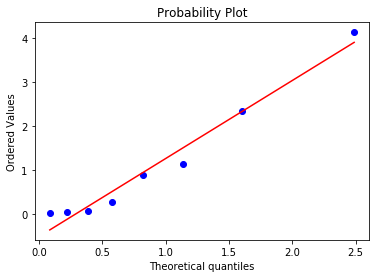



k = 5, size = 23
Number of positive jump times: 0
Mean: nan


k = 5, size = 24
Number of positive jump times: 0
Mean: nan


k = 5, size = 25
Number of positive jump times: 0
Mean: nan


k = 6, size = 0
Number of positive jump times: 2648
Mean: 4.300894637462235


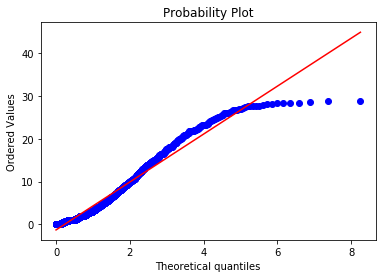



k = 6, size = 1
Number of positive jump times: 298
Mean: 1.3862919463087249


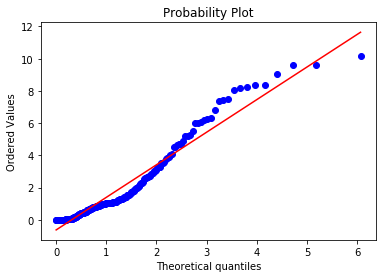



k = 6, size = 2
Number of positive jump times: 312
Mean: 0.695900641025641


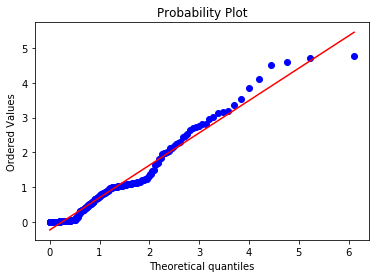



k = 6, size = 3
Number of positive jump times: 402
Mean: 0.8291019900497512


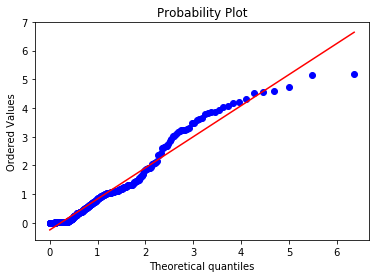



k = 6, size = 4
Number of positive jump times: 332
Mean: 0.6133102409638556


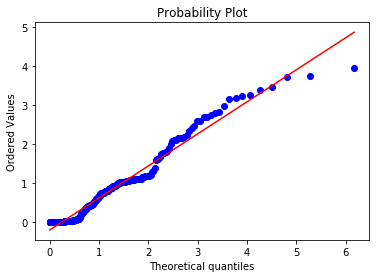



k = 6, size = 5
Number of positive jump times: 296
Mean: 0.6303885135135134


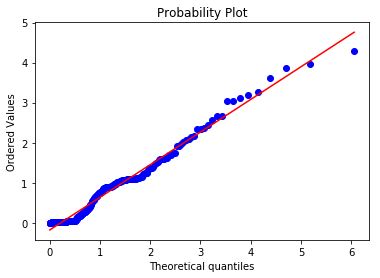



k = 6, size = 6
Number of positive jump times: 230
Mean: 0.6059304347826087


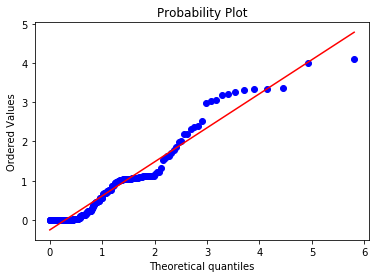



k = 6, size = 7
Number of positive jump times: 110
Mean: 0.6584363636363636


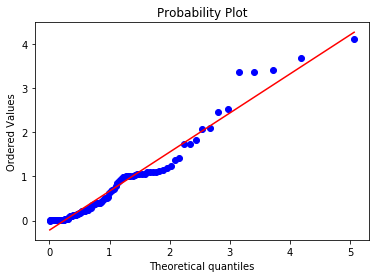



k = 6, size = 8
Number of positive jump times: 15
Mean: 1.407733333333333


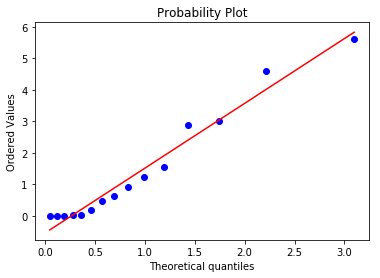



k = 6, size = 9
Number of positive jump times: 4
Mean: 11.253


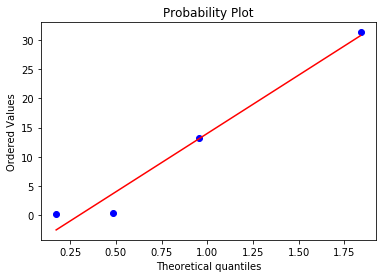



k = 6, size = 10
Number of positive jump times: 0
Mean: nan


k = 6, size = 11
Number of positive jump times: 0
Mean: nan


k = 6, size = 12
Number of positive jump times: 0
Mean: nan


k = 6, size = 13
Number of positive jump times: 0
Mean: nan


k = 6, size = 14
Number of positive jump times: 0
Mean: nan


k = 6, size = 15
Number of positive jump times: 0
Mean: nan


k = 6, size = 16
Number of positive jump times: 0
Mean: nan


k = 6, size = 17
Number of positive jump times: 62
Mean: 4.887500000000001


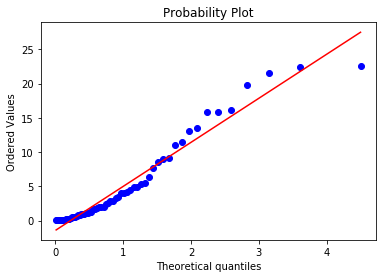



k = 6, size = 18
Number of positive jump times: 2
Mean: 0.704


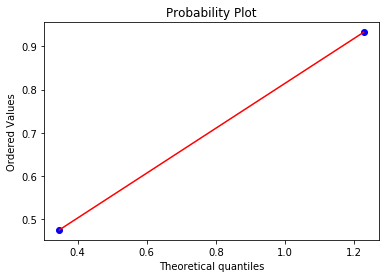



k = 6, size = 19
Number of positive jump times: 5
Mean: 0.036000000000000004


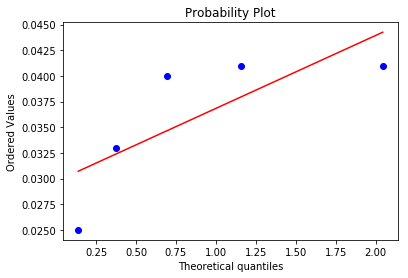



k = 6, size = 20
Number of positive jump times: 1
Mean: 0.739


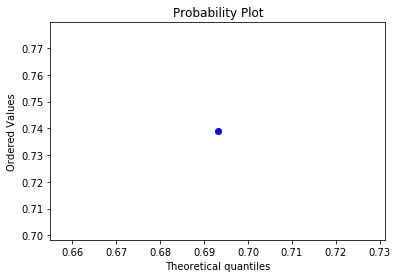



k = 7, size = 0
Number of positive jump times: 2844
Mean: 3.9864149085794653


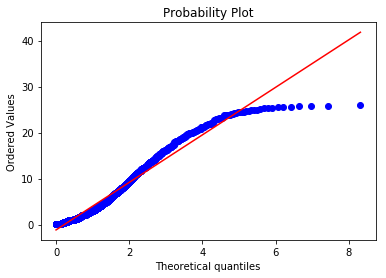



k = 7, size = 1
Number of positive jump times: 464
Mean: 0.654866379310345


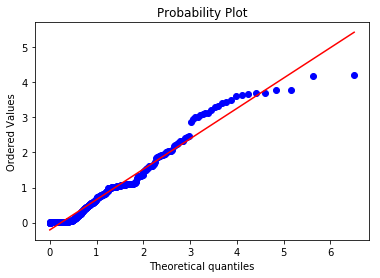



k = 7, size = 2
Number of positive jump times: 449
Mean: 0.6137839643652562


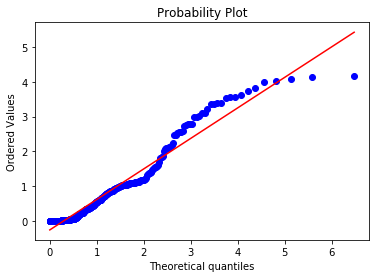



k = 7, size = 3
Number of positive jump times: 500
Mean: 0.6986140000000001


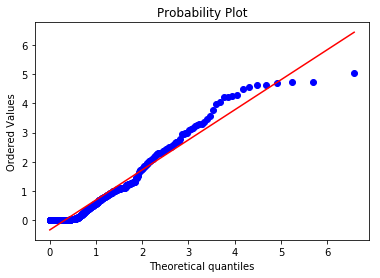



k = 7, size = 4
Number of positive jump times: 252
Mean: 1.232115079365079


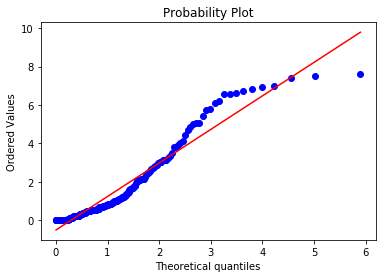



k = 7, size = 5
Number of positive jump times: 178
Mean: 0.9190168539325841


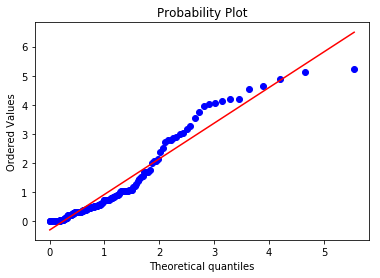



k = 7, size = 6
Number of positive jump times: 107
Mean: 1.4338878504672898


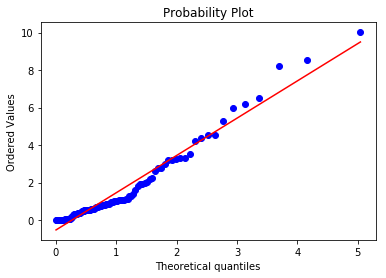



k = 7, size = 7
Number of positive jump times: 89
Mean: 1.1387528089887642


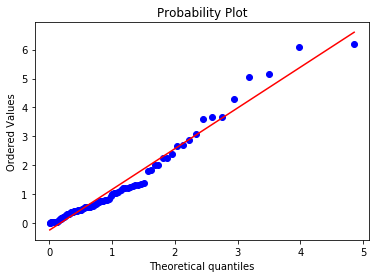



k = 7, size = 8
Number of positive jump times: 6
Mean: 0.7728333333333334


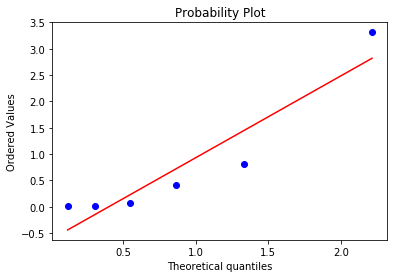



k = 7, size = 9
Number of positive jump times: 4
Mean: 1.29475


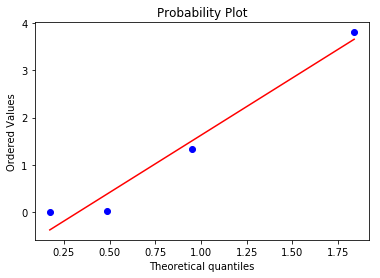



k = 7, size = 10
Number of positive jump times: 0
Mean: nan


k = 7, size = 11
Number of positive jump times: 0
Mean: nan


k = 7, size = 12
Number of positive jump times: 0
Mean: nan


k = 7, size = 13
Number of positive jump times: 0
Mean: nan


k = 7, size = 14
Number of positive jump times: 0
Mean: nan


k = 7, size = 15
Number of positive jump times: 0
Mean: nan


k = 7, size = 16
Number of positive jump times: 85
Mean: 6.2719764705882355


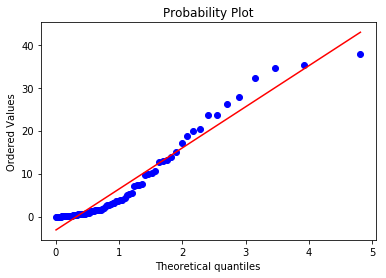



k = 7, size = 17
Number of positive jump times: 43
Mean: 2.2059069767441866


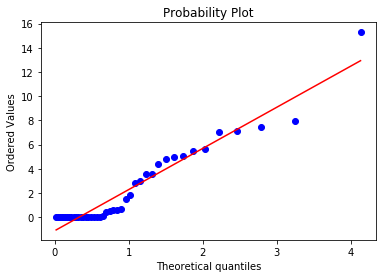



k = 7, size = 18
Number of positive jump times: 32
Mean: 1.80059375


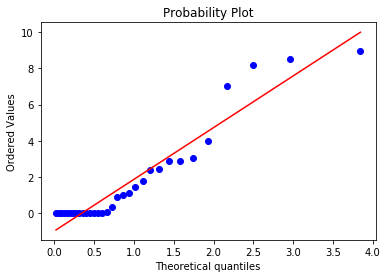



k = 7, size = 19
Number of positive jump times: 1
Mean: 8.628


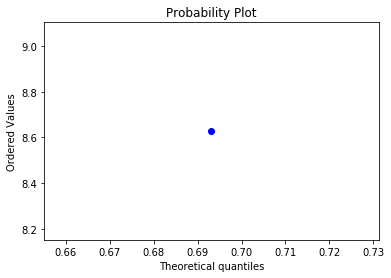



k = 7, size = 20
Number of positive jump times: 1
Mean: 1.275


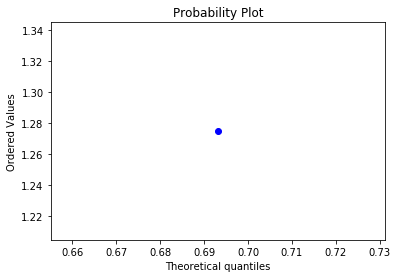



k = 8, size = 0
Number of positive jump times: 3079
Mean: 3.603220526144852


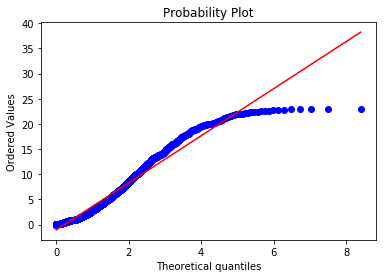



k = 8, size = 1
Number of positive jump times: 305
Mean: 0.5510065573770493


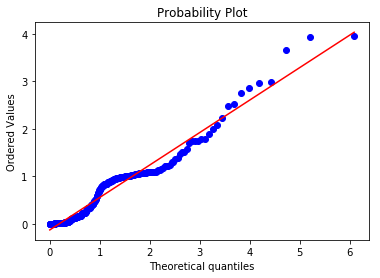



k = 8, size = 2
Number of positive jump times: 406
Mean: 0.8087906403940888


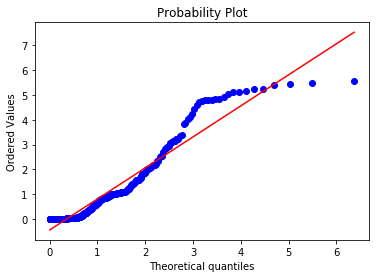



k = 8, size = 3
Number of positive jump times: 618
Mean: 0.4791747572815534


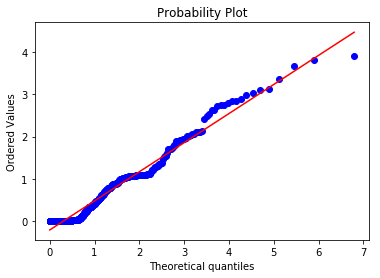



k = 8, size = 4
Number of positive jump times: 680
Mean: 0.450075


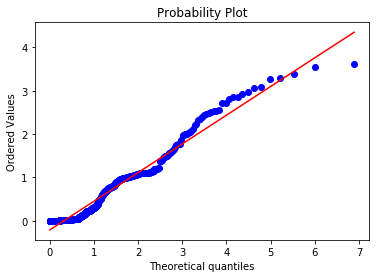



k = 8, size = 5
Number of positive jump times: 555
Mean: 0.3545387387387387


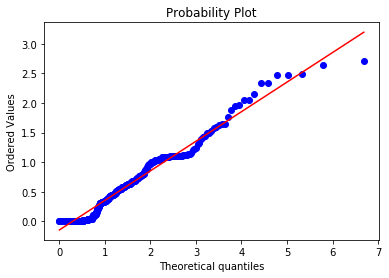



k = 8, size = 6
Number of positive jump times: 443
Mean: 0.3599661399548532


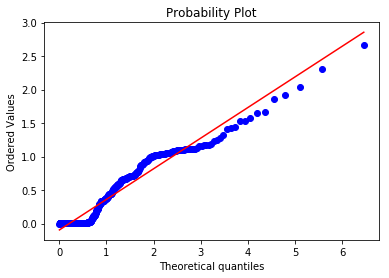



k = 8, size = 7
Number of positive jump times: 166
Mean: 0.35493975903614455


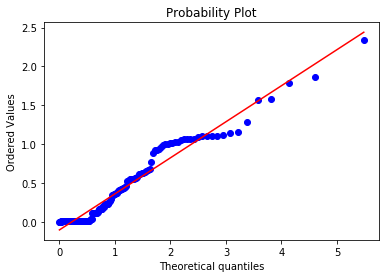



k = 8, size = 8
Number of positive jump times: 23
Mean: 0.5545217391304348


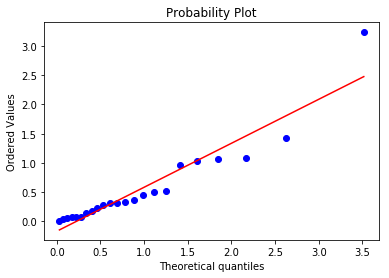



k = 8, size = 9
Number of positive jump times: 4
Mean: 0.3685


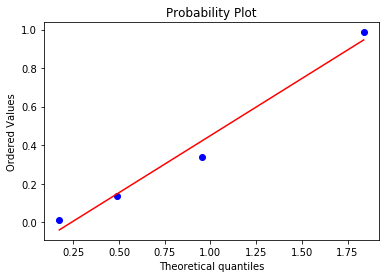



k = 8, size = 10
Number of positive jump times: 0
Mean: nan


k = 8, size = 11
Number of positive jump times: 0
Mean: nan


k = 8, size = 12
Number of positive jump times: 0
Mean: nan


k = 8, size = 13
Number of positive jump times: 0
Mean: nan


k = 8, size = 14
Number of positive jump times: 0
Mean: nan


k = 8, size = 15
Number of positive jump times: 0
Mean: nan


k = 8, size = 16
Number of positive jump times: 0
Mean: nan


k = 8, size = 17
Number of positive jump times: 0
Mean: nan


k = 8, size = 18
Number of positive jump times: 0
Mean: nan


k = 8, size = 19
Number of positive jump times: 0
Mean: nan


k = 8, size = 20
Number of positive jump times: 18
Mean: 1.6825


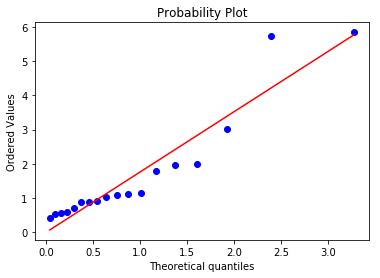



k = 8, size = 21
Number of positive jump times: 27
Mean: 7.478629629629631


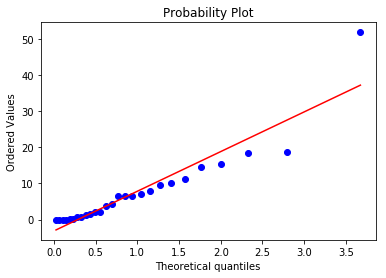



k = 8, size = 22
Number of positive jump times: 22
Mean: 0.4278636363636364


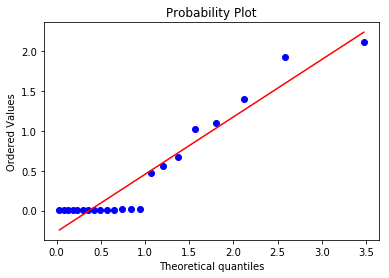



k = 8, size = 23
Number of positive jump times: 3
Mean: 3.475333333333333


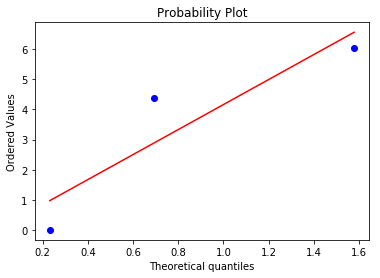



k = 8, size = 24
Number of positive jump times: 4
Mean: 1.99325


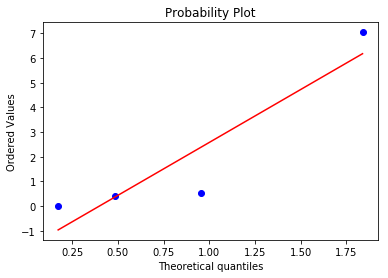



k = 8, size = 25
Number of positive jump times: 7
Mean: 5.0994285714285725


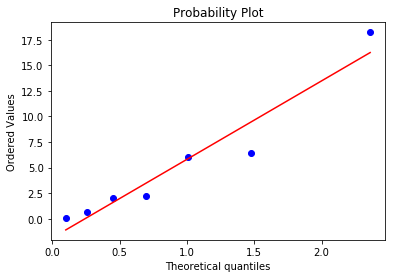



k = 8, size = 26
Number of positive jump times: 0
Mean: nan


k = 8, size = 27
Number of positive jump times: 0
Mean: nan


k = 9, size = 0
Number of positive jump times: 2525
Mean: 3.447215445544555


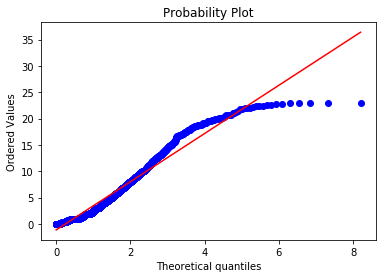



k = 9, size = 1
Number of positive jump times: 373
Mean: 0.5506756032171581


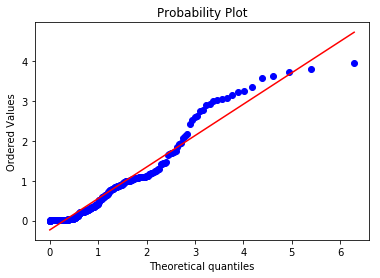



k = 9, size = 2
Number of positive jump times: 307
Mean: 0.5698631921824104


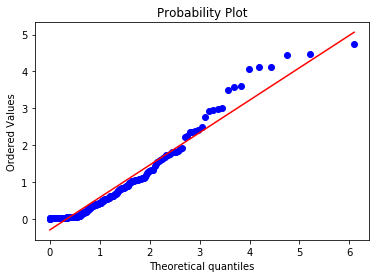



k = 9, size = 3
Number of positive jump times: 419
Mean: 0.3274606205250597


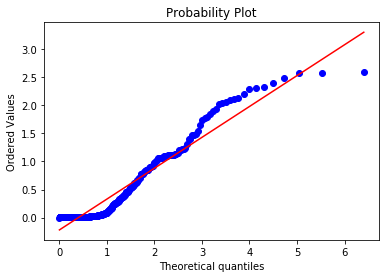



k = 9, size = 4
Number of positive jump times: 264
Mean: 0.7893219696969697


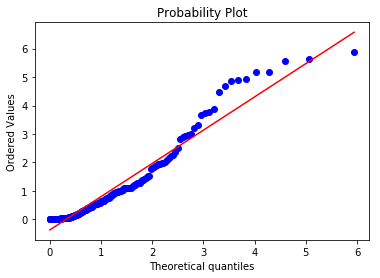



k = 9, size = 5
Number of positive jump times: 128
Mean: 1.52159375


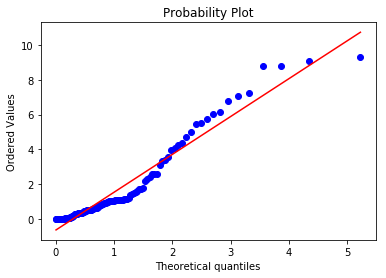



k = 9, size = 6
Number of positive jump times: 114
Mean: 0.9051929824561404


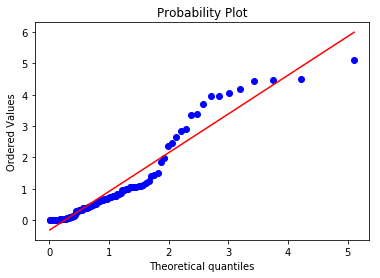



k = 9, size = 7
Number of positive jump times: 27
Mean: 1.081925925925926


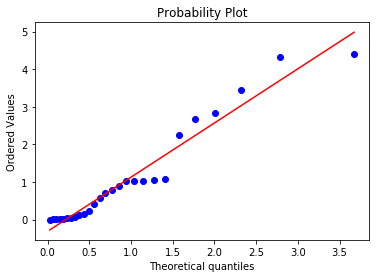



k = 9, size = 8
Number of positive jump times: 24
Mean: 1.1178333333333335


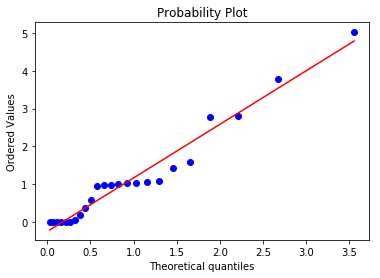



k = 9, size = 9
Number of positive jump times: 8
Mean: 0.332625


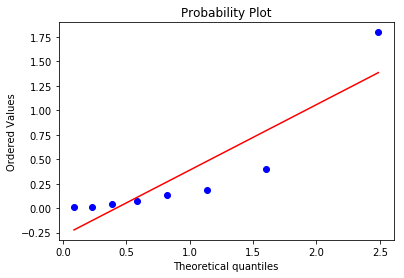



k = 9, size = 10
Number of positive jump times: 2
Mean: 5.0515


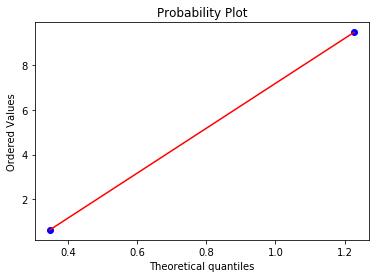



k = 9, size = 11
Number of positive jump times: 5
Mean: 22.200999999999997


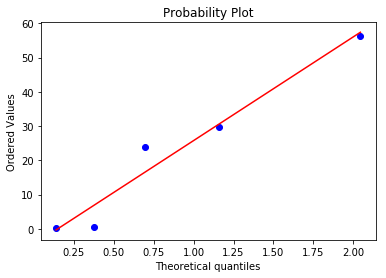



k = 9, size = 12
Number of positive jump times: 0
Mean: nan


k = 9, size = 13
Number of positive jump times: 1
Mean: 0.6


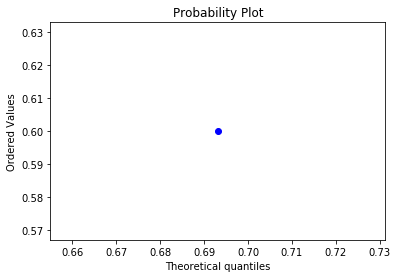



k = 9, size = 14
Number of positive jump times: 0
Mean: nan


k = 9, size = 15
Number of positive jump times: 0
Mean: nan


k = 9, size = 16
Number of positive jump times: 0
Mean: nan


k = 9, size = 17
Number of positive jump times: 0
Mean: nan


k = 9, size = 18
Number of positive jump times: 53
Mean: 4.563433962264151


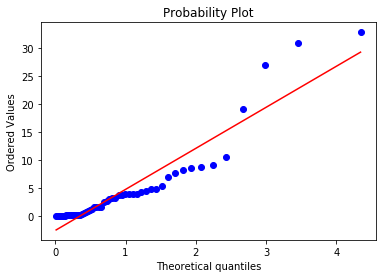



k = 9, size = 19
Number of positive jump times: 142
Mean: 2.6899718309859155


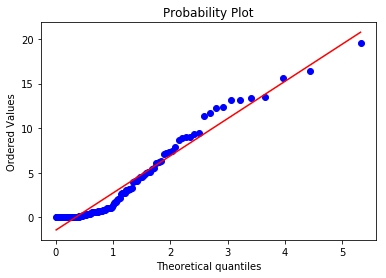



k = 9, size = 20
Number of positive jump times: 34
Mean: 0.20505882352941174


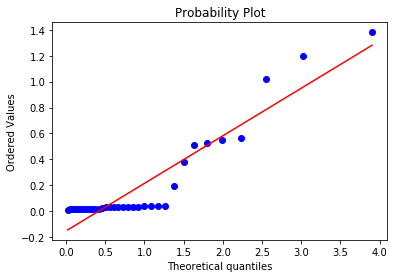



k = 9, size = 21
Number of positive jump times: 75
Mean: 0.028800000000000003


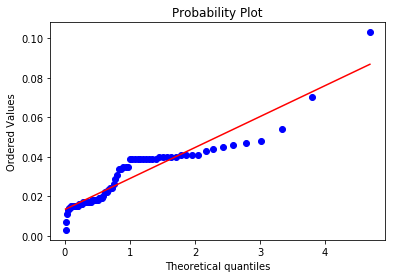



k = 9, size = 22
Number of positive jump times: 8
Mean: 1.760875


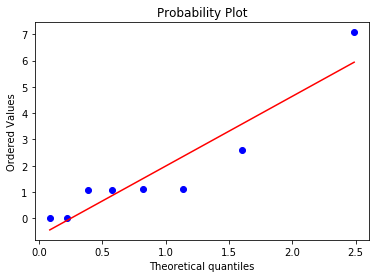



k = 9, size = 23
Number of positive jump times: 2
Mean: 3.5815


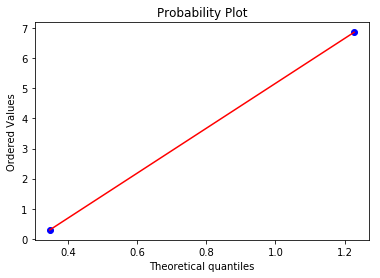



k = 10, size = 0
Number of positive jump times: 1806
Mean: 3.087


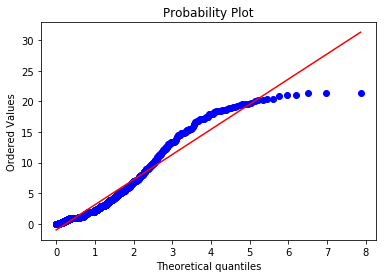



k = 10, size = 1
Number of positive jump times: 418
Mean: 0.4549425837320574


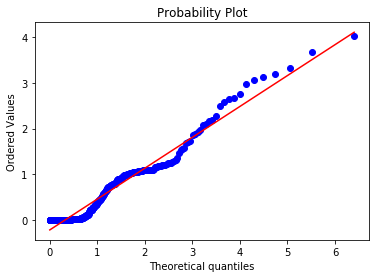



k = 10, size = 2
Number of positive jump times: 211
Mean: 0.9260758293838862


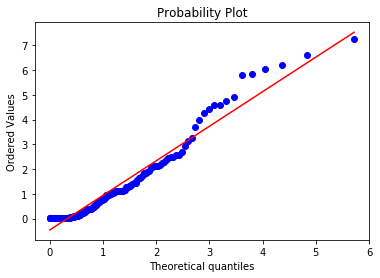



k = 10, size = 3
Number of positive jump times: 348
Mean: 0.5202557471264369


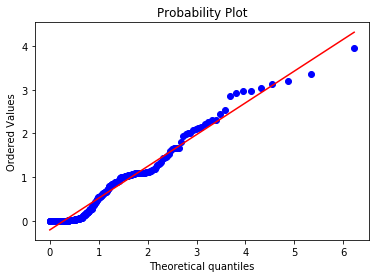



k = 10, size = 4
Number of positive jump times: 308
Mean: 0.910077922077922


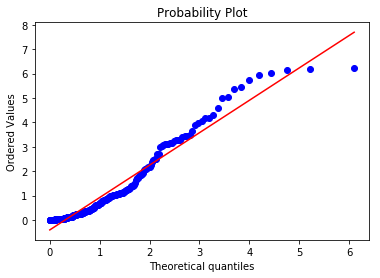



k = 10, size = 5
Number of positive jump times: 255
Mean: 0.8086705882352941


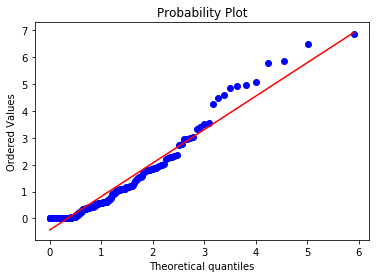



k = 10, size = 6
Number of positive jump times: 270
Mean: 0.39531851851851846


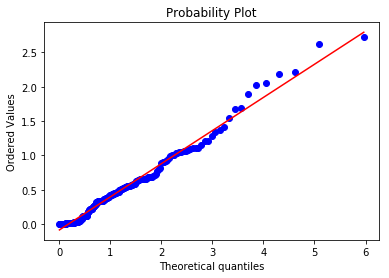



k = 10, size = 7
Number of positive jump times: 205
Mean: 0.572209756097561


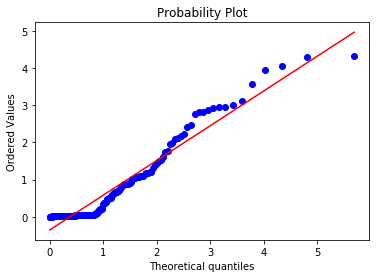



k = 10, size = 8
Number of positive jump times: 225
Mean: 0.5984533333333333


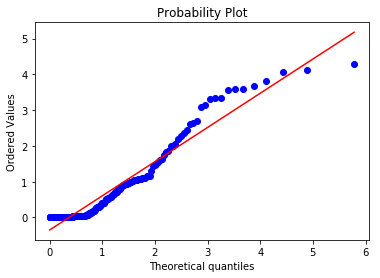



k = 10, size = 9
Number of positive jump times: 286
Mean: 0.5324300699300699


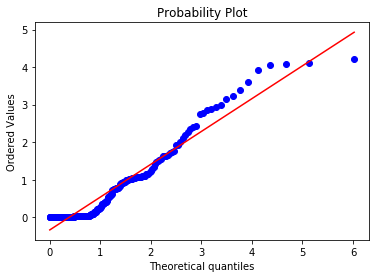



k = 10, size = 10
Number of positive jump times: 130
Mean: 0.699376923076923


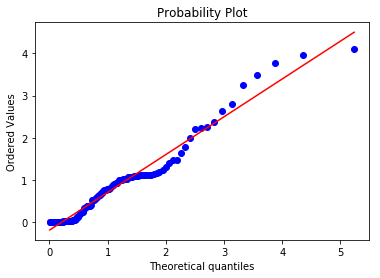



k = 10, size = 11
Number of positive jump times: 83
Mean: 1.8210481927710842


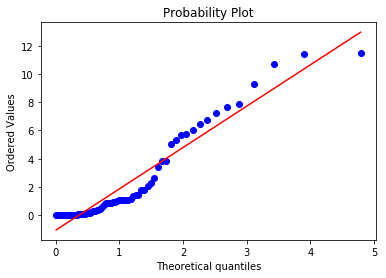



k = 10, size = 12
Number of positive jump times: 38
Mean: 1.2754736842105265


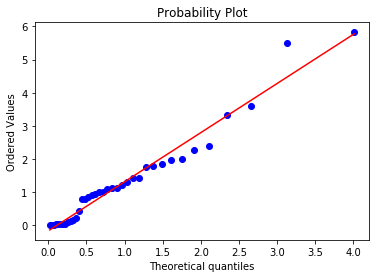



k = 10, size = 13
Number of positive jump times: 29
Mean: 0.4976206896551724


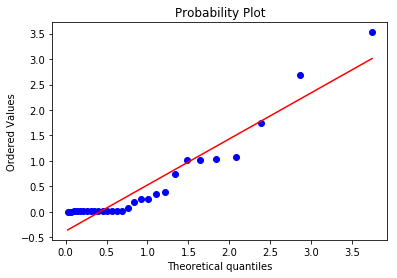



k = 10, size = 14
Number of positive jump times: 7
Mean: 0.32242857142857145


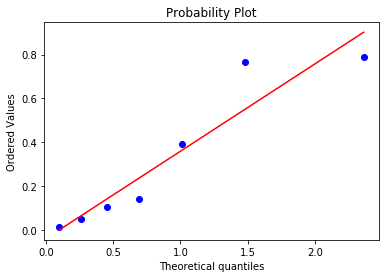



k = 10, size = 15
Number of positive jump times: 0
Mean: nan


k = 10, size = 16
Number of positive jump times: 0
Mean: nan


k = 10, size = 17
Number of positive jump times: 0
Mean: nan


k = 10, size = 18
Number of positive jump times: 0
Mean: nan


k = 10, size = 19
Number of positive jump times: 0
Mean: nan


k = 10, size = 20
Number of positive jump times: 0
Mean: nan


k = 10, size = 21
Number of positive jump times: 32
Mean: 0.9308124999999999


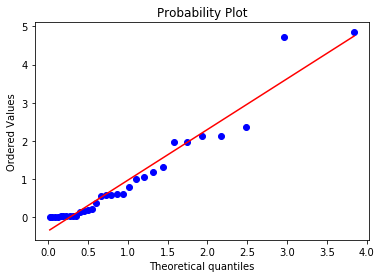



k = 10, size = 22
Number of positive jump times: 7
Mean: 0.20342857142857146


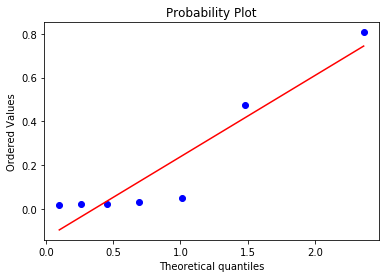



k = 10, size = 23
Number of positive jump times: 4
Mean: 4.55075


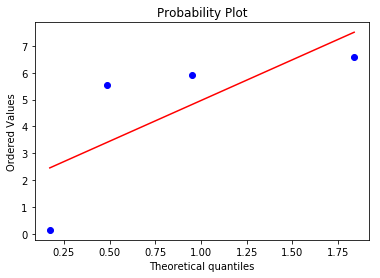



k = 10, size = 24
Number of positive jump times: 0
Mean: nan


k = 10, size = 25
Number of positive jump times: 0
Mean: nan


k = 10, size = 26
Number of positive jump times: 1
Mean: 0.04


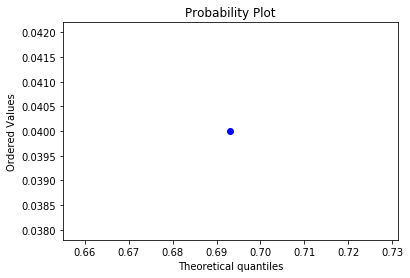



k = 10, size = 27
Number of positive jump times: 0
Mean: nan


k = 10, size = 28
Number of positive jump times: 0
Mean: nan


k = 10, size = 29
Number of positive jump times: 0
Mean: nan


k = 10, size = 30
Number of positive jump times: 0
Mean: nan


k = -10, size = 1
Number of negative jump times: 30
Mean: 78.70773333333334


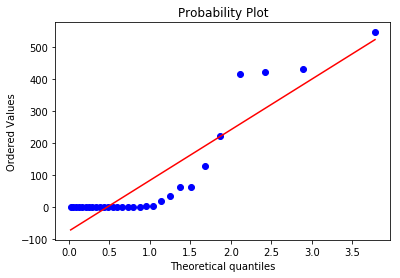



k = -10, size = 2
Number of negative jump times: 33
Mean: 43.28357575757576


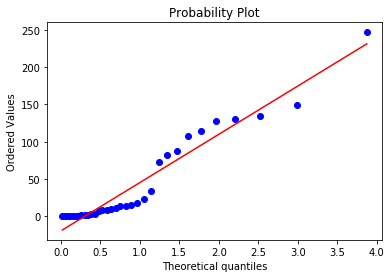



k = -10, size = 3
Number of negative jump times: 12
Mean: 72.08808333333333


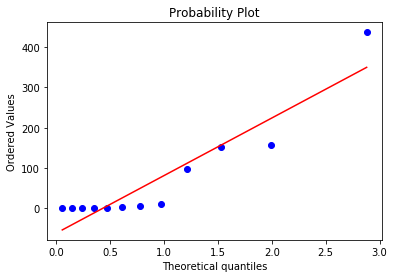



k = -10, size = 4
Number of negative jump times: 2
Mean: 243.307


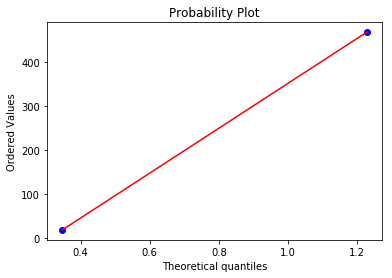



k = -10, size = 5
Number of negative jump times: 0
Mean: nan


k = -10, size = 6
Number of negative jump times: 0
Mean: nan


k = -10, size = 7
Number of negative jump times: 0
Mean: nan


k = -10, size = 8
Number of negative jump times: 0
Mean: nan


k = -10, size = 9
Number of negative jump times: 0
Mean: nan


k = -10, size = 10
Number of negative jump times: 1
Mean: 373.572


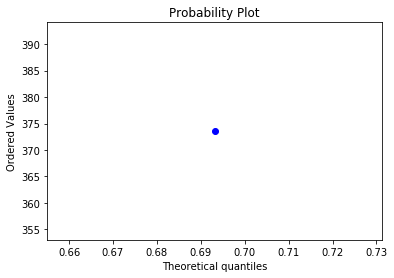



k = -10, size = 11
Number of negative jump times: 0
Mean: nan


k = -10, size = 12
Number of negative jump times: 3
Mean: 44.74633333333333


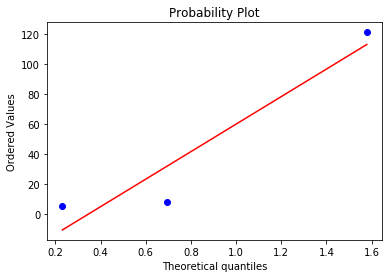



k = -10, size = 13
Number of negative jump times: 12
Mean: 2.638


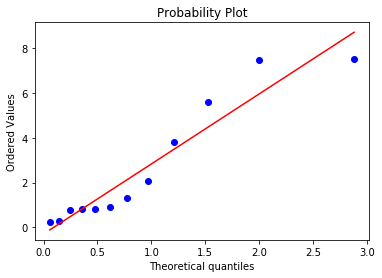



k = -10, size = 14
Number of negative jump times: 1
Mean: 1.647


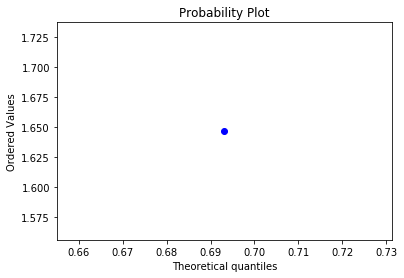



k = -9, size = 1
Number of negative jump times: 64
Mean: 12.635296874999998


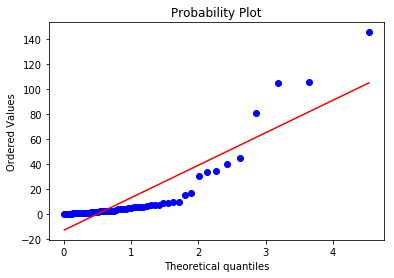



k = -9, size = 2
Number of negative jump times: 14
Mean: 2.532428571428571


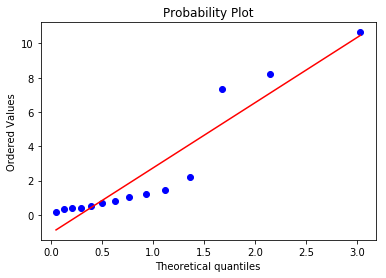



k = -9, size = 3
Number of negative jump times: 26
Mean: 2.7873076923076923


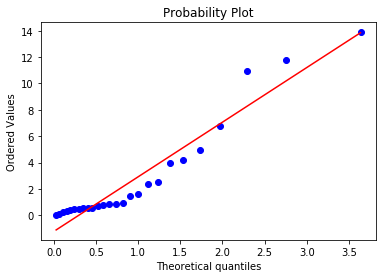



k = -9, size = 4
Number of negative jump times: 0
Mean: nan


k = -9, size = 5
Number of negative jump times: 0
Mean: nan


k = -9, size = 6
Number of negative jump times: 0
Mean: nan


k = -9, size = 7
Number of negative jump times: 0
Mean: nan


k = -9, size = 8
Number of negative jump times: 2
Mean: 27.127000000000002


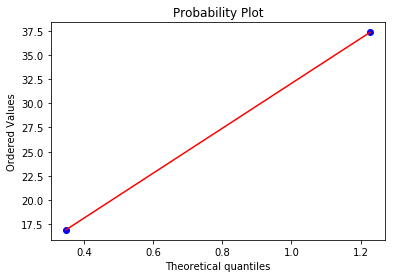



k = -9, size = 9
Number of negative jump times: 0
Mean: nan


k = -9, size = 10
Number of negative jump times: 0
Mean: nan


k = -9, size = 11
Number of negative jump times: 0
Mean: nan


k = -9, size = 12
Number of negative jump times: 0
Mean: nan


k = -8, size = 1
Number of negative jump times: 97
Mean: 1.939783505154639


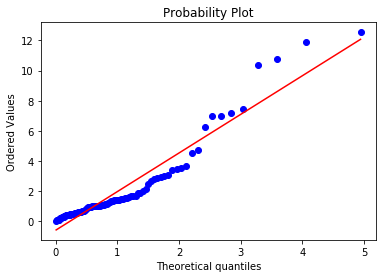



k = -8, size = 2
Number of negative jump times: 30
Mean: 9.206800000000003


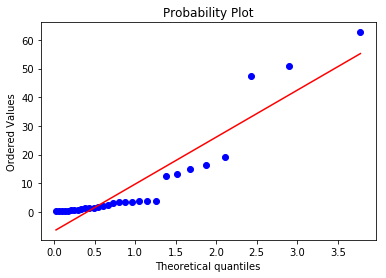



k = -8, size = 3
Number of negative jump times: 21
Mean: 2.0163333333333333


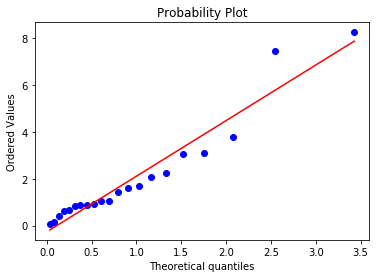



k = -8, size = 4
Number of negative jump times: 8
Mean: 0.6872499999999999


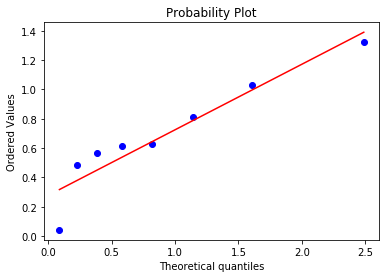



k = -8, size = 5
Number of negative jump times: 0
Mean: nan


k = -8, size = 6
Number of negative jump times: 0
Mean: nan


k = -8, size = 7
Number of negative jump times: 0
Mean: nan


k = -8, size = 8
Number of negative jump times: 0
Mean: nan


k = -8, size = 9
Number of negative jump times: 0
Mean: nan


k = -8, size = 10
Number of negative jump times: 1
Mean: 3.002


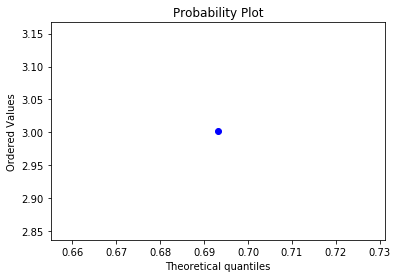



k = -8, size = 11
Number of negative jump times: 9
Mean: 3.883666666666666


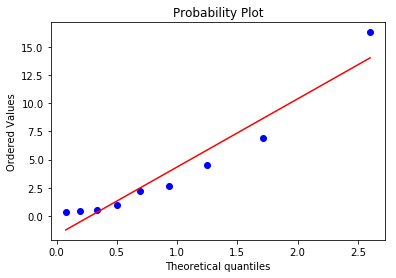



k = -8, size = 12
Number of negative jump times: 6
Mean: 3.1838333333333337


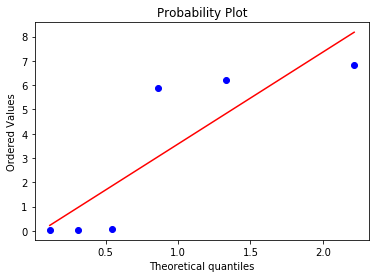



k = -8, size = 13
Number of negative jump times: 31
Mean: 3.4771612903225804


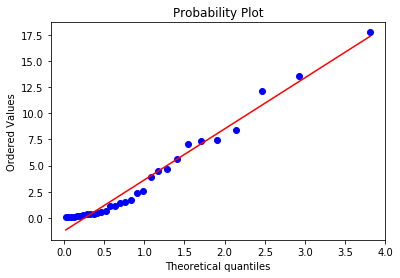



k = -8, size = 14
Number of negative jump times: 12
Mean: 4.217083333333334


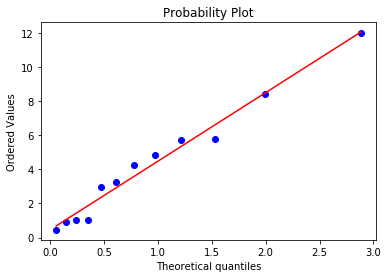



k = -8, size = 15
Number of negative jump times: 3
Mean: 1.8346666666666664


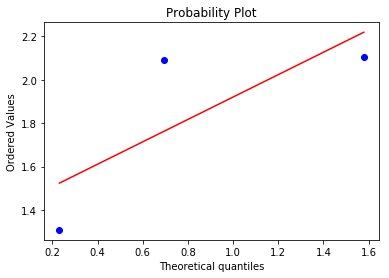



k = -7, size = 1
Number of negative jump times: 52
Mean: 69.47488461538461


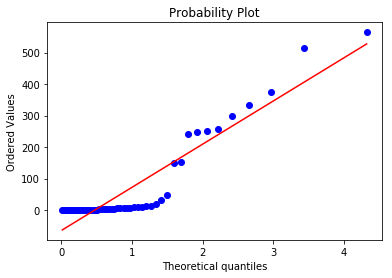



k = -7, size = 2
Number of negative jump times: 111
Mean: 2.547153153153154


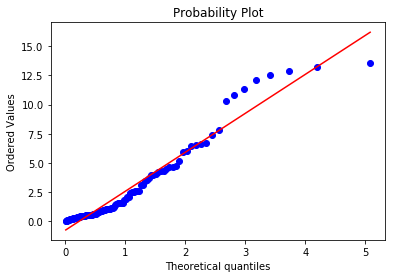



k = -7, size = 3
Number of negative jump times: 13
Mean: 0.6317692307692307


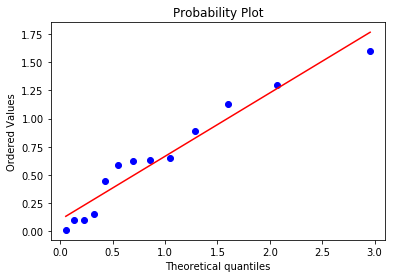



k = -7, size = 4
Number of negative jump times: 101
Mean: 2.453287128712871


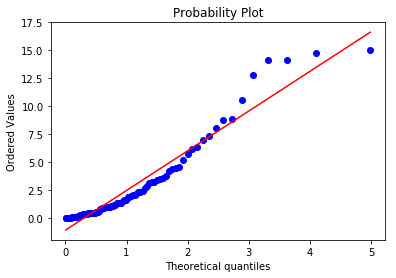



k = -7, size = 5
Number of negative jump times: 37
Mean: 1.1460810810810809


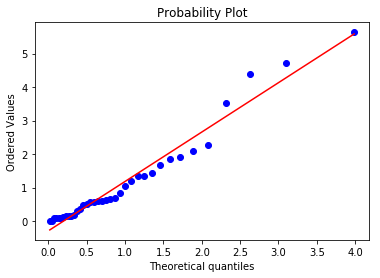



k = -7, size = 6
Number of negative jump times: 38
Mean: 1.7248157894736844


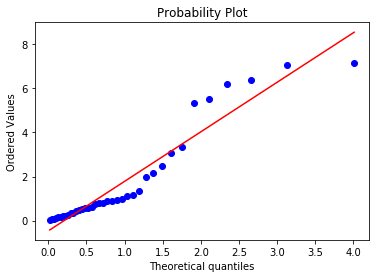



k = -7, size = 7
Number of negative jump times: 6
Mean: 3.374166666666666


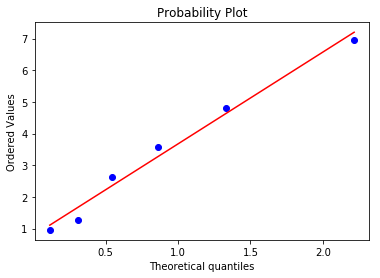



k = -7, size = 8
Number of negative jump times: 2
Mean: 2.457


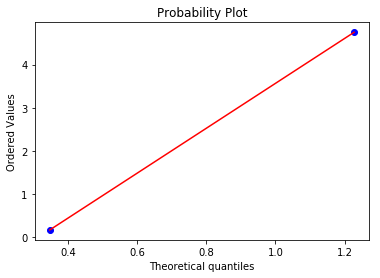



k = -7, size = 9
Number of negative jump times: 0
Mean: nan


k = -7, size = 10
Number of negative jump times: 2
Mean: 198.447


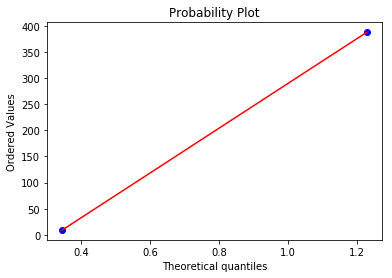



k = -7, size = 11
Number of negative jump times: 12
Mean: 3.298083333333334


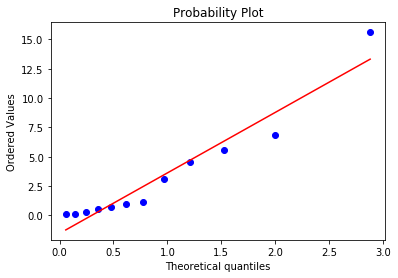



k = -7, size = 12
Number of negative jump times: 3
Mean: 452.146


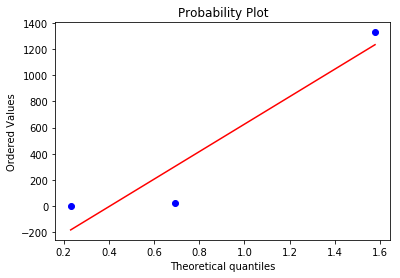



k = -7, size = 13
Number of negative jump times: 6
Mean: 2.2885


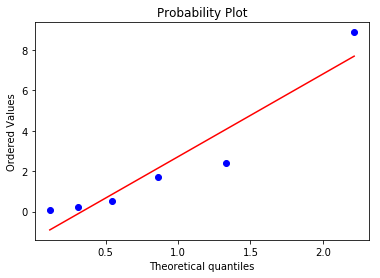



k = -7, size = 14
Number of negative jump times: 11
Mean: 3.2569090909090908


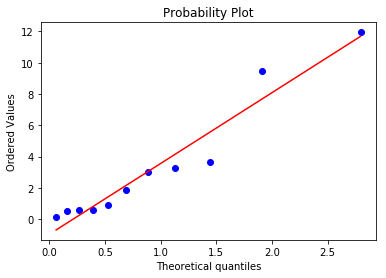



k = -7, size = 15
Number of negative jump times: 10
Mean: 0.8264999999999999


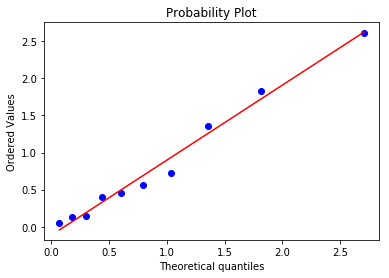



k = -7, size = 16
Number of negative jump times: 19
Mean: 3.3467894736842103


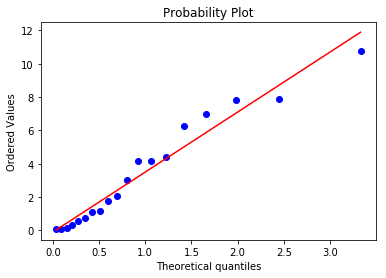



k = -7, size = 17
Number of negative jump times: 3
Mean: 0.534


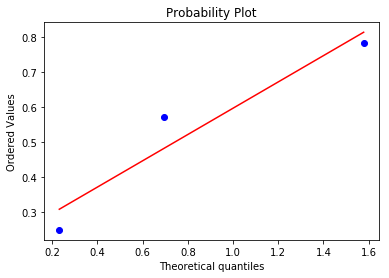



k = -6, size = 1
Number of negative jump times: 157
Mean: 0.7182038216560509


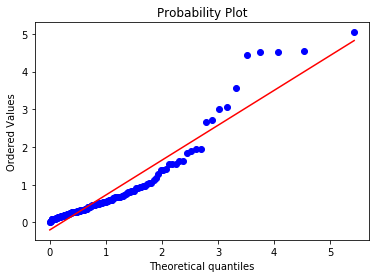



k = -6, size = 2
Number of negative jump times: 97
Mean: 3.571608247422681


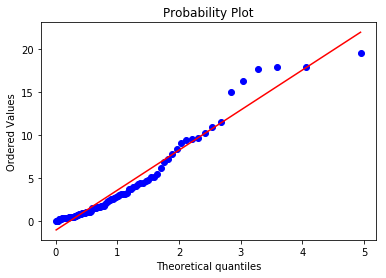



k = -6, size = 3
Number of negative jump times: 69
Mean: 1.2462608695652175


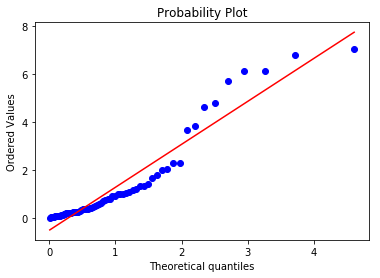



k = -6, size = 4
Number of negative jump times: 30
Mean: 0.4895666666666667


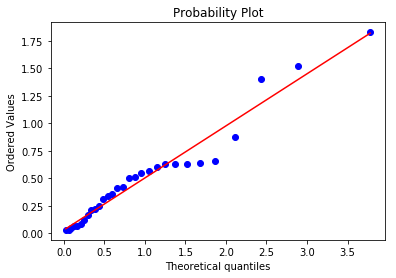



k = -6, size = 5
Number of negative jump times: 27
Mean: 0.6116296296296296


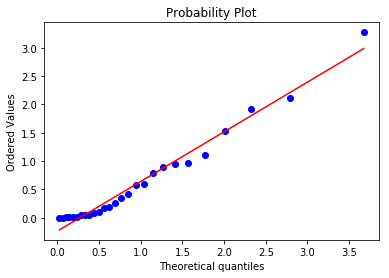



k = -6, size = 6
Number of negative jump times: 14
Mean: 0.434


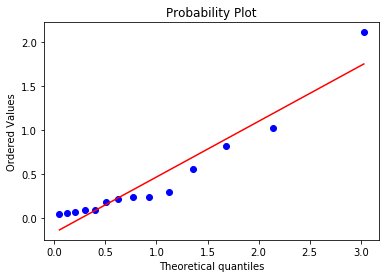



k = -6, size = 7
Number of negative jump times: 4
Mean: 0.16075000000000003


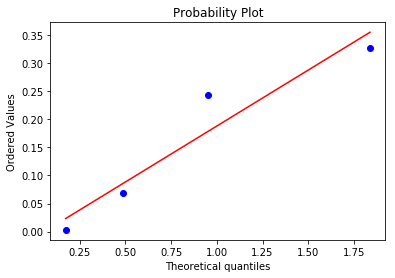



k = -6, size = 8
Number of negative jump times: 0
Mean: nan


k = -6, size = 9
Number of negative jump times: 0
Mean: nan


k = -6, size = 10
Number of negative jump times: 0
Mean: nan


k = -6, size = 11
Number of negative jump times: 0
Mean: nan


k = -6, size = 12
Number of negative jump times: 8
Mean: 8.77675


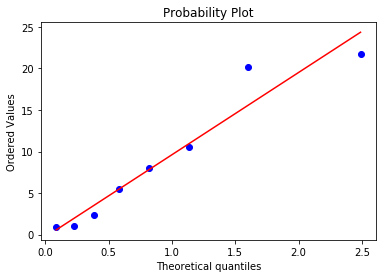



k = -6, size = 13
Number of negative jump times: 66
Mean: 2.008974818181818


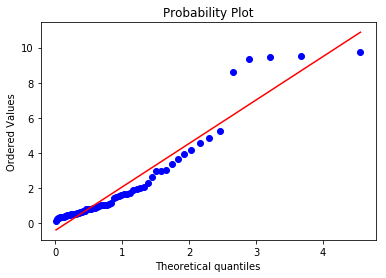



k = -6, size = 14
Number of negative jump times: 20
Mean: 12.264800000000001


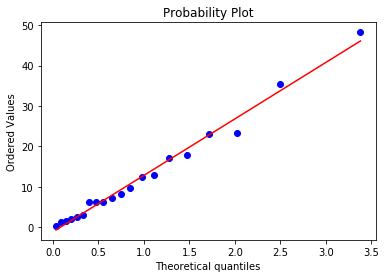



k = -6, size = 15
Number of negative jump times: 77
Mean: 6.927402597402598


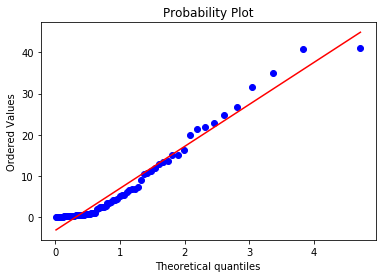



k = -6, size = 16
Number of negative jump times: 54
Mean: 0.6153703703703703


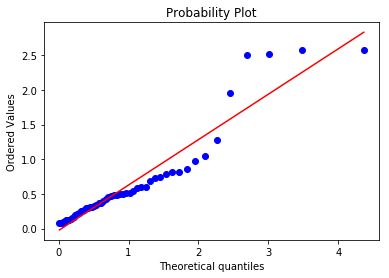



k = -6, size = 17
Number of negative jump times: 9
Mean: 2.091777777777778


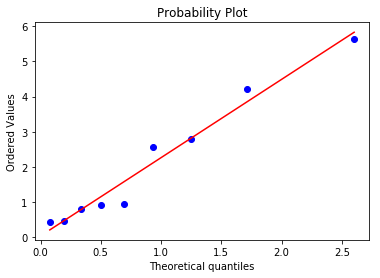



k = -6, size = 18
Number of negative jump times: 2
Mean: 5.2765


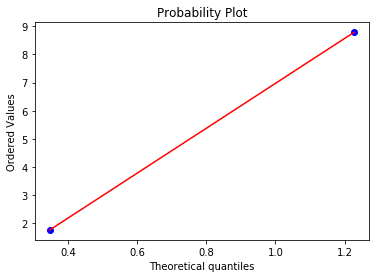



k = -5, size = 1
Number of negative jump times: 334
Mean: 3.1281736526946107


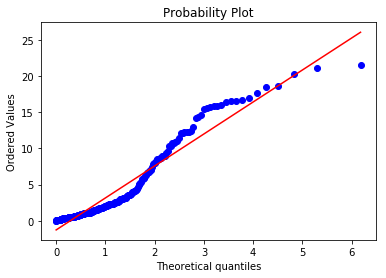



k = -5, size = 2
Number of negative jump times: 138
Mean: 1.6422173913043479


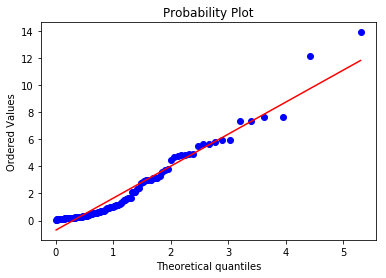



k = -5, size = 3
Number of negative jump times: 156
Mean: 1.0800384615384617


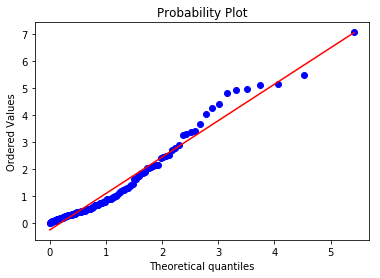



k = -5, size = 4
Number of negative jump times: 157
Mean: 0.7085605095541401


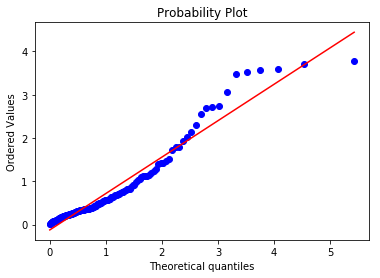



k = -5, size = 5
Number of negative jump times: 110
Mean: 3.0561303454545454


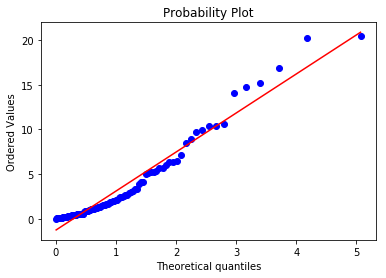



k = -5, size = 6
Number of negative jump times: 19
Mean: 0.8205789473684212


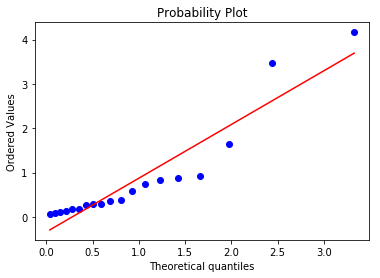



k = -5, size = 7
Number of negative jump times: 5
Mean: 0.9308000000000002


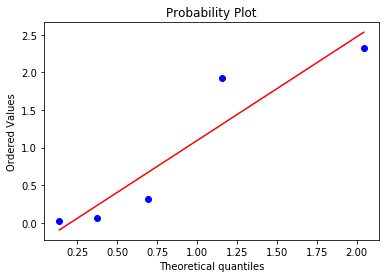



k = -5, size = 8
Number of negative jump times: 2
Mean: 0.5185


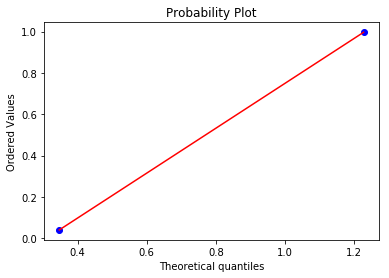



k = -5, size = 9
Number of negative jump times: 0
Mean: nan


k = -5, size = 10
Number of negative jump times: 0
Mean: nan


k = -5, size = 11
Number of negative jump times: 0
Mean: nan


k = -5, size = 12
Number of negative jump times: 0
Mean: nan


k = -5, size = 13
Number of negative jump times: 3
Mean: 18.867


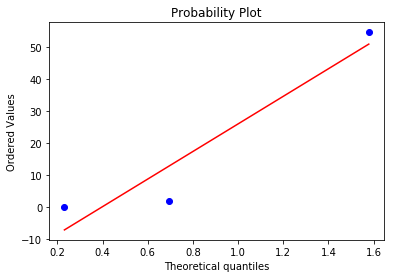



k = -5, size = 14
Number of negative jump times: 8
Mean: 0.891875


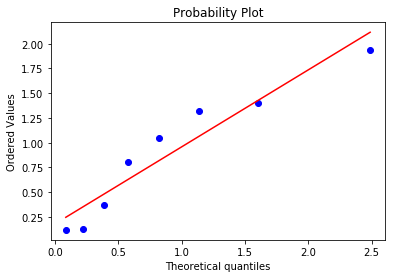



k = -5, size = 15
Number of negative jump times: 4
Mean: 16.657


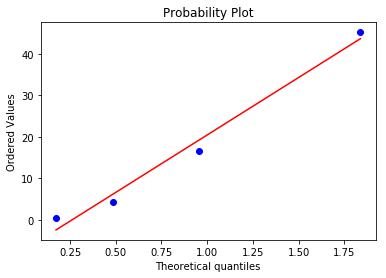



k = -5, size = 16
Number of negative jump times: 5
Mean: 2.8028000000000004


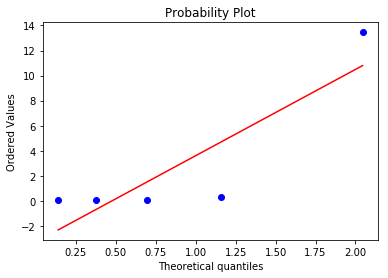



k = -5, size = 17
Number of negative jump times: 115
Mean: 0.6306956521739131


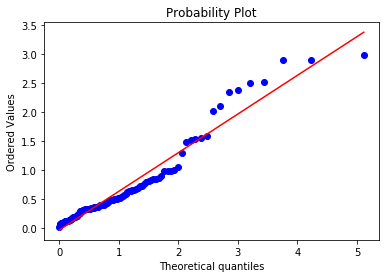



k = -5, size = 18
Number of negative jump times: 2
Mean: 1.7374999999999998


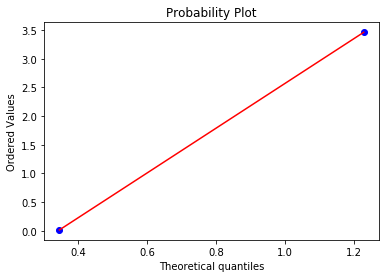



k = -5, size = 19
Number of negative jump times: 0
Mean: nan


k = -5, size = 20
Number of negative jump times: 1
Mean: 0.432


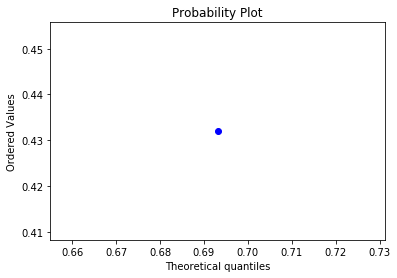



k = -4, size = 1
Number of negative jump times: 320
Mean: 2.4474343750000003


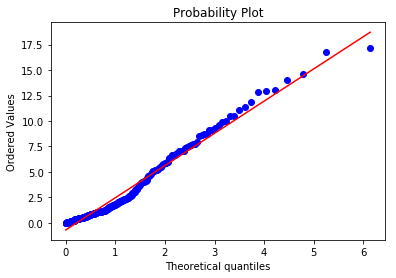



k = -4, size = 2
Number of negative jump times: 178
Mean: 2.3169606741573032


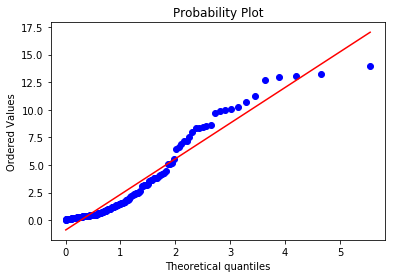



k = -4, size = 3
Number of negative jump times: 93
Mean: 2.092172043010753


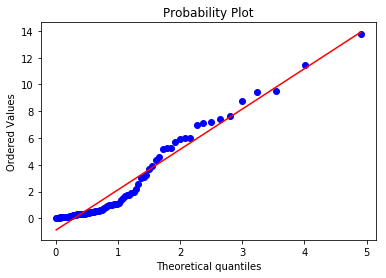



k = -4, size = 4
Number of negative jump times: 64
Mean: 2.30234375


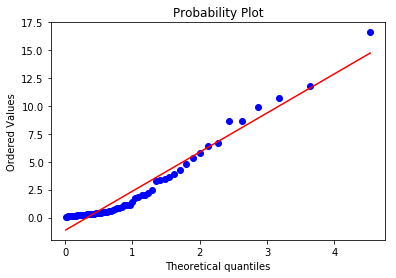



k = -4, size = 5
Number of negative jump times: 93
Mean: 0.5914086021505378


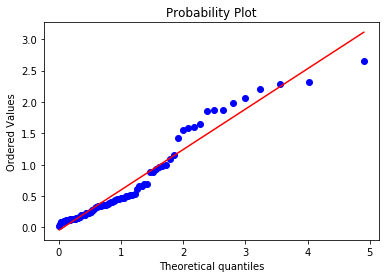



k = -4, size = 6
Number of negative jump times: 17
Mean: 0.5360588235294118


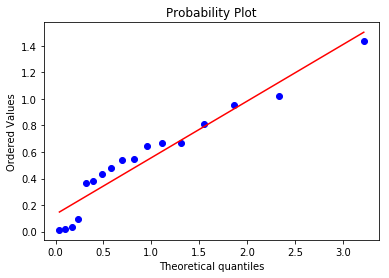



k = -4, size = 7
Number of negative jump times: 5
Mean: 0.42619999999999997


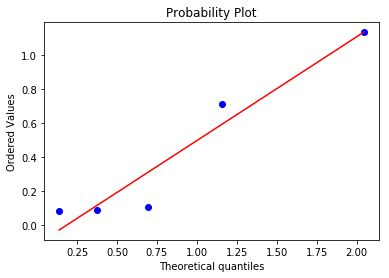



k = -4, size = 8
Number of negative jump times: 0
Mean: nan


k = -4, size = 9
Number of negative jump times: 0
Mean: nan


k = -4, size = 10
Number of negative jump times: 0
Mean: nan


k = -4, size = 11
Number of negative jump times: 0
Mean: nan


k = -4, size = 12
Number of negative jump times: 14
Mean: 6.206428571428572


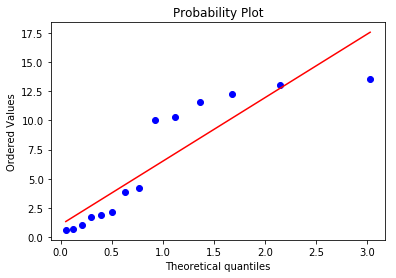



k = -4, size = 13
Number of negative jump times: 210
Mean: 5.344904761904761


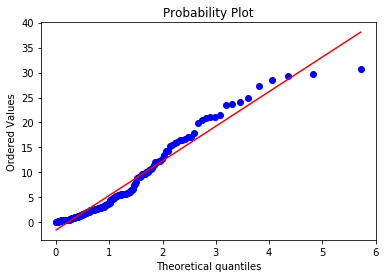



k = -4, size = 14
Number of negative jump times: 32
Mean: 3.785375


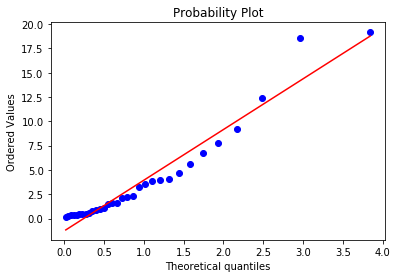



k = -4, size = 15
Number of negative jump times: 59
Mean: 9.87198305084746


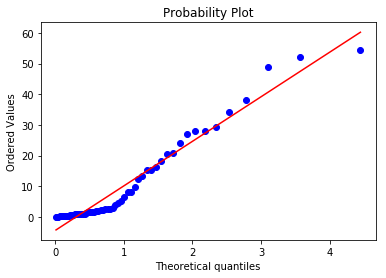



k = -4, size = 16
Number of negative jump times: 16
Mean: 3.009


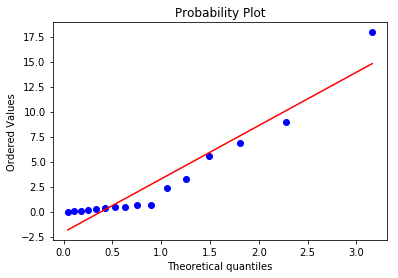



k = -4, size = 17
Number of negative jump times: 4
Mean: 3.6105


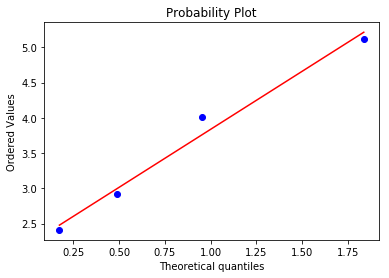



k = -4, size = 18
Number of negative jump times: 48
Mean: 5.143541666666667


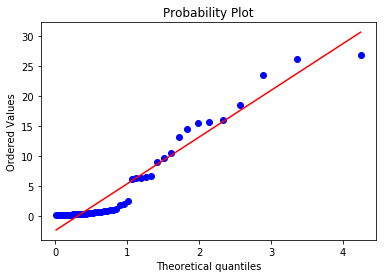



k = -4, size = 19
Number of negative jump times: 0
Mean: nan


k = -4, size = 20
Number of negative jump times: 0
Mean: nan


k = -4, size = 21
Number of negative jump times: 0
Mean: nan


k = -4, size = 22
Number of negative jump times: 1
Mean: 3.728


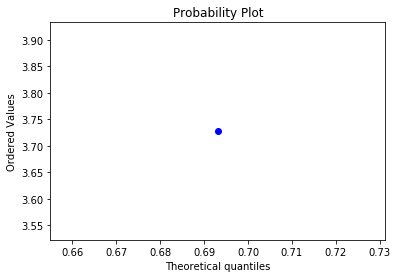



k = -3, size = 1
Number of negative jump times: 253
Mean: 3.4332766798418968


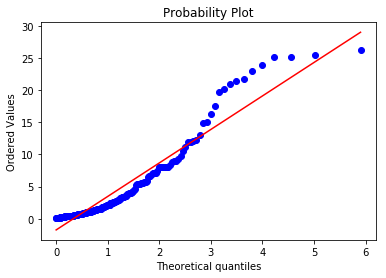



k = -3, size = 2
Number of negative jump times: 219
Mean: 3.510164383561644


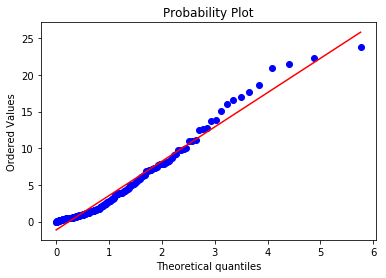



k = -3, size = 3
Number of negative jump times: 80
Mean: 3.1468375


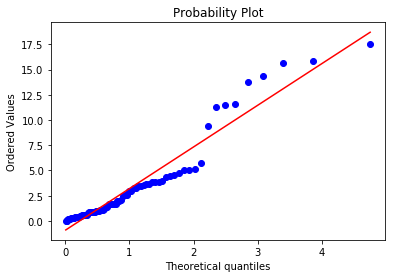



k = -3, size = 4
Number of negative jump times: 135
Mean: 4.4005333333333345


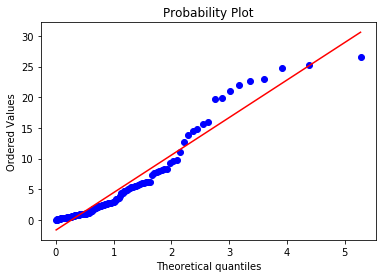



k = -3, size = 5
Number of negative jump times: 72
Mean: 3.845125


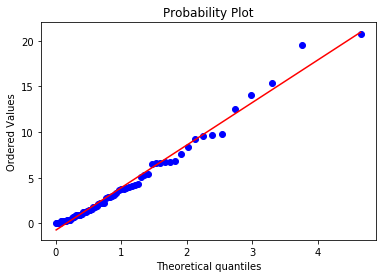



k = -3, size = 6
Number of negative jump times: 94
Mean: 2.2906063829787233


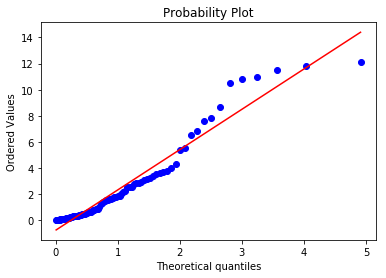



k = -3, size = 7
Number of negative jump times: 77
Mean: 4.8227792207792195


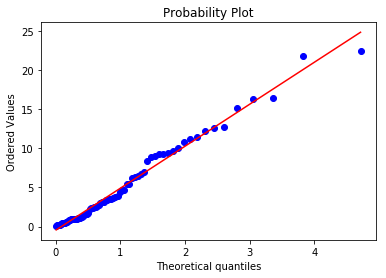



k = -3, size = 8
Number of negative jump times: 53
Mean: 3.188716981132075


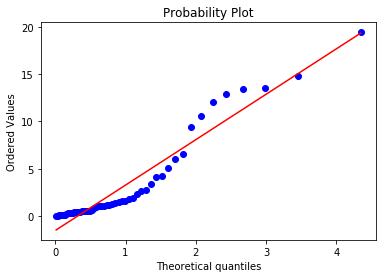



k = -3, size = 9
Number of negative jump times: 34
Mean: 1.4473235294117646


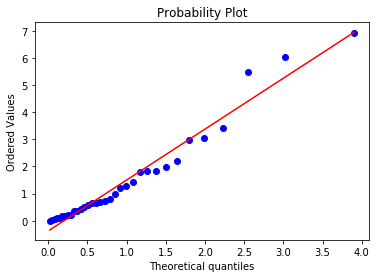



k = -3, size = 10
Number of negative jump times: 20
Mean: 2.34565


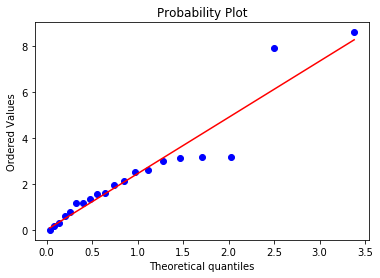



k = -3, size = 11
Number of negative jump times: 4
Mean: 0.44725


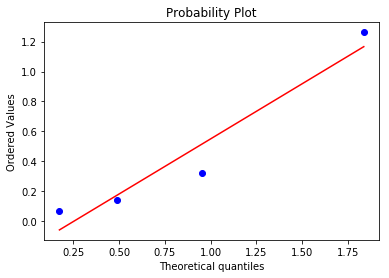



k = -3, size = 12
Number of negative jump times: 3
Mean: 2.1856666666666666


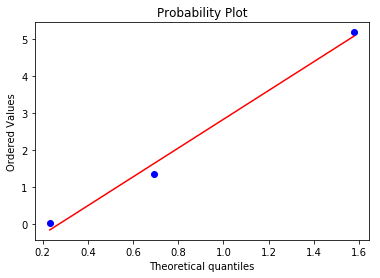



k = -3, size = 13
Number of negative jump times: 3
Mean: 0.13666666666666666


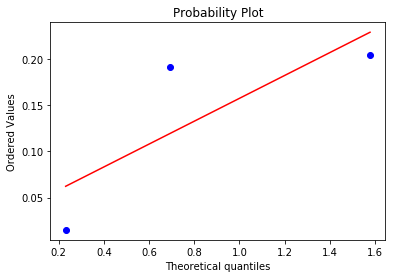



k = -3, size = 14
Number of negative jump times: 3
Mean: 1.6659999999999997


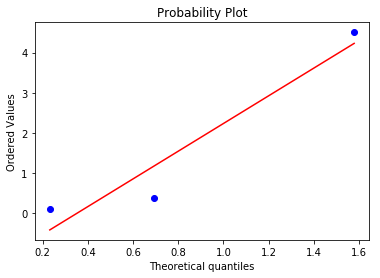



k = -3, size = 15
Number of negative jump times: 5
Mean: 0.6620000000000001


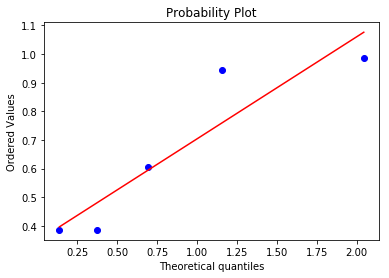



k = -3, size = 16
Number of negative jump times: 4
Mean: 0.61175


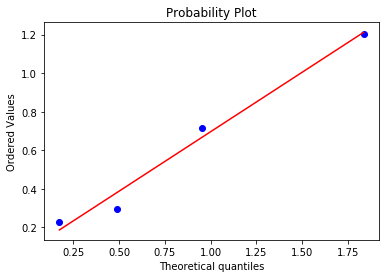



k = -3, size = 17
Number of negative jump times: 31
Mean: 2.966032258064516


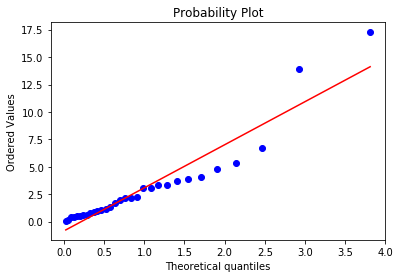



k = -3, size = 18
Number of negative jump times: 49
Mean: 4.526326530612245


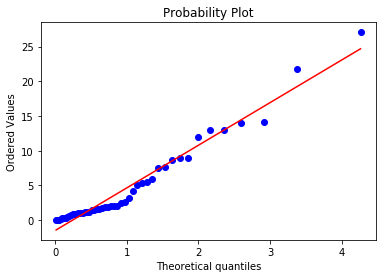



k = -3, size = 19
Number of negative jump times: 73
Mean: 3.4666301369863013


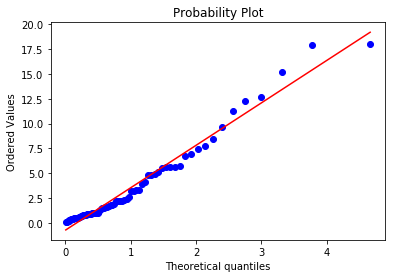



k = -3, size = 20
Number of negative jump times: 3
Mean: 14.038333333333334


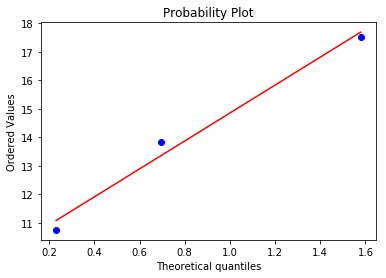



k = -3, size = 21
Number of negative jump times: 0
Mean: nan


k = -3, size = 22
Number of negative jump times: 10
Mean: 3.4302


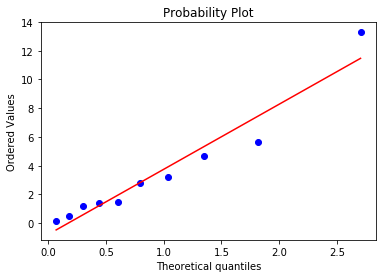



k = -3, size = 23
Number of negative jump times: 1
Mean: 1.509


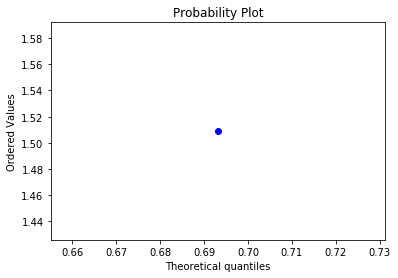



k = -3, size = 24
Number of negative jump times: 19
Mean: 5.363368421052632


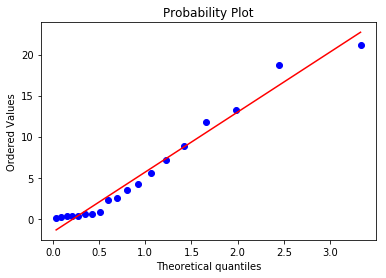



k = -3, size = 25
Number of negative jump times: 6
Mean: 2.5265


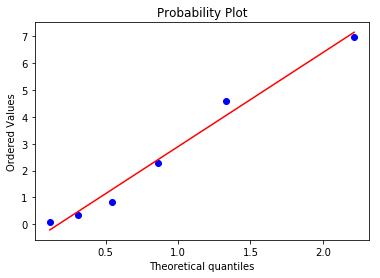



k = -3, size = 26
Number of negative jump times: 2
Mean: 4.8895


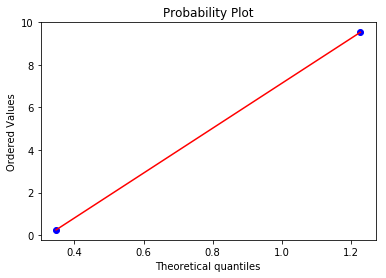



k = -2, size = 1
Number of negative jump times: 481
Mean: 1.443777546777547


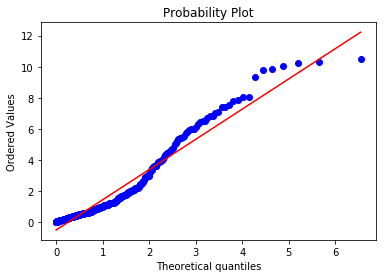



k = -2, size = 2
Number of negative jump times: 173
Mean: 1.529520231213873


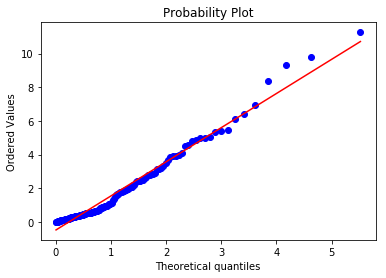



k = -2, size = 3
Number of negative jump times: 168
Mean: 1.4449285714285716


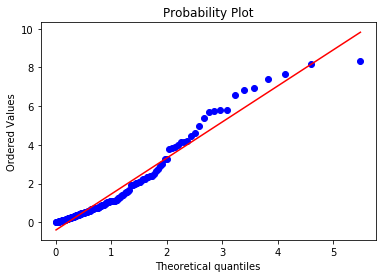



k = -2, size = 4
Number of negative jump times: 158
Mean: 3.0543354430379748


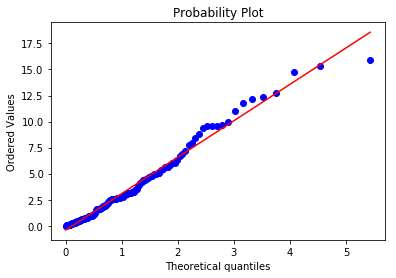



k = -2, size = 5
Number of negative jump times: 108
Mean: 3.2038240740740744


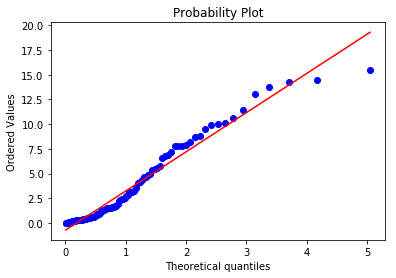



k = -2, size = 6
Number of negative jump times: 82
Mean: 6.660048780487805


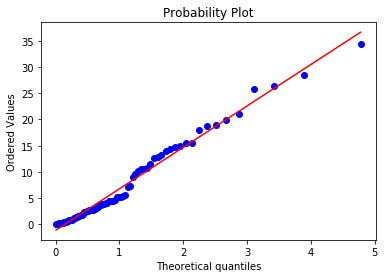



k = -2, size = 7
Number of negative jump times: 84
Mean: 2.773916666666667


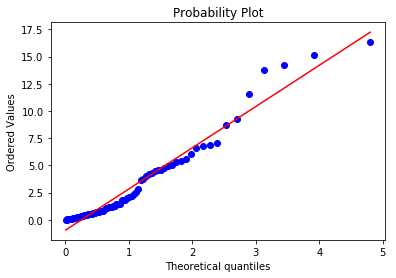



k = -2, size = 8
Number of negative jump times: 56
Mean: 1.473857142857143


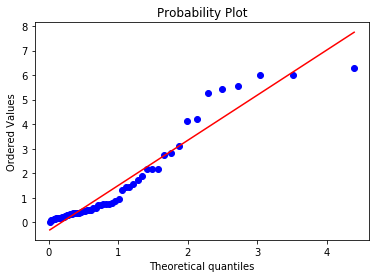



k = -2, size = 9
Number of negative jump times: 25
Mean: 0.76232


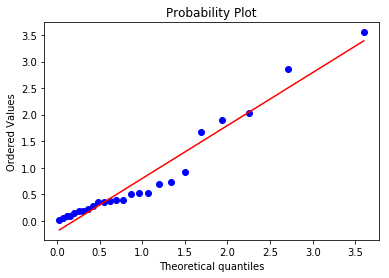



k = -2, size = 10
Number of negative jump times: 4
Mean: 7.93


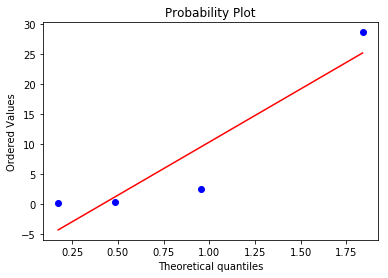



k = -2, size = 11
Number of negative jump times: 1
Mean: 0.211


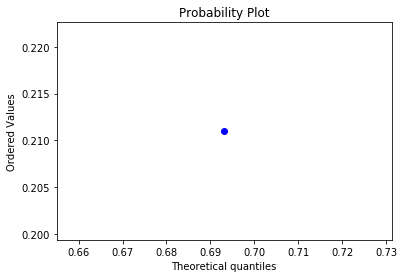



k = -2, size = 12
Number of negative jump times: 0
Mean: nan


k = -2, size = 13
Number of negative jump times: 0
Mean: nan


k = -2, size = 14
Number of negative jump times: 11
Mean: 13.015545454545457


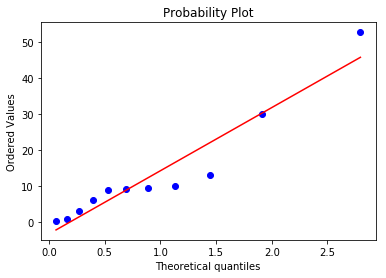



k = -2, size = 15
Number of negative jump times: 104
Mean: 3.239009615384615


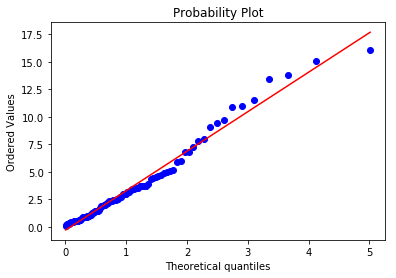



k = -2, size = 16
Number of negative jump times: 73
Mean: 5.784753424657534


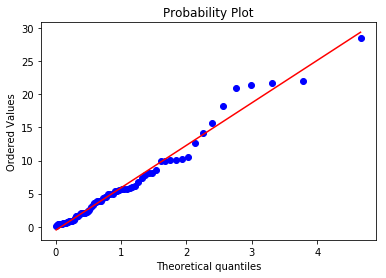



k = -2, size = 17
Number of negative jump times: 43
Mean: 4.0398837209302325


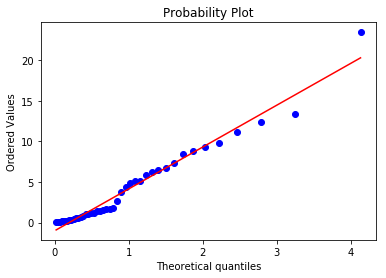



k = -2, size = 18
Number of negative jump times: 26
Mean: 6.011961538461539


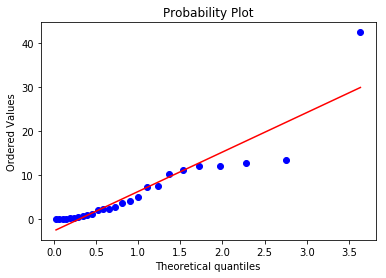



k = -2, size = 19
Number of negative jump times: 20
Mean: 6.4345


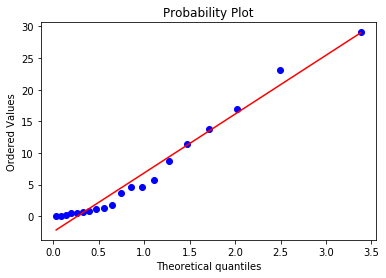



k = -2, size = 20
Number of negative jump times: 4
Mean: 17.20825


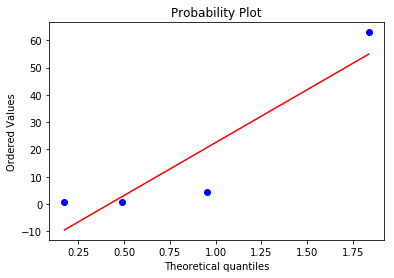



k = -2, size = 21
Number of negative jump times: 44
Mean: 0.40863636363636363


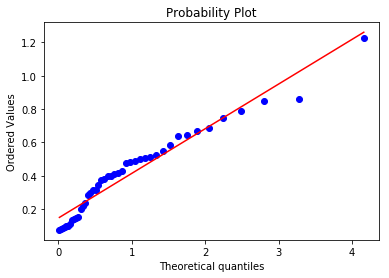



k = -1, size = 1
Number of negative jump times: 289
Mean: 3.5946851211072666


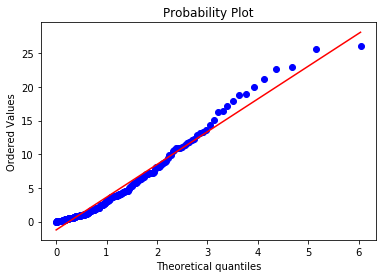



k = -1, size = 2
Number of negative jump times: 236
Mean: 3.1526793983050845


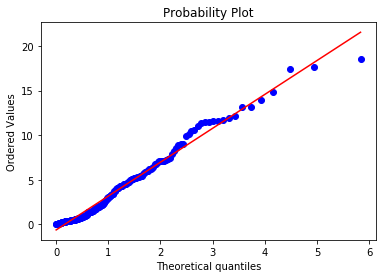



k = -1, size = 3
Number of negative jump times: 339
Mean: 0.7565693215339234


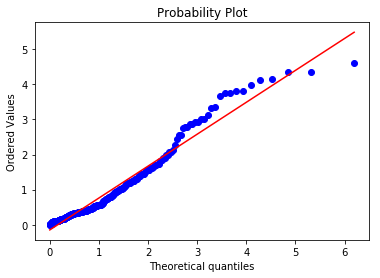



k = -1, size = 4
Number of negative jump times: 179
Mean: 2.2094469273743016


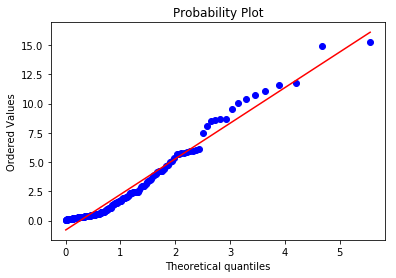



k = -1, size = 5
Number of negative jump times: 220
Mean: 2.5977090909090905


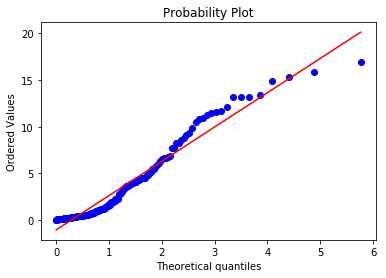



k = -1, size = 6
Number of negative jump times: 89
Mean: 2.3020224719101123


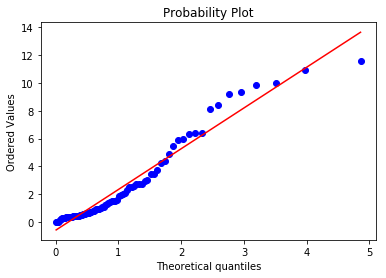



k = -1, size = 7
Number of negative jump times: 108
Mean: 1.775


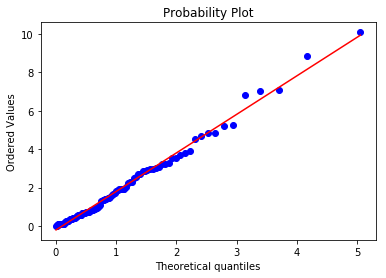



k = -1, size = 8
Number of negative jump times: 61
Mean: 4.0812786885245895


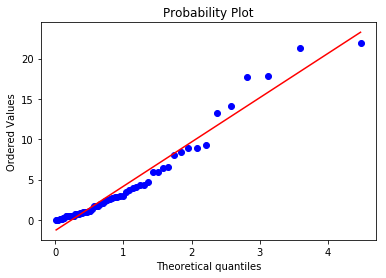



k = -1, size = 9
Number of negative jump times: 37
Mean: 0.6471081081081081


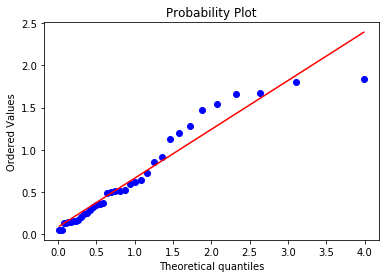



k = -1, size = 10
Number of negative jump times: 23
Mean: 2.8786521739130437


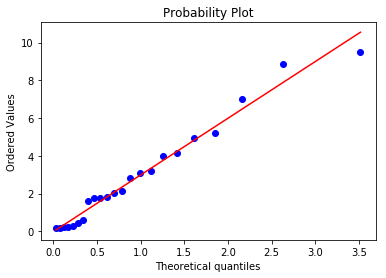



k = -1, size = 11
Number of negative jump times: 7
Mean: 3.0991428571428576


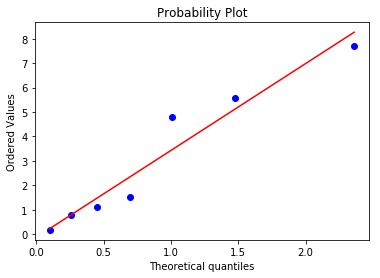



k = -1, size = 12
Number of negative jump times: 5
Mean: 1.342


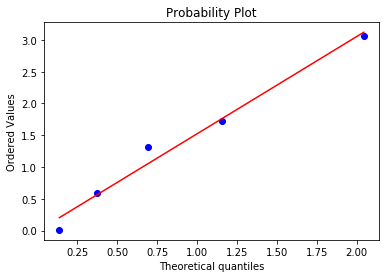



k = -1, size = 13
Number of negative jump times: 2
Mean: 0.751


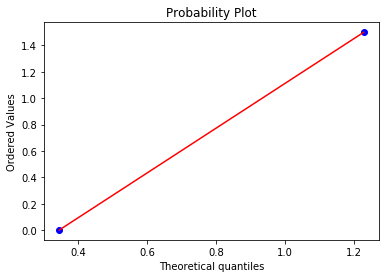



k = -1, size = 14
Number of negative jump times: 0
Mean: nan


k = -1, size = 15
Number of negative jump times: 0
Mean: nan


k = -1, size = 16
Number of negative jump times: 0
Mean: nan


k = -1, size = 17
Number of negative jump times: 4
Mean: 0.704


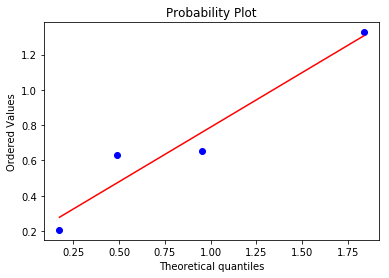



k = -1, size = 18
Number of negative jump times: 13
Mean: 3.8396153846153847


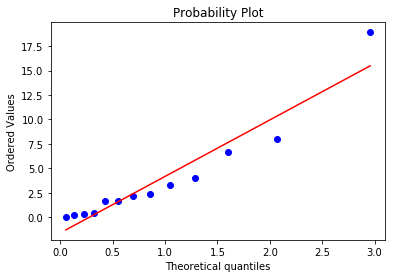



k = -1, size = 19
Number of negative jump times: 61
Mean: 3.9903278688524595


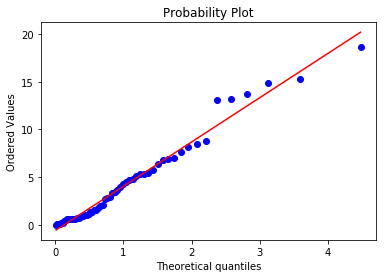



k = -1, size = 20
Number of negative jump times: 18
Mean: 4.3069999999999995


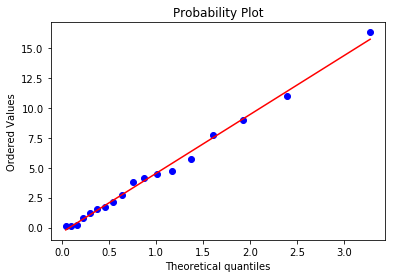



k = -1, size = 21
Number of negative jump times: 14
Mean: 3.150857142857143


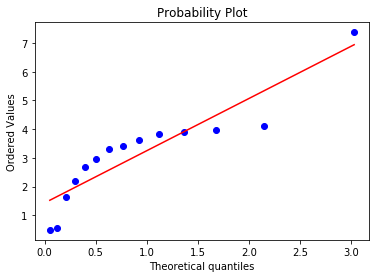



k = -1, size = 22
Number of negative jump times: 24
Mean: 3.9583749999999998


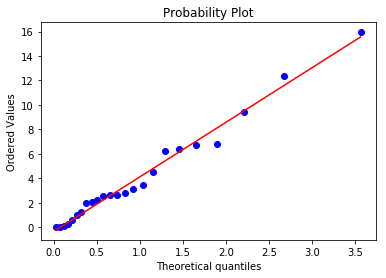



k = -1, size = 23
Number of negative jump times: 46
Mean: 2.6869782608695654


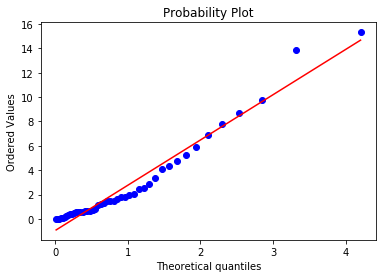



k = -1, size = 24
Number of negative jump times: 32
Mean: 2.2032812500000003


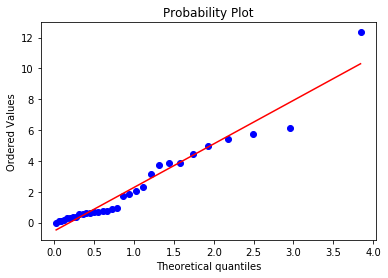



k = -1, size = 25
Number of negative jump times: 0
Mean: nan


k = -1, size = 26
Number of negative jump times: 1
Mean: 0.384


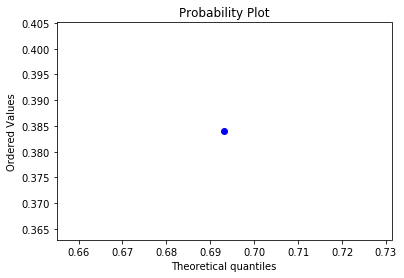



k = 1, size = 1
Number of negative jump times: 196
Mean: 3.9749489795918365


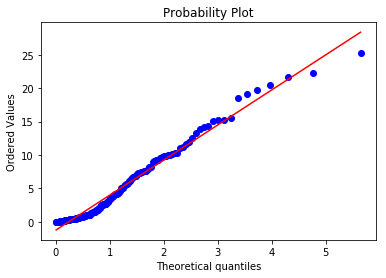



k = 1, size = 2
Number of negative jump times: 51
Mean: 2.3555882352941175


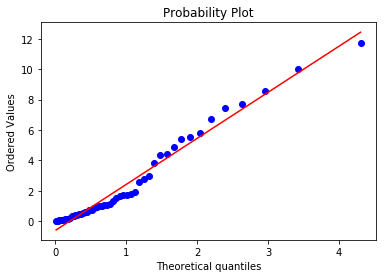



k = 1, size = 3
Number of negative jump times: 60
Mean: 2.8134333333333337


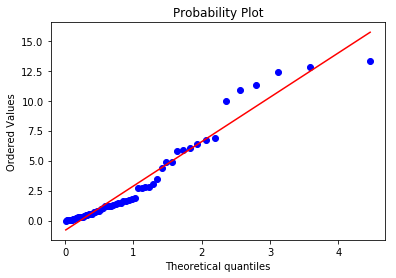



k = 1, size = 4
Number of negative jump times: 75
Mean: 2.6810533333333333


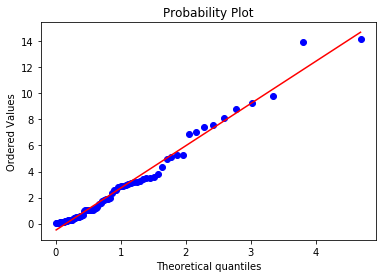



k = 1, size = 5
Number of negative jump times: 52
Mean: 1.7510384615384615


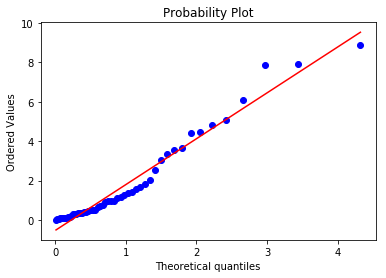



k = 1, size = 6
Number of negative jump times: 32
Mean: 1.6789375


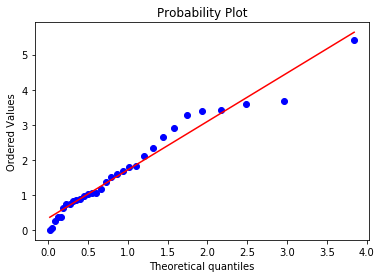



k = 1, size = 7
Number of negative jump times: 28
Mean: 3.681035714285714


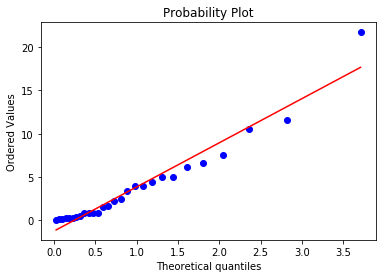



k = 1, size = 8
Number of negative jump times: 30
Mean: 3.4745000000000004


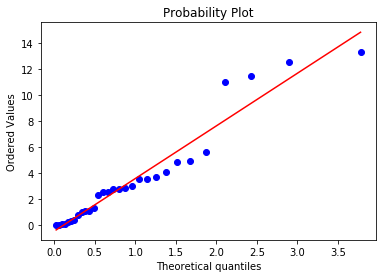



k = 1, size = 9
Number of negative jump times: 22
Mean: 3.373181818181818


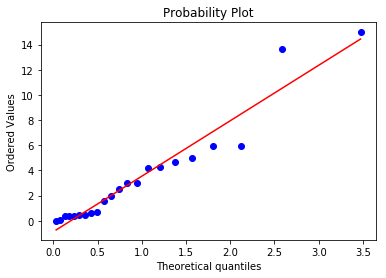



k = 1, size = 10
Number of negative jump times: 7
Mean: 10.472857142857142


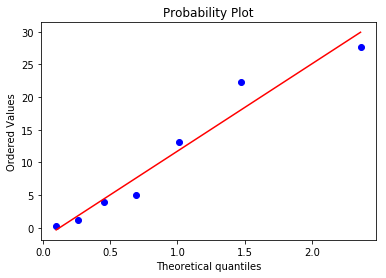



k = 1, size = 11
Number of negative jump times: 14
Mean: 3.7137142857142855


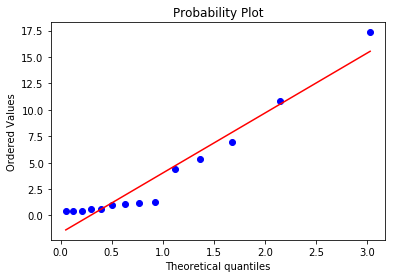



k = 1, size = 12
Number of negative jump times: 1
Mean: 0.085


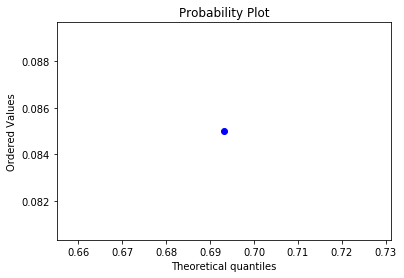



k = 1, size = 13
Number of negative jump times: 0
Mean: nan


k = 1, size = 14
Number of negative jump times: 0
Mean: nan


k = 1, size = 15
Number of negative jump times: 0
Mean: nan


k = 1, size = 16
Number of negative jump times: 1
Mean: 9.901


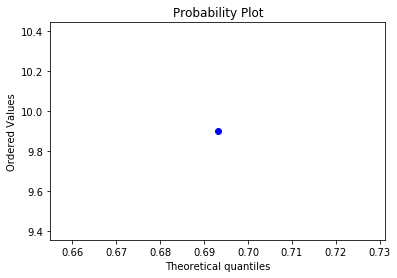



k = 1, size = 17
Number of negative jump times: 0
Mean: nan


k = 1, size = 18
Number of negative jump times: 19
Mean: 0.7750526315789474


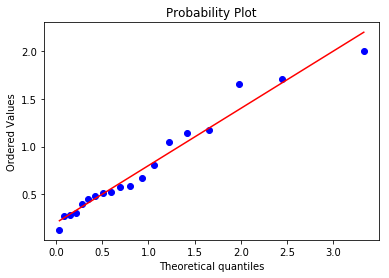



k = 1, size = 19
Number of negative jump times: 0
Mean: nan


k = 1, size = 20
Number of negative jump times: 7
Mean: 1.4332857142857145


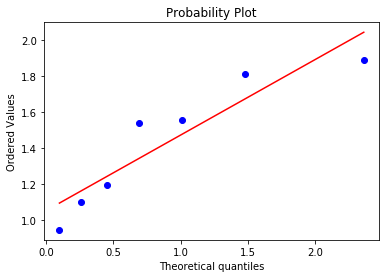



k = 1, size = 21
Number of negative jump times: 0
Mean: nan


k = 1, size = 22
Number of negative jump times: 1
Mean: 0.535


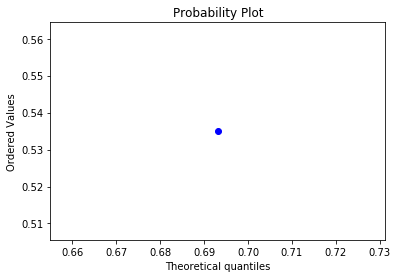



k = 2, size = 1
Number of negative jump times: 276
Mean: 1.719608695652174


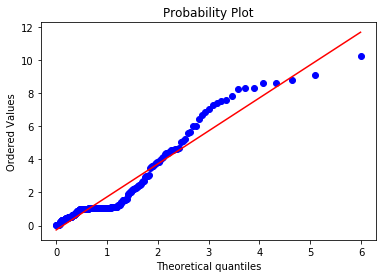



k = 2, size = 2
Number of negative jump times: 276
Mean: 1.6192463768115941


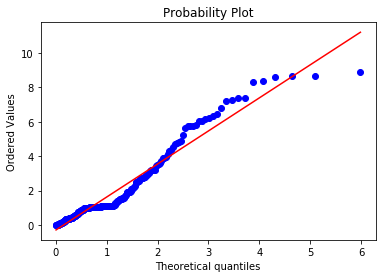



k = 2, size = 3
Number of negative jump times: 301
Mean: 0.9464152823920265


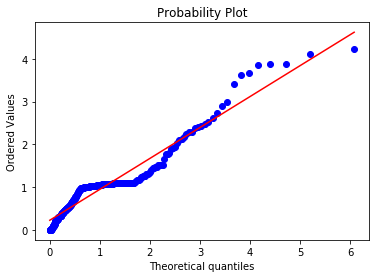



k = 2, size = 4
Number of negative jump times: 237
Mean: 2.6831139240506325


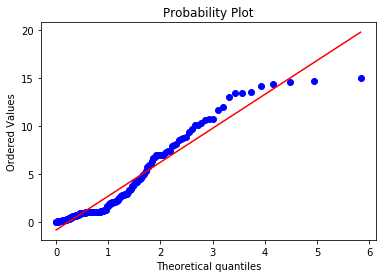



k = 2, size = 5
Number of negative jump times: 243
Mean: 1.386707818930041


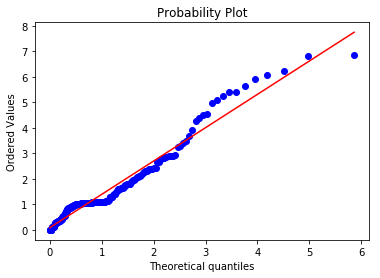



k = 2, size = 6
Number of negative jump times: 79
Mean: 1.9141308607594938


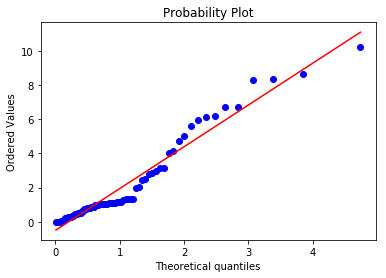



k = 2, size = 7
Number of negative jump times: 37
Mean: 0.749837837837838


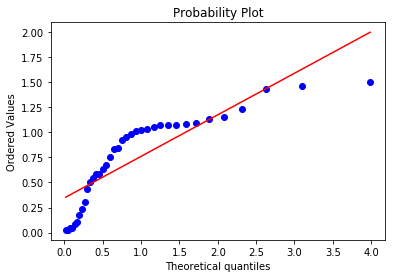



k = 2, size = 8
Number of negative jump times: 11
Mean: 1.7025454545454544


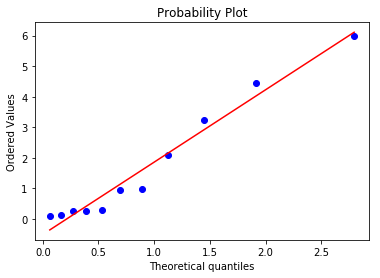



k = 2, size = 9
Number of negative jump times: 7
Mean: 2.6792857142857143


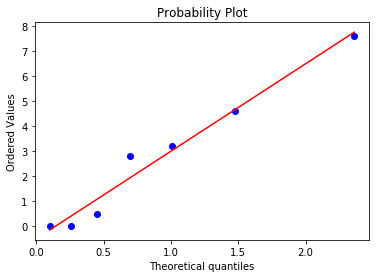



k = 2, size = 10
Number of negative jump times: 6
Mean: 0.4053333333333334


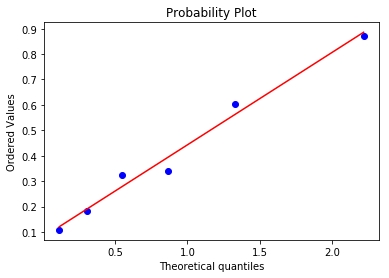



k = 2, size = 11
Number of negative jump times: 10
Mean: 1.2507000000000001


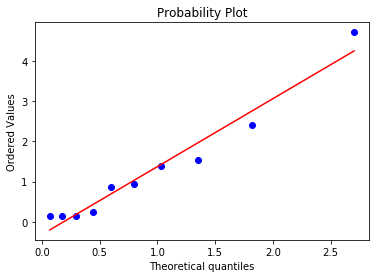



k = 2, size = 12
Number of negative jump times: 0
Mean: nan


k = 2, size = 13
Number of negative jump times: 0
Mean: nan


k = 2, size = 14
Number of negative jump times: 0
Mean: nan


k = 2, size = 15
Number of negative jump times: 0
Mean: nan


k = 2, size = 16
Number of negative jump times: 0
Mean: nan


k = 2, size = 17
Number of negative jump times: 0
Mean: nan


k = 2, size = 18
Number of negative jump times: 0
Mean: nan


k = 2, size = 19
Number of negative jump times: 0
Mean: nan


k = 2, size = 20
Number of negative jump times: 0
Mean: nan


k = 2, size = 21
Number of negative jump times: 0
Mean: nan


k = 2, size = 22
Number of negative jump times: 0
Mean: nan


k = 2, size = 23
Number of negative jump times: 7
Mean: 4.366714285714285


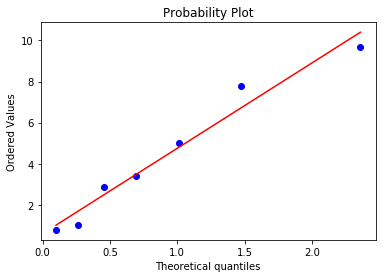



k = 3, size = 1
Number of negative jump times: 152
Mean: 2.176828947368421


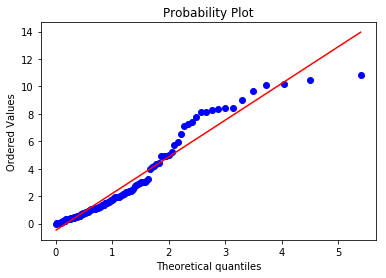



k = 3, size = 2
Number of negative jump times: 223
Mean: 3.1660313901345294


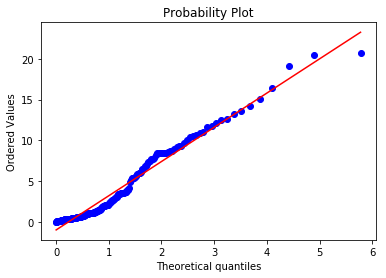



k = 3, size = 3
Number of negative jump times: 205
Mean: 3.6868536585365845


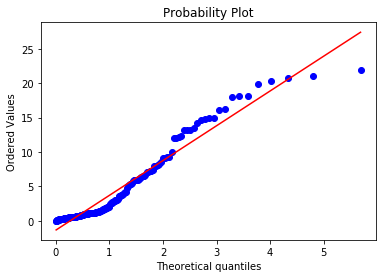



k = 3, size = 4
Number of negative jump times: 297
Mean: 3.0477912457912457


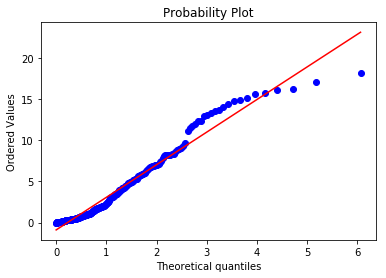



k = 3, size = 5
Number of negative jump times: 158
Mean: 2.8804303797468354


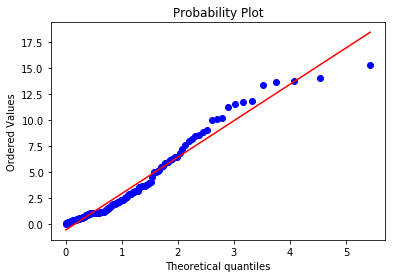



k = 3, size = 6
Number of negative jump times: 86
Mean: 1.7844418604651169


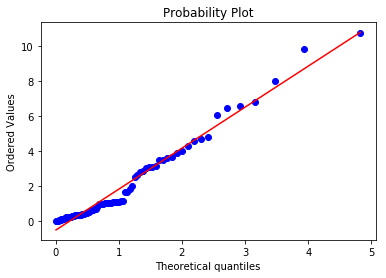



k = 3, size = 7
Number of negative jump times: 42
Mean: 5.266857142857142


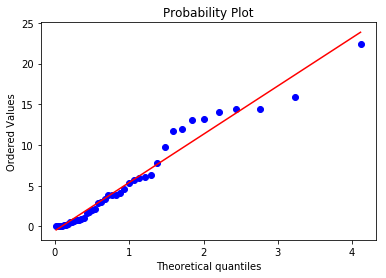



k = 3, size = 8
Number of negative jump times: 12
Mean: 2.4163333333333337


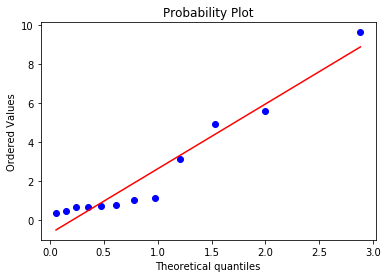



k = 3, size = 9
Number of negative jump times: 6
Mean: 3.599833333333333


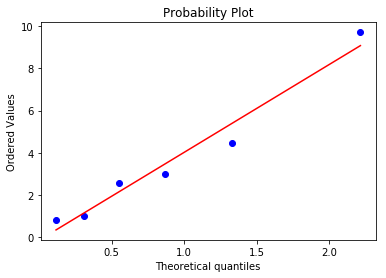



k = 3, size = 10
Number of negative jump times: 0
Mean: nan


k = 3, size = 11
Number of negative jump times: 0
Mean: nan


k = 3, size = 12
Number of negative jump times: 0
Mean: nan


k = 3, size = 13
Number of negative jump times: 0
Mean: nan


k = 3, size = 14
Number of negative jump times: 0
Mean: nan


k = 3, size = 15
Number of negative jump times: 4
Mean: 47.976749999999996


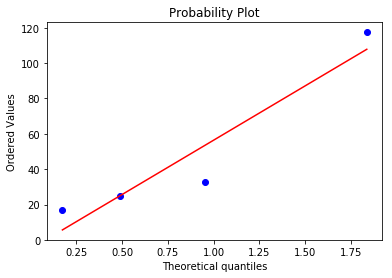



k = 3, size = 16
Number of negative jump times: 32
Mean: 4.5169999999999995


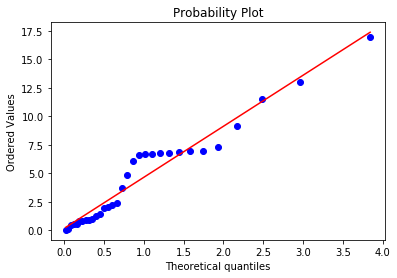



k = 3, size = 17
Number of negative jump times: 16
Mean: 3.645125


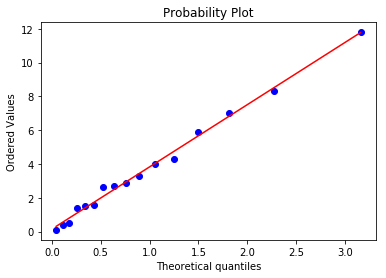



k = 3, size = 18
Number of negative jump times: 20
Mean: 5.0605169000000005


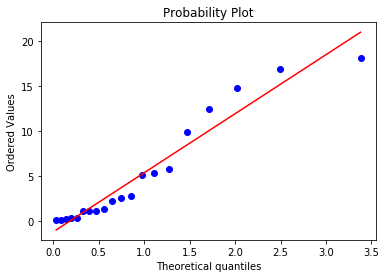



k = 3, size = 19
Number of negative jump times: 2
Mean: 29.5995


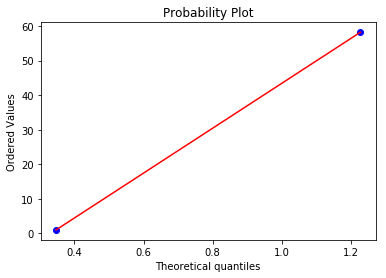



k = 4, size = 1
Number of negative jump times: 264
Mean: 0.969935606060606


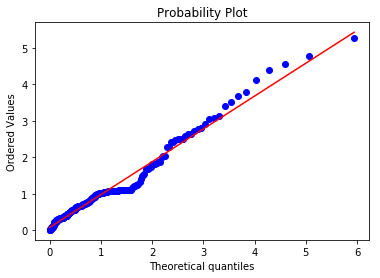



k = 4, size = 2
Number of negative jump times: 157
Mean: 1.7041719745222934


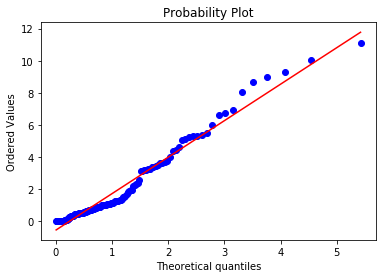



k = 4, size = 3
Number of negative jump times: 407
Mean: 1.366009828009828


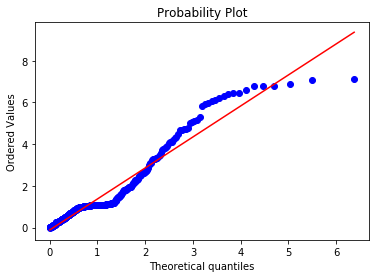



k = 4, size = 4
Number of negative jump times: 358
Mean: 1.644522346368715


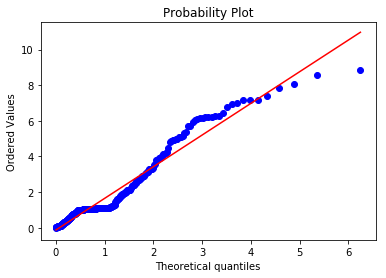



k = 4, size = 5
Number of negative jump times: 683
Mean: 0.8696778916544656


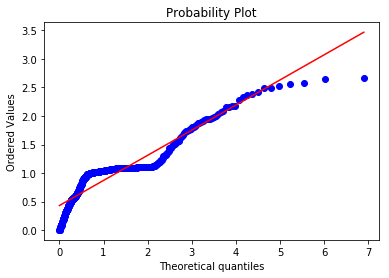



k = 4, size = 6
Number of negative jump times: 304
Mean: 0.9527730263157895


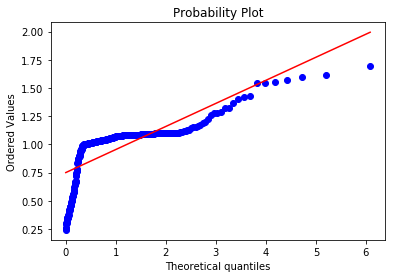



k = 4, size = 7
Number of negative jump times: 155
Mean: 1.0233677419354839


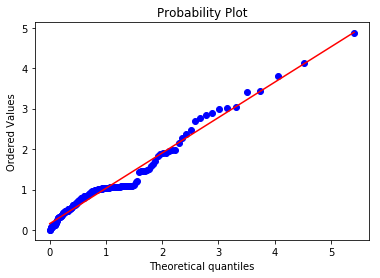



k = 4, size = 8
Number of negative jump times: 32
Mean: 2.04109375


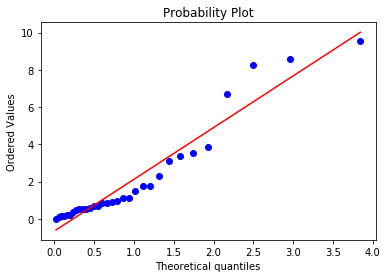



k = 4, size = 9
Number of negative jump times: 29
Mean: 5.152172413793103


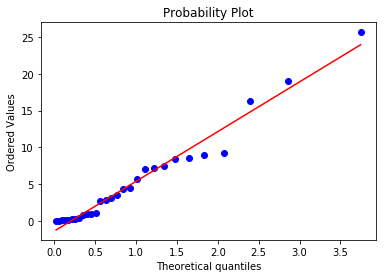



k = 4, size = 10
Number of negative jump times: 2
Mean: 0.5035000000000001


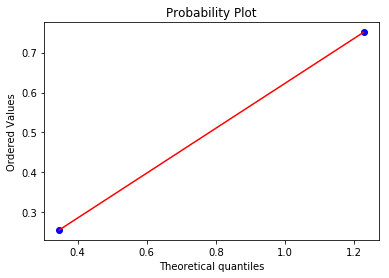



k = 4, size = 11
Number of negative jump times: 0
Mean: nan


k = 4, size = 12
Number of negative jump times: 0
Mean: nan


k = 4, size = 13
Number of negative jump times: 0
Mean: nan


k = 4, size = 14
Number of negative jump times: 0
Mean: nan


k = 4, size = 15
Number of negative jump times: 0
Mean: nan


k = 4, size = 16
Number of negative jump times: 0
Mean: nan


k = 4, size = 17
Number of negative jump times: 0
Mean: nan


k = 4, size = 18
Number of negative jump times: 2
Mean: 333.605


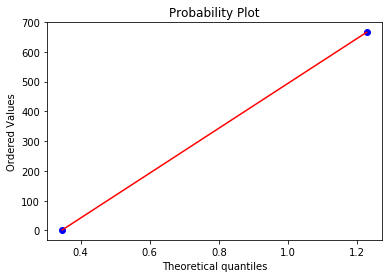



k = 4, size = 19
Number of negative jump times: 0
Mean: nan


k = 4, size = 20
Number of negative jump times: 20
Mean: 6.2888


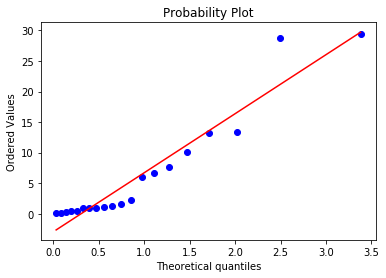



k = 4, size = 21
Number of negative jump times: 7
Mean: 0.48114285714285715


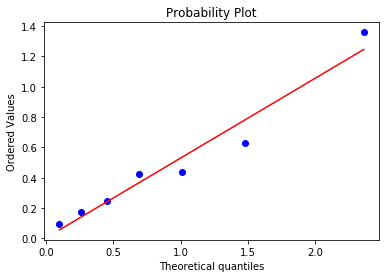



k = 4, size = 22
Number of negative jump times: 1
Mean: 0.398


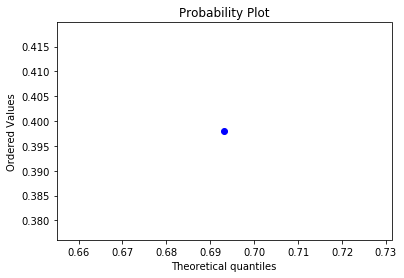



k = 5, size = 1
Number of negative jump times: 336
Mean: 1.004047619047619


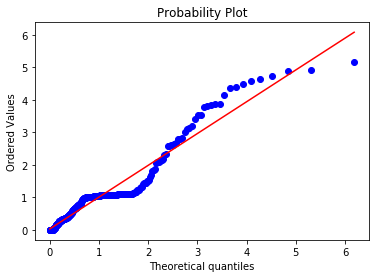



k = 5, size = 2
Number of negative jump times: 141
Mean: 2.177666666666667


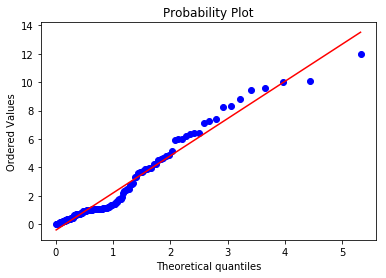



k = 5, size = 3
Number of negative jump times: 610
Mean: 0.7947081967213114


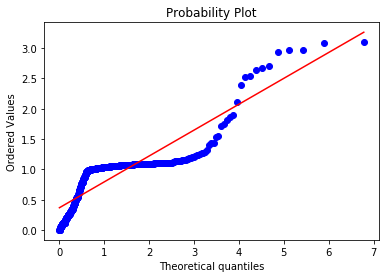



k = 5, size = 4
Number of negative jump times: 205
Mean: 3.021112195121951


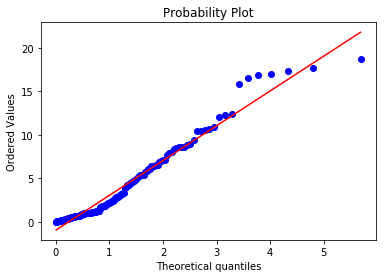



k = 5, size = 5
Number of negative jump times: 197
Mean: 2.2188984771573605


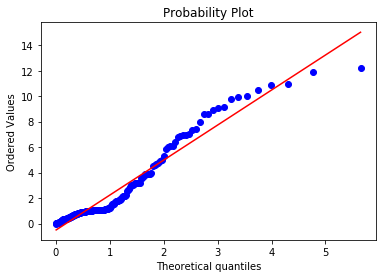



k = 5, size = 6
Number of negative jump times: 229
Mean: 2.933877729257642


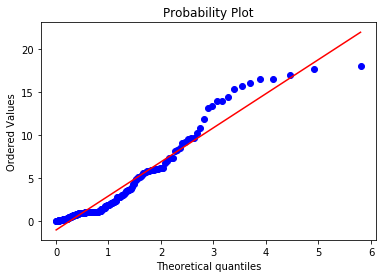



k = 5, size = 7
Number of negative jump times: 65
Mean: 2.8286461538461536


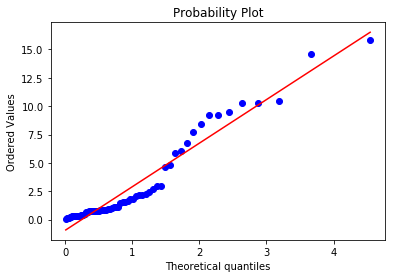



k = 5, size = 8
Number of negative jump times: 78
Mean: 2.0296666666666665


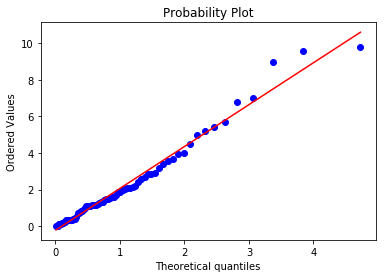



k = 5, size = 9
Number of negative jump times: 20
Mean: 4.061400000000001


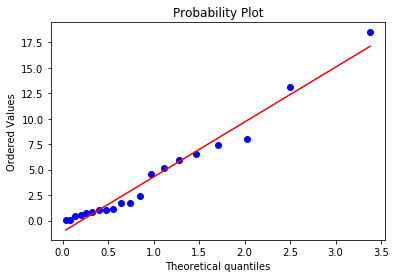



k = 5, size = 10
Number of negative jump times: 1
Mean: 7.487


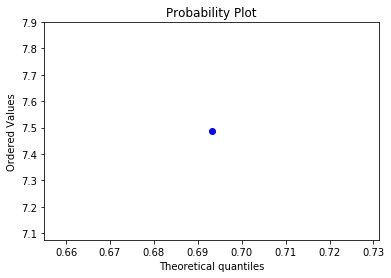



k = 5, size = 11
Number of negative jump times: 13
Mean: 3.1022307692307693


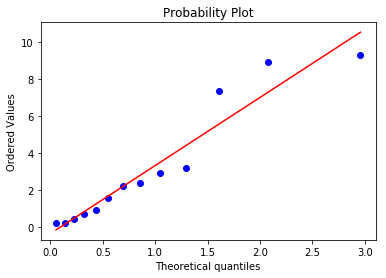



k = 5, size = 12
Number of negative jump times: 0
Mean: nan


k = 5, size = 13
Number of negative jump times: 0
Mean: nan


k = 5, size = 14
Number of negative jump times: 0
Mean: nan


k = 5, size = 15
Number of negative jump times: 0
Mean: nan


k = 5, size = 16
Number of negative jump times: 0
Mean: nan


k = 5, size = 17
Number of negative jump times: 0
Mean: nan


k = 5, size = 18
Number of negative jump times: 2
Mean: 2.5255


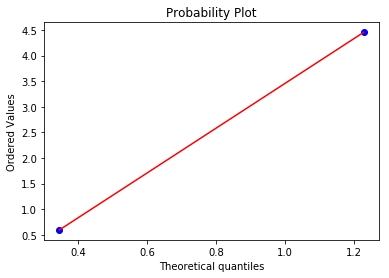



k = 5, size = 19
Number of negative jump times: 3
Mean: 144.37466666666666


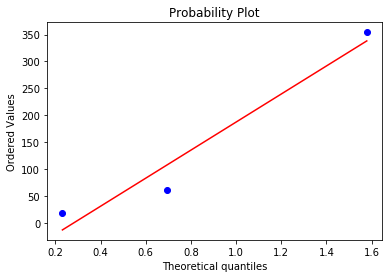



k = 5, size = 20
Number of negative jump times: 20
Mean: 3.77395


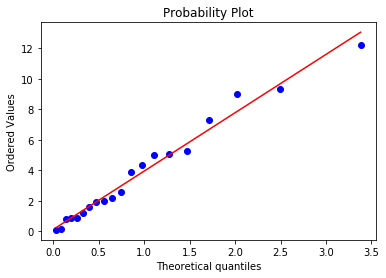



k = 5, size = 21
Number of negative jump times: 85
Mean: 3.5637529411764697


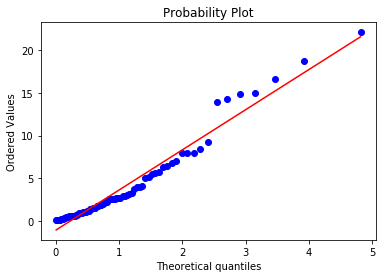



k = 5, size = 22
Number of negative jump times: 92
Mean: 7.215554347826088


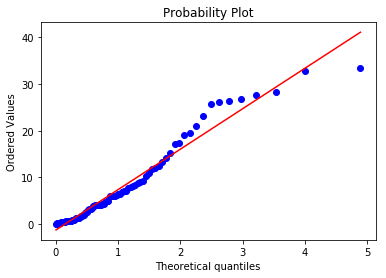



k = 5, size = 23
Number of negative jump times: 36
Mean: 6.971222222222221


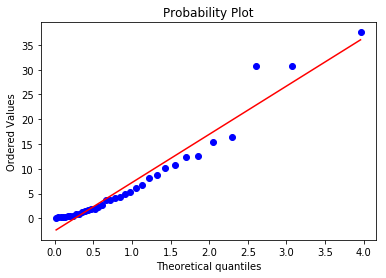



k = 5, size = 24
Number of negative jump times: 5
Mean: 6.011999999999999


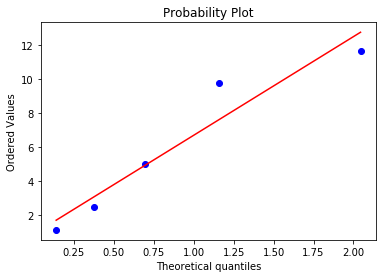



k = 5, size = 25
Number of negative jump times: 1
Mean: 0.929


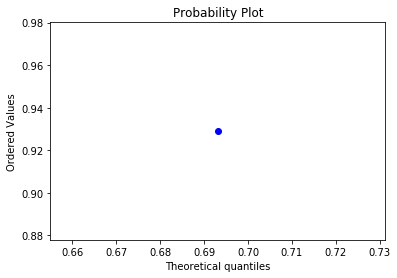



k = 6, size = 1
Number of negative jump times: 260
Mean: 3.358715384615385


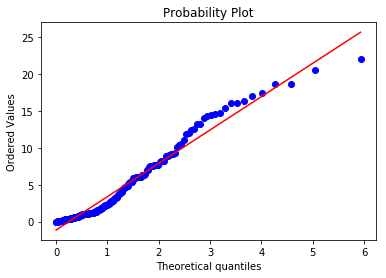



k = 6, size = 2
Number of negative jump times: 277
Mean: 1.9977653429602886


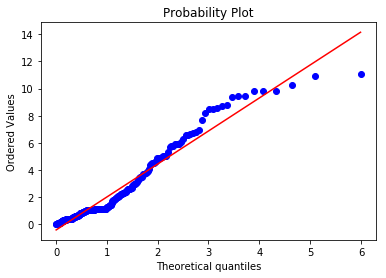



k = 6, size = 3
Number of negative jump times: 277
Mean: 2.0487906137184115


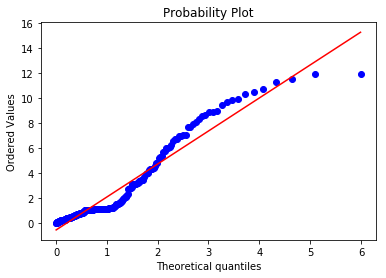



k = 6, size = 4
Number of negative jump times: 384
Mean: 1.4163098958333336


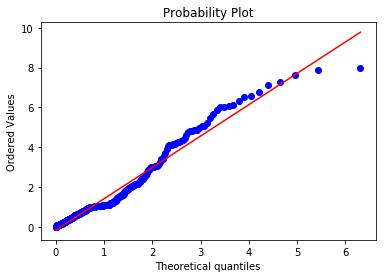



k = 6, size = 5
Number of negative jump times: 359
Mean: 1.509050139275766


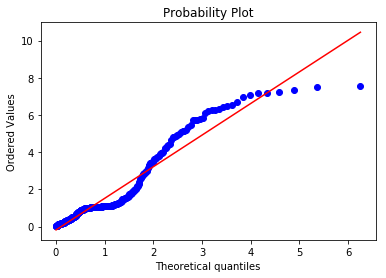



k = 6, size = 6
Number of negative jump times: 270
Mean: 1.202151851851852


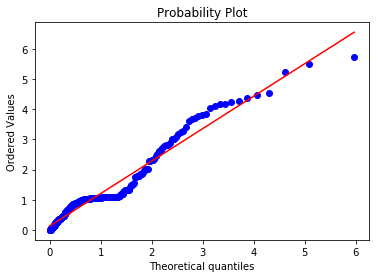



k = 6, size = 7
Number of negative jump times: 241
Mean: 1.3131535269709544


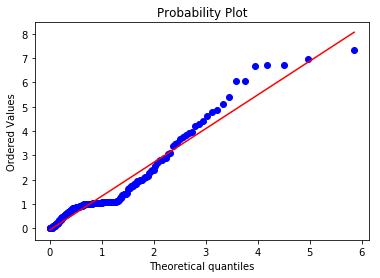



k = 6, size = 8
Number of negative jump times: 51
Mean: 1.6971372549019612


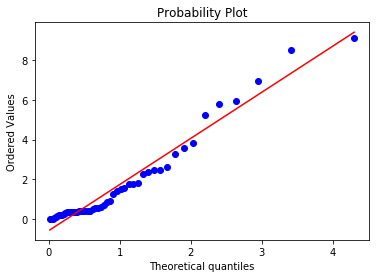



k = 6, size = 9
Number of negative jump times: 24
Mean: 3.7503333333333337


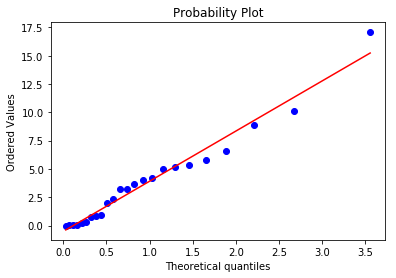



k = 6, size = 10
Number of negative jump times: 2
Mean: 1.7435


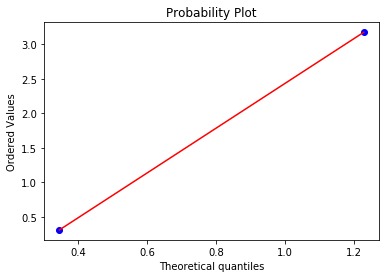



k = 6, size = 11
Number of negative jump times: 0
Mean: nan


k = 6, size = 12
Number of negative jump times: 0
Mean: nan


k = 6, size = 13
Number of negative jump times: 0
Mean: nan


k = 6, size = 14
Number of negative jump times: 0
Mean: nan


k = 6, size = 15
Number of negative jump times: 0
Mean: nan


k = 6, size = 16
Number of negative jump times: 0
Mean: nan


k = 6, size = 17
Number of negative jump times: 6
Mean: 7.623333333333334


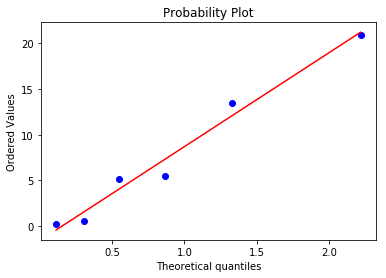



k = 6, size = 18
Number of negative jump times: 42
Mean: 2.4598333333333335


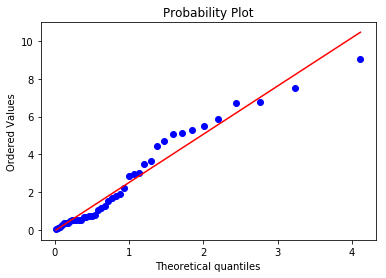



k = 6, size = 19
Number of negative jump times: 29
Mean: 4.423793103448276


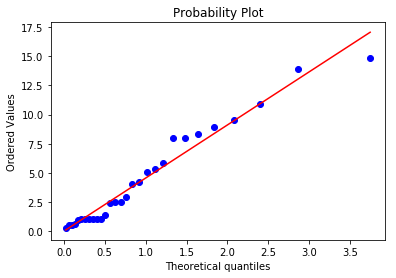



k = 6, size = 20
Number of negative jump times: 9
Mean: 2.681333333333333


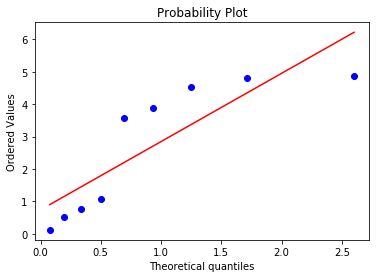



k = 7, size = 1
Number of negative jump times: 394
Mean: 2.6863172588832485


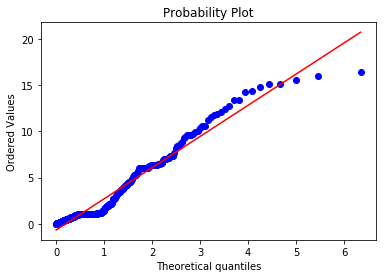



k = 7, size = 2
Number of negative jump times: 342
Mean: 1.1109152046783626


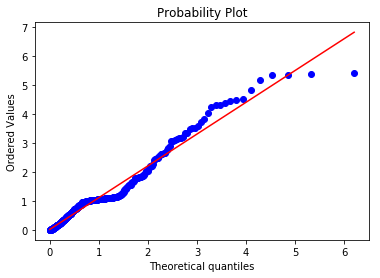



k = 7, size = 3
Number of negative jump times: 491
Mean: 1.228264765784114


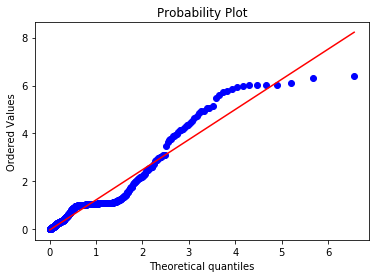



k = 7, size = 4
Number of negative jump times: 302
Mean: 1.9627119205298014


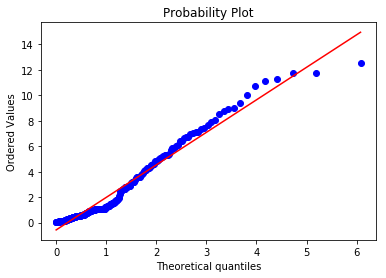



k = 7, size = 5
Number of negative jump times: 287
Mean: 2.240219512195122


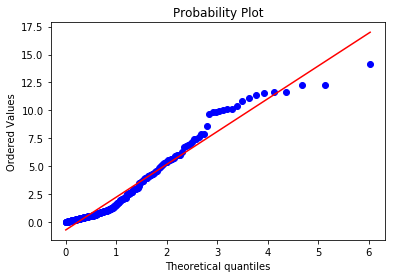



k = 7, size = 6
Number of negative jump times: 167
Mean: 2.246850299401198


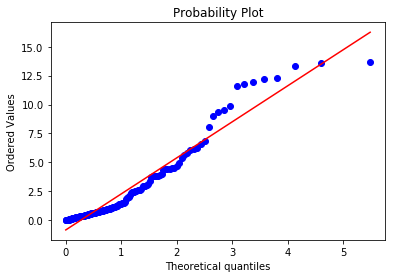



k = 7, size = 7
Number of negative jump times: 155
Mean: 2.154167741935484


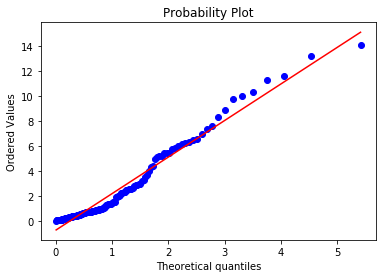



k = 7, size = 8
Number of negative jump times: 55
Mean: 2.7085090909090903


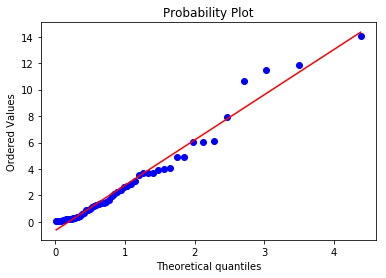



k = 7, size = 9
Number of negative jump times: 54
Mean: 0.7364629629629632


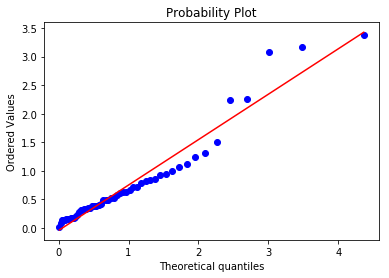



k = 7, size = 10
Number of negative jump times: 0
Mean: nan


k = 7, size = 11
Number of negative jump times: 0
Mean: nan


k = 7, size = 12
Number of negative jump times: 0
Mean: nan


k = 7, size = 13
Number of negative jump times: 0
Mean: nan


k = 7, size = 14
Number of negative jump times: 0
Mean: nan


k = 7, size = 15
Number of negative jump times: 0
Mean: nan


k = 7, size = 16
Number of negative jump times: 6
Mean: 26.027500000000003


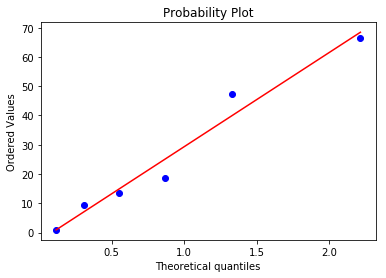



k = 7, size = 17
Number of negative jump times: 38
Mean: 1.2654736842105265


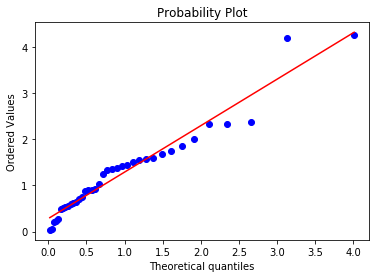



k = 7, size = 18
Number of negative jump times: 45
Mean: 3.698266666666667


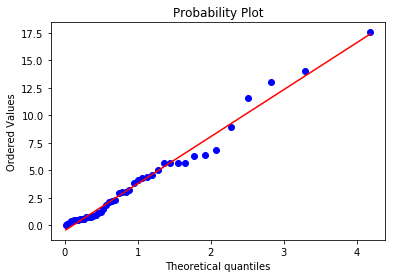



k = 7, size = 19
Number of negative jump times: 67
Mean: 10.825537313432834


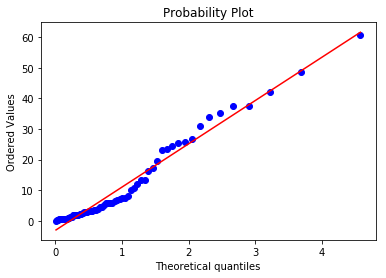



k = 7, size = 20
Number of negative jump times: 10
Mean: 15.112


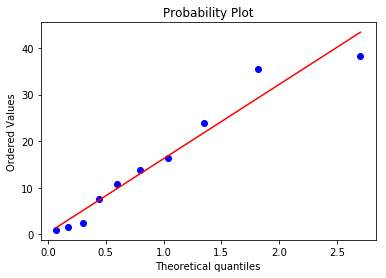



k = 8, size = 1
Number of negative jump times: 234
Mean: 0.9161880341880341


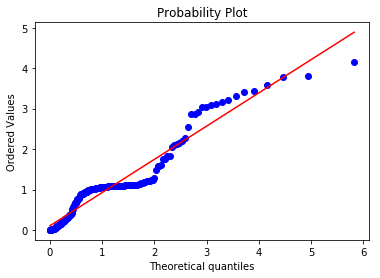



k = 8, size = 2
Number of negative jump times: 340
Mean: 1.7716911764705883


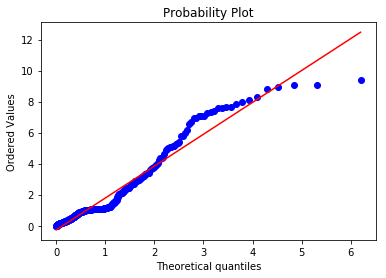



k = 8, size = 3
Number of negative jump times: 316
Mean: 0.8517246835443038


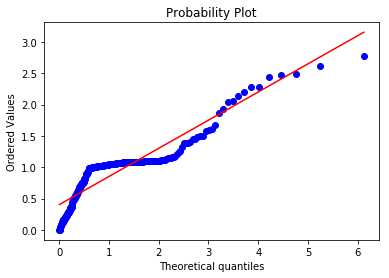



k = 8, size = 4
Number of negative jump times: 572
Mean: 0.8441328671328672


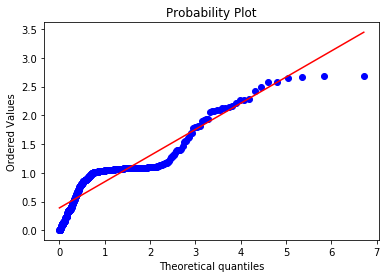



k = 8, size = 5
Number of negative jump times: 578
Mean: 0.8667024221453287


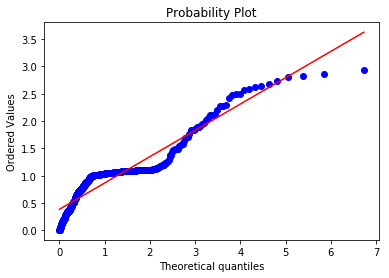



k = 8, size = 6
Number of negative jump times: 572
Mean: 0.847222027972028


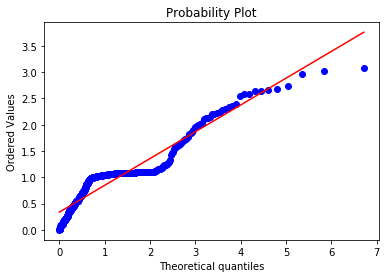



k = 8, size = 7
Number of negative jump times: 390
Mean: 0.8925076923076922


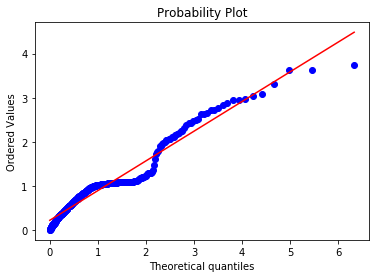



k = 8, size = 8
Number of negative jump times: 95
Mean: 1.3496105263157894


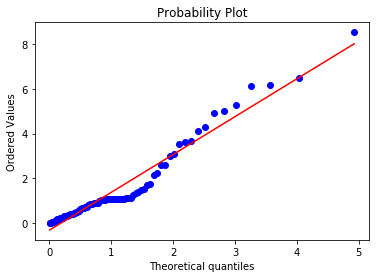



k = 8, size = 9
Number of negative jump times: 13
Mean: 1.0115384615384615


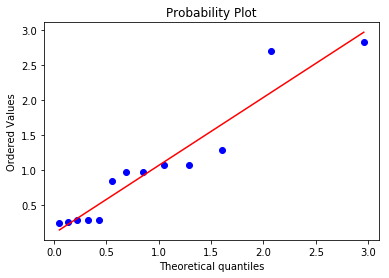



k = 8, size = 10
Number of negative jump times: 8
Mean: 0.314625


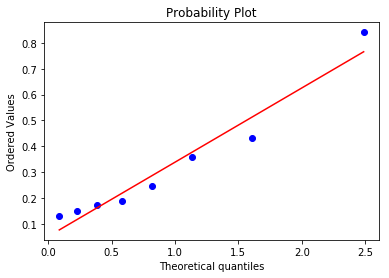



k = 8, size = 11
Number of negative jump times: 0
Mean: nan


k = 8, size = 12
Number of negative jump times: 0
Mean: nan


k = 8, size = 13
Number of negative jump times: 0
Mean: nan


k = 8, size = 14
Number of negative jump times: 0
Mean: nan


k = 8, size = 15
Number of negative jump times: 0
Mean: nan


k = 8, size = 16
Number of negative jump times: 0
Mean: nan


k = 8, size = 17
Number of negative jump times: 0
Mean: nan


k = 8, size = 18
Number of negative jump times: 0
Mean: nan


k = 8, size = 19
Number of negative jump times: 0
Mean: nan


k = 8, size = 20
Number of negative jump times: 0
Mean: nan


k = 8, size = 21
Number of negative jump times: 7
Mean: 43.84071428571429


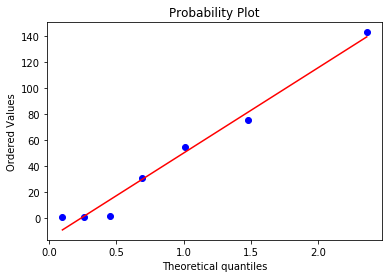



k = 8, size = 22
Number of negative jump times: 11
Mean: 1.0368181818181819


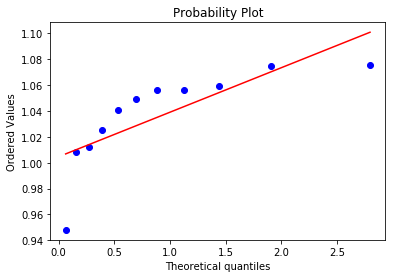



k = 8, size = 23
Number of negative jump times: 46
Mean: 3.3112173913043477


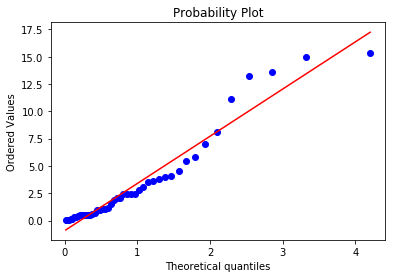



k = 8, size = 24
Number of negative jump times: 14
Mean: 3.374357142857143


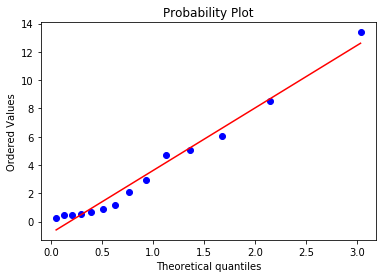



k = 8, size = 25
Number of negative jump times: 0
Mean: nan


k = 8, size = 26
Number of negative jump times: 7
Mean: 2.2374285714285715


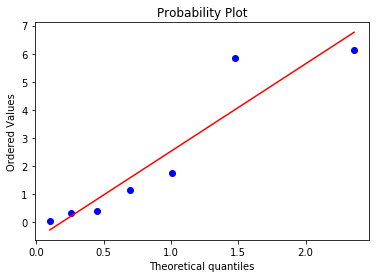



k = 8, size = 27
Number of negative jump times: 3
Mean: 6.416


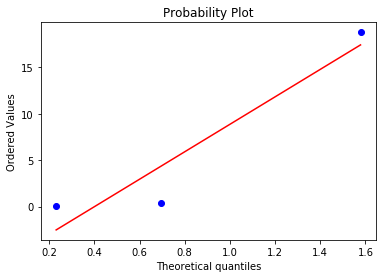



k = 9, size = 1
Number of negative jump times: 281
Mean: 1.0050106761565838


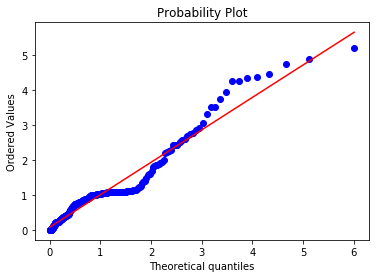



k = 9, size = 2
Number of negative jump times: 258
Mean: 2.4725465116279066


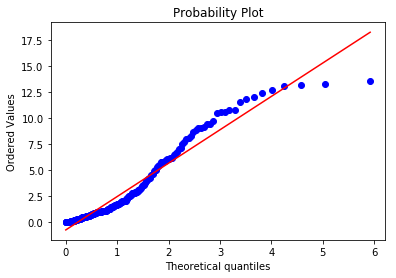



k = 9, size = 3
Number of negative jump times: 372
Mean: 1.1541478494623656


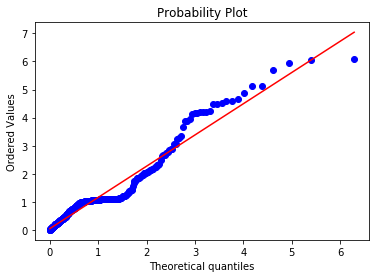



k = 9, size = 4
Number of negative jump times: 319
Mean: 1.8322257053291537


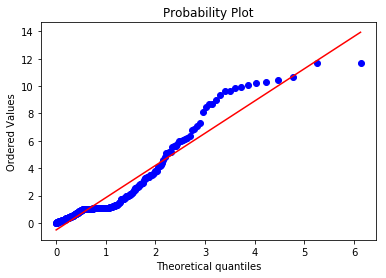



k = 9, size = 5
Number of negative jump times: 208
Mean: 2.576235576923077


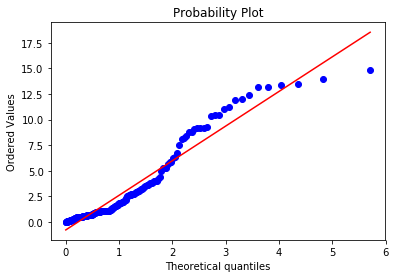



k = 9, size = 6
Number of negative jump times: 224
Mean: 1.9194107142857142


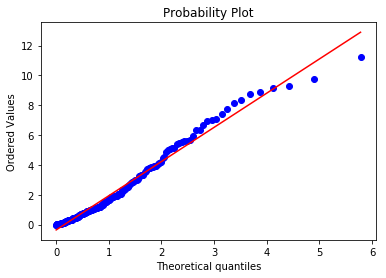



k = 9, size = 7
Number of negative jump times: 65
Mean: 1.0395692307692308


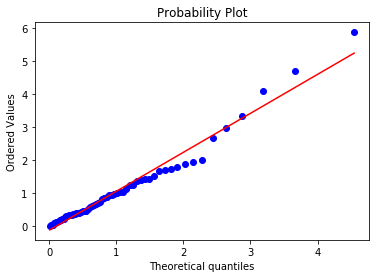



k = 9, size = 8
Number of negative jump times: 71
Mean: 2.050845070422535


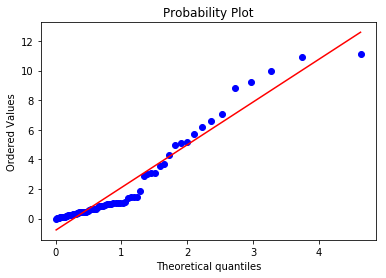



k = 9, size = 9
Number of negative jump times: 12
Mean: 1.1938333333333333


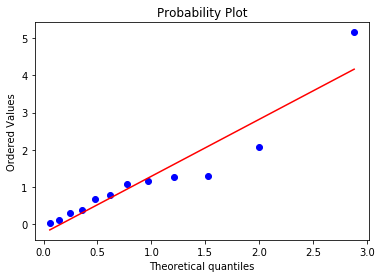



k = 9, size = 10
Number of negative jump times: 8
Mean: 3.217125


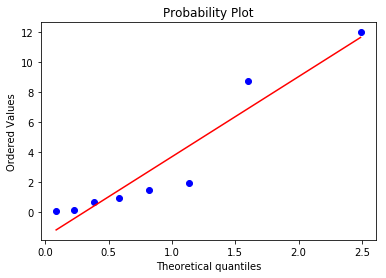



k = 9, size = 11
Number of negative jump times: 5
Mean: 5.9044


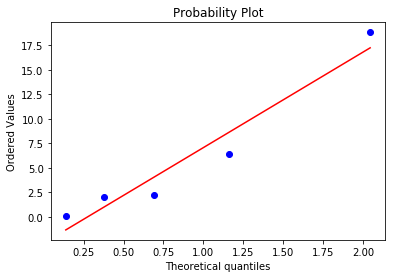



k = 9, size = 12
Number of negative jump times: 1
Mean: 0.095


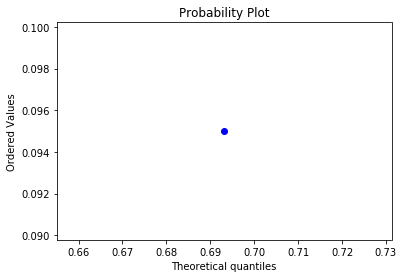



k = 9, size = 13
Number of negative jump times: 1
Mean: 1.106


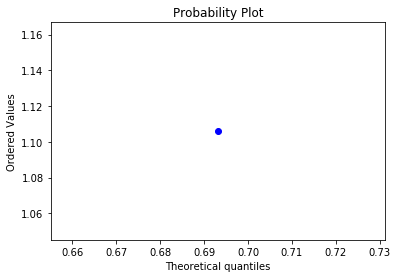



k = 9, size = 14
Number of negative jump times: 0
Mean: nan


k = 9, size = 15
Number of negative jump times: 1
Mean: 0.182


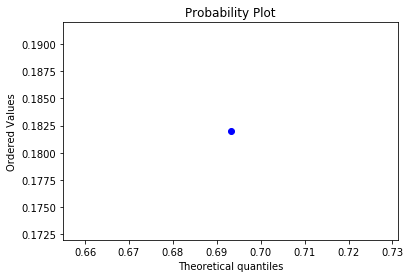



k = 9, size = 16
Number of negative jump times: 0
Mean: nan


k = 9, size = 17
Number of negative jump times: 0
Mean: nan


k = 9, size = 18
Number of negative jump times: 3
Mean: 64.62933333333334


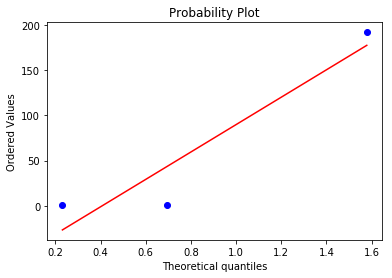



k = 9, size = 19
Number of negative jump times: 8
Mean: 9.02875


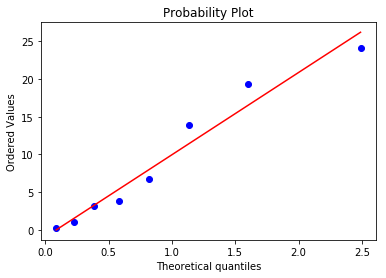



k = 9, size = 20
Number of negative jump times: 152
Mean: 8.360118421052631


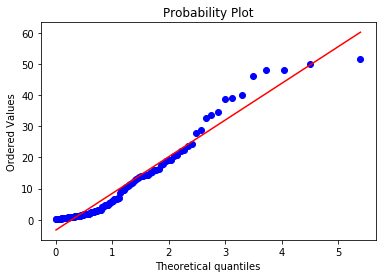



k = 9, size = 21
Number of negative jump times: 66
Mean: 10.699060606060607


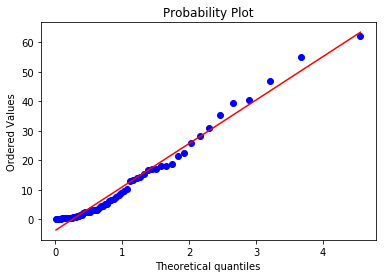



k = 9, size = 22
Number of negative jump times: 60
Mean: 4.585616666666667


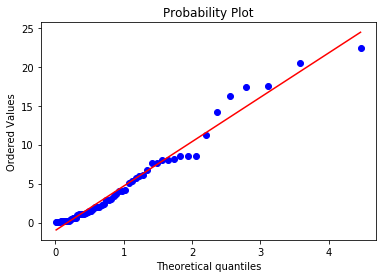



k = 9, size = 23
Number of negative jump times: 65
Mean: 5.993815384615384


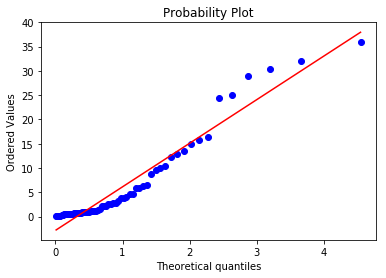



k = 10, size = 1
Number of negative jump times: 300
Mean: 0.9112333333333333


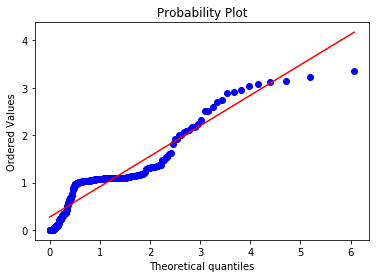



k = 10, size = 2
Number of negative jump times: 273
Mean: 1.3574908424908425


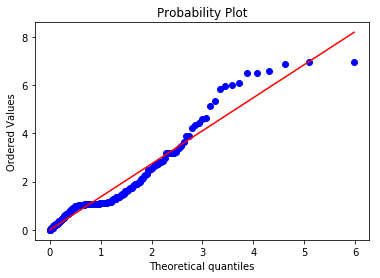



k = 10, size = 3
Number of negative jump times: 266
Mean: 0.8936127819548872


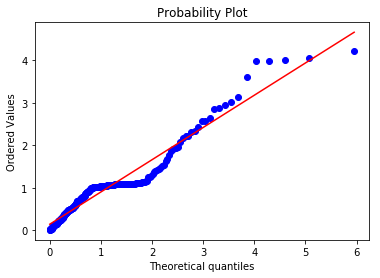



k = 10, size = 4
Number of negative jump times: 302
Mean: 1.2686291390728477


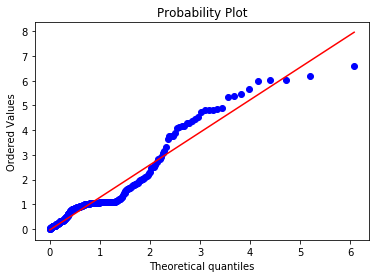



k = 10, size = 5
Number of negative jump times: 227
Mean: 2.3562114537444936


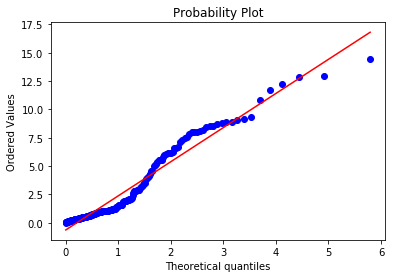



k = 10, size = 6
Number of negative jump times: 412
Mean: 0.8622815533980582


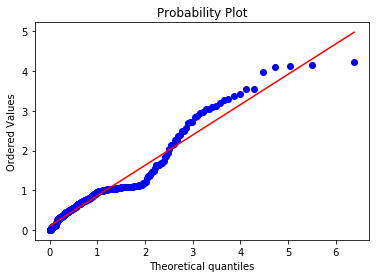



k = 10, size = 7
Number of negative jump times: 175
Mean: 2.643828571428571


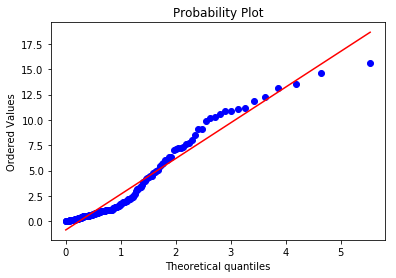



k = 10, size = 8
Number of negative jump times: 193
Mean: 2.1743108808290157


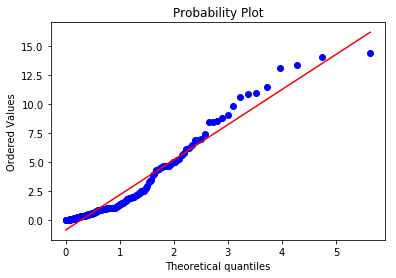



k = 10, size = 9
Number of negative jump times: 277
Mean: 2.5880324909747294


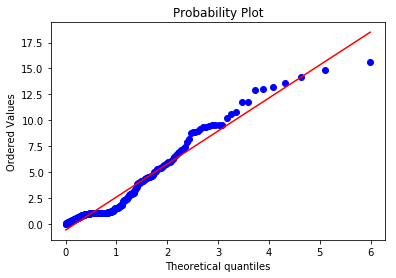



k = 10, size = 10
Number of negative jump times: 228
Mean: 1.191122807017544


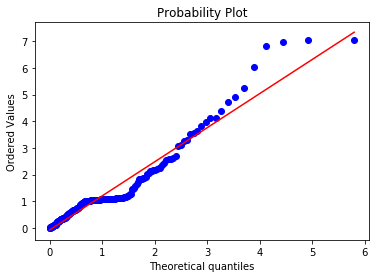



k = 10, size = 11
Number of negative jump times: 168
Mean: 3.051392857142857


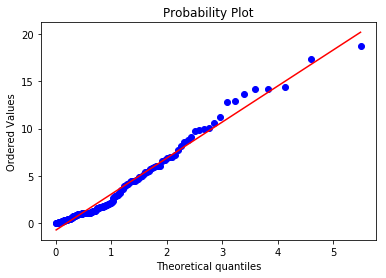



k = 10, size = 12
Number of negative jump times: 96
Mean: 3.1138854166666667


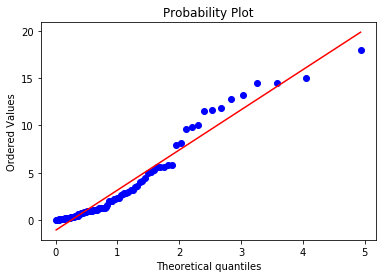



k = 10, size = 13
Number of negative jump times: 74
Mean: 1.8741756756756751


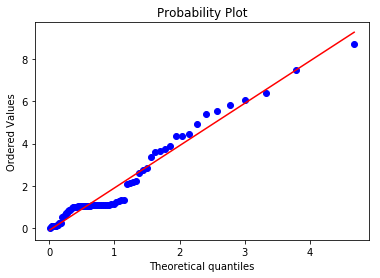



k = 10, size = 14
Number of negative jump times: 32
Mean: 0.7079374999999999


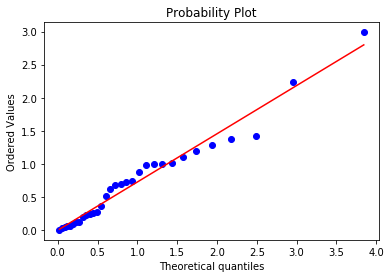



k = 10, size = 15
Number of negative jump times: 2
Mean: 0.6285000000000001


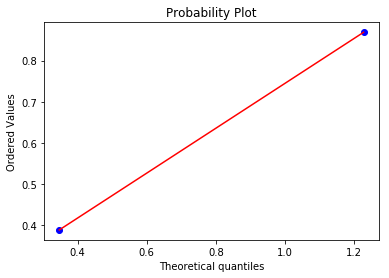



k = 10, size = 16
Number of negative jump times: 3
Mean: 0.7406666666666667


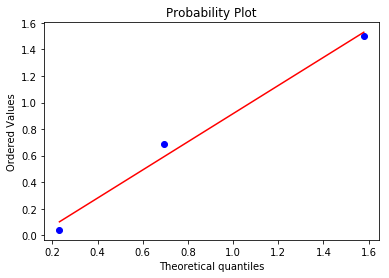



k = 10, size = 17
Number of negative jump times: 0
Mean: nan


k = 10, size = 18
Number of negative jump times: 0
Mean: nan


k = 10, size = 19
Number of negative jump times: 0
Mean: nan


k = 10, size = 20
Number of negative jump times: 0
Mean: nan


k = 10, size = 21
Number of negative jump times: 0
Mean: nan


k = 10, size = 22
Number of negative jump times: 1
Mean: 715.251


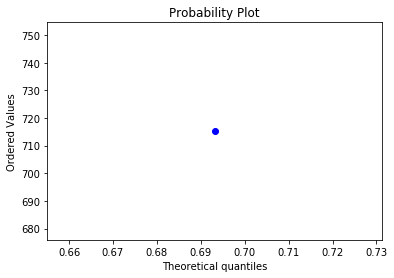



k = 10, size = 23
Number of negative jump times: 35
Mean: 1.3822285714285711


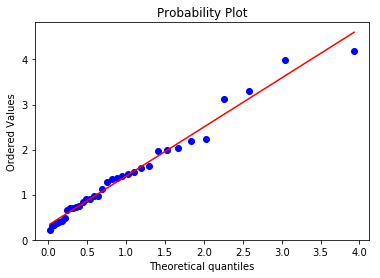



k = 10, size = 24
Number of negative jump times: 11
Mean: 3.5742727272727275


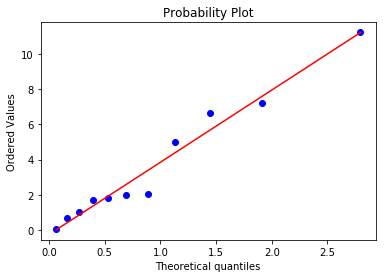



k = 10, size = 25
Number of negative jump times: 6
Mean: 4.477166666666666


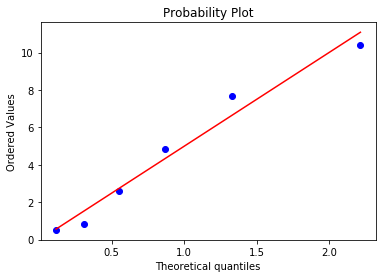



k = 10, size = 26
Number of negative jump times: 3
Mean: 4.483


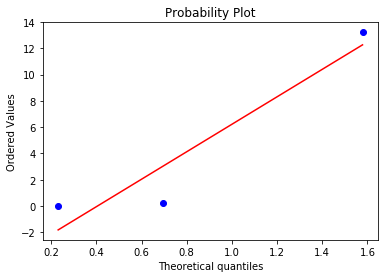



k = 10, size = 27
Number of negative jump times: 1
Mean: 4.915


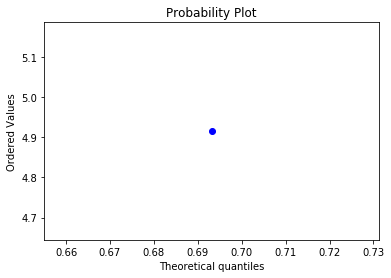



k = 10, size = 28
Number of negative jump times: 1
Mean: 13.666


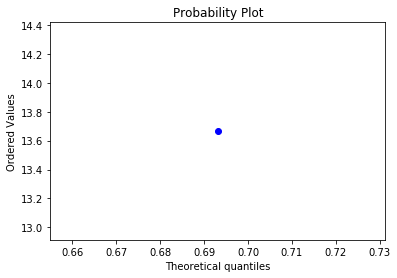



k = 10, size = 29
Number of negative jump times: 1
Mean: 0.226


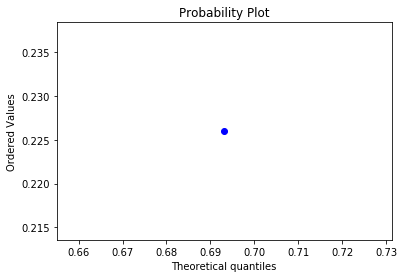



k = 10, size = 30
Number of negative jump times: 1
Mean: 2.978


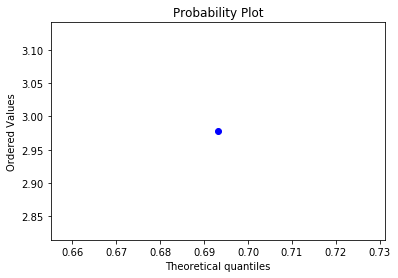

In [12]:
# Remove outliers
def without_outliers(data):
    if len(data) <= 3:
        return data
    quartiles = np.percentile(data,[25,50,75])
    IQR = quartiles[2] - quartiles[0]
    lower_bound = quartiles[0] - 3*IQR
    upper_bound = quartiles[2] + 3*IQR
    return [d for d in data if d >= lower_bound and d <= upper_bound]


for k in time_between_events_pos:
    time_between_events_pos[k] = \
    OrderedDict([(s,without_outliers(ts)) for (s,ts) in time_between_events_pos[k].items()])
    #time_between_events_pos[k] = \
    #OrderedDict([(s,ts) for (s,ts) in time_between_events_pos[k].items() if len(ts) > 20])
# time_between_events_pos = OrderedDict([(k,d) for (k,d) in time_between_events_pos.items() if len(d) > 0])
        
for k in time_between_events_neg:
    time_between_events_neg[k] = \
    OrderedDict([(s,without_outliers(ts)) for (s,ts) in time_between_events_neg[k].items()])
    #time_between_events_neg[k] = \
    #OrderedDict([(s,ts) for (s,ts) in time_between_events_neg[k].items() if len(ts) > 20])    
# time_between_events_neg = OrderedDict([(k,d) for (k,d) in time_between_events_neg.items() if len(d) > 0])

       
for k,v in time_between_events_pos.items():
    for size,times in v.items():
        n = len(times)
        print("k = {}, size = {}".format(k,size))
        print("Number of positive jump times: {}".format(n))
        num_data_points = len(times)
        print("Mean: {}".format(np.mean(times)))
        probplot(times, dist=expon, plot=pylab)
        pylab.show()
        print("\n")

for k,v in time_between_events_neg.items():
    for size,times in v.items():
        n = len(times)
        print("k = {}, size = {}".format(k,size))
        print("Number of negative jump times: {}".format(n))
        num_data_points = len(times)
        print("Mean: {}".format(np.mean(times)))
        probplot(times, dist=expon, plot=pylab)
        pylab.show()
        print("\n")

# Compare to aribrtary exponential distribution

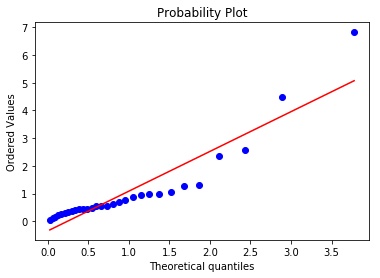

In [13]:
x = [np.random.exponential() for _ in range(30)]
kstest(x,'expon',args=(np.mean(x),))
probplot(x, dist=expon, plot=pylab)
pylab.show()

# Graph Arrival Rates

-10


/Users/andrewwang/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


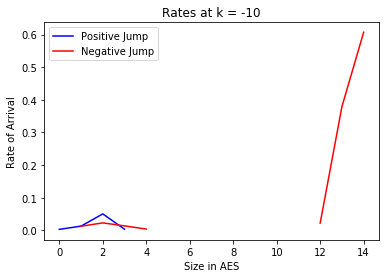

-9


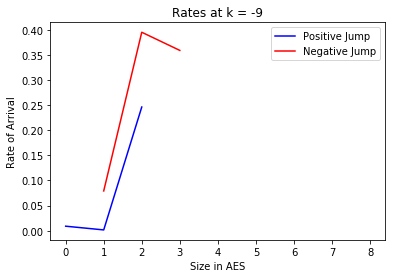

-8


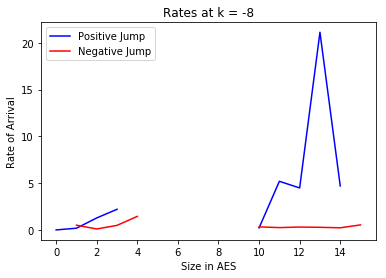

-7


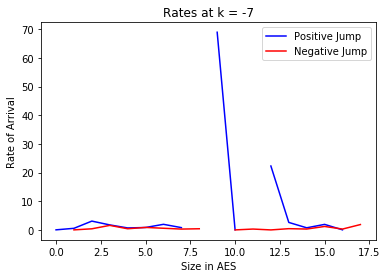

-6


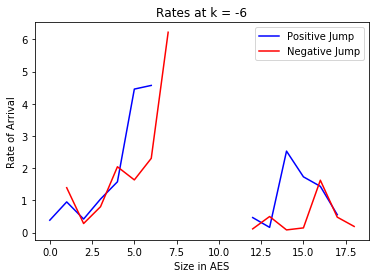

-5


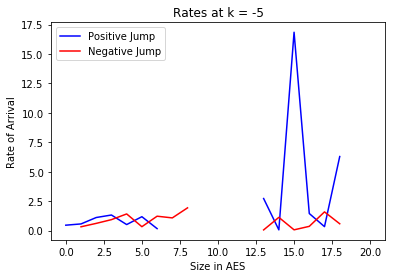

-4


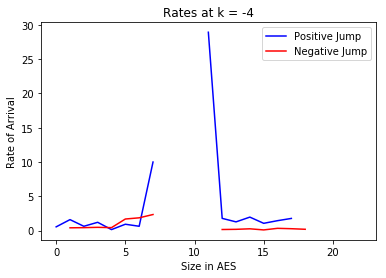

-3


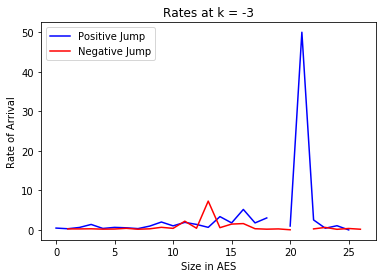

-2


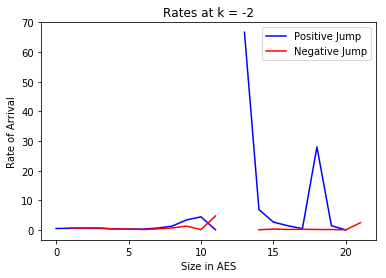

-1


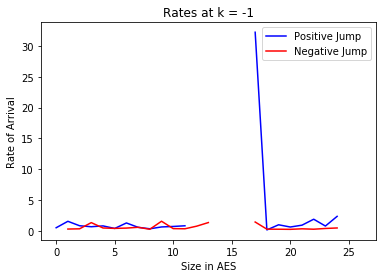

1


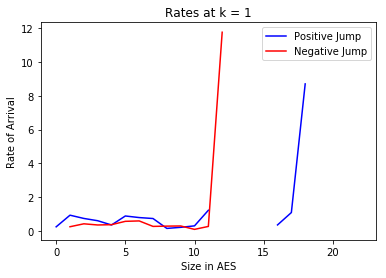

2


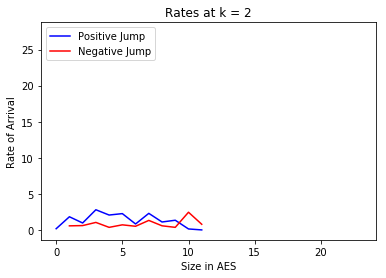

3


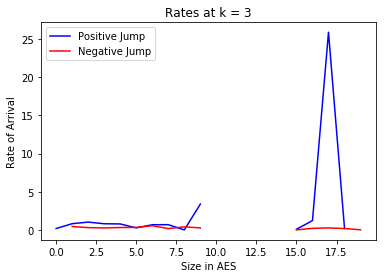

4


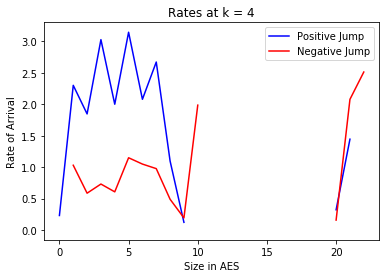

5


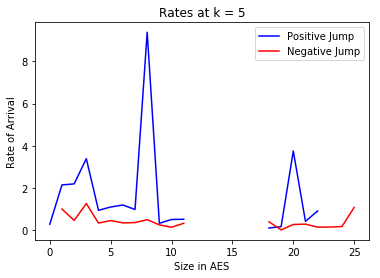

6


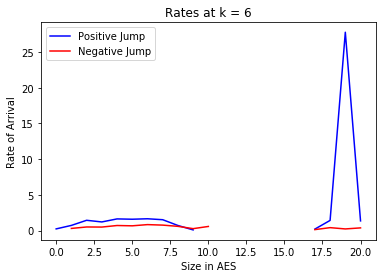

7


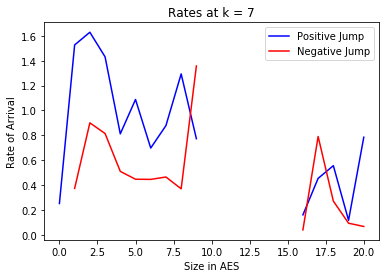

8


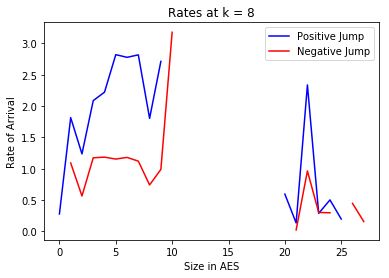

9


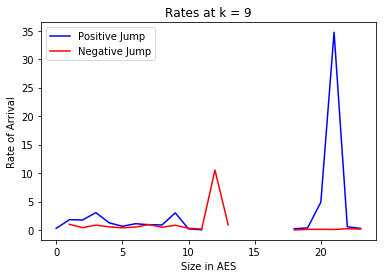

10


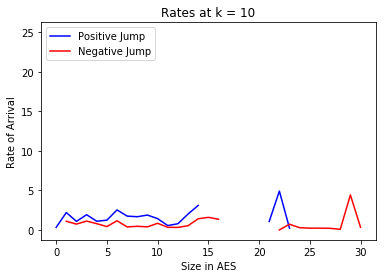

In [14]:
pos_rates_dict = OrderedDict([(k,OrderedDict()) for k in time_between_events_pos])
neg_rates_dict = OrderedDict([(k,OrderedDict()) for k in time_between_events_neg])

for k in pos_rates_dict:
    pos_rates_dict[k] = OrderedDict([(size,1/np.mean(times)) for size,times in time_between_events_pos[k].items()])
for k in neg_rates_dict:
    neg_rates_dict[k] = OrderedDict([(size,1/np.mean(times)) for size,times in time_between_events_neg[k].items()])

for k in range(-K,K+1):
    if k == 0:
        continue
    
    print(k)
        
    if len(pos_rates_dict[k]) > 0:
        pos_size,pos_rates = zip(*(pos_rates_dict[k].items()))
    else:
        pos_size,pos_rates = [],[]
        
    if len(neg_rates_dict[k]) > 0:
        neg_size,neg_rates = zip(*(neg_rates_dict[k].items()))
    else:
        neg_size,neg_rates = [],[]
        
    plt.plot(pos_size,pos_rates,'b')
    plt.plot(neg_size,neg_rates,'r')
    plt.xlabel('Size in AES')
    plt.ylabel('Rate of Arrival')
    plt.title('Rates at k = {}'.format(k))
    plt.legend(['Positive Jump', 'Negative Jump'])
    plt.show()
        
        

In [ ]:
time_between_events_pos[-1][0]

# Find (number of positive jumps - number of negative jumps) between time intervals of 1 minutes each

In [15]:
ending_time = updates[-1]['time'] + timedelta(seconds=1)
ending_time + timedelta(seconds = 1)
time_period_length = (ending_time - starting_time).total_seconds()

times = []
time = starting_time
while time <= ending_time:
    time += timedelta(seconds = 60)
    times.append(time)

n = len(times)

changes_at_each_k = OrderedDict([(k,[0 for _ in range(n)]) for k in range(-K,K+1) if k != 0])

i = 0
for u in combined_updates:
    if u['change'] < 0:
        changes_at_each_k[u['k']][i] -= 1
    else:
        changes_at_each_k[u['k']][i] += 1
        
    if u['time'] > times[i]:
        i += 1
        
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df = pd.DataFrame(changes_at_each_k)
correlations = df.corr().astype('object')

significances = correlations.copy()
for k1 in changes_at_each_k:
    for k2 in changes_at_each_k:
        res = pearsonr(changes_at_each_k[k1],changes_at_each_k[k2])
        significances[k1][k2] = res
significances

,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8,9,10
-10,"(1.0, 0.0)","(0.121450482715, 3.80355480422e-06)","(0.0809064926558, 0.00212232988016)","(0.144166103111, 3.91385979006e-08)","(0.126451579677, 1.48185423587e-06)","(0.0776384177191, 0.00319771925152)","(0.105141517559, 6.40259486031e-05)","(-0.140822985881, 8.05124814872e-08)","(0.00431449017591, 0.870060235963)","(0.119100154995, 5.84979388724e-06)","(0.0264819267326, 0.315271668646)","(-0.0155550523554, 0.555327544202)","(-0.0558352020766, 0.0341234563302)","(-0.0928037187951, 0.000421556855913)","(-0.0024115288446, 0.927149534551)","(-0.0119623573902, 0.650144417513)","(-0.00058621179141, 0.98226779132)","(-0.016631606745, 0.528288596036)","(-0.032383676969, 0.21939851457)","(-0.0182273717053, 0.489479524661)"
-9,"(0.121450482715, 3.80355480422e-06)","(1.0, 0.0)","(0.168374378521, 1.27800483446e-10)","(0.174379984747, 2.68991779273e-11)","(0.0330512461291, 0.210038385547)","(0.00794042571425, 0.763367940888)","(0.0568806582257, 0.0309012259507)","(-0.06423719619, 0.0147674819905)","(0.0981370093758, 0.000191624279293)","(0.113023109319, 1.71584193451e-05)","(-0.0831896163178, 0.00158007331498)","(0.00660310320099, 0.802312608177)","(0.0210995549244, 0.423672807406)","(-0.0440138561605, 0.0950050482849)","(0.0211898170597, 0.42169217994)","(-0.00219072361464, 0.933803812443)","(0.0203901268974, 0.439428073004)","(0.009438959811, 0.720432919723)","(0.0505914101544, 0.0549373971938)","(0.0466663325654, 0.0766789314605)"
-8,"(0.0809064926558, 0.00212232988016)","(0.168374378521, 1.27800483446e-10)","(1.0, 0.0)","(0.232771222561, 3.60115726761e-19)","(-0.0197745586138, 0.453367090835)","(0.0284688027534, 0.280322226188)","(0.0464677270158, 0.0779431375494)","(-0.0969784532535, 0.000228193420039)","(0.0537556423922, 0.0413915251075)","(0.0370515041341, 0.159941819935)","(-0.0562089362537, 0.03294005662)","(0.00993909894721, 0.70628949113)","(-0.0250141565549, 0.342852273924)","(-0.0636703428796, 0.0156716644466)","(-0.0846264710294, 0.00130750492223)","(-0.0267288728209, 0.310778583554)","(-0.014108496421, 0.592690313952)","(-0.00229031832585, 0.930801784812)","(0.0456116226304, 0.0835879720196)","(0.0347985620473, 0.186913306324)"
-7,"(0.144166103111, 3.91385979006e-08)","(0.174379984747, 2.68991779273e-11)","(0.232771222561, 3.60115726761e-19)","(1.0, 0.0)","(0.278649155934, 4.3254863985e-27)","(-0.0135297819532, 0.607953593076)","(0.0226517576357, 0.390374991539)","(-0.0572017196323, 0.0299655859429)","(0.116239858718, 9.77191014889e-06)","(0.0523613242352, 0.0469656427793)","(-0.0796599434838, 0.00248579308978)","(-0.0134778238853, 0.609332484)","(-0.0209547994572, 0.426860511458)","(-0.0833066665725, 0.0015560528566)","(-0.0539109620505, 0.0408067504926)","(-0.00499889450991, 0.849676533945)","(0.0282588120656, 0.283886569736)","(-0.0173410567852, 0.510843512754)","(0.0105465366953, 0.689247479363)","(0.0219312355951, 0.405629578241)"
-6,"(0.126451579677, 1.48185423587e-06)","(0.0330512461291, 0.210038385547)","(-0.0197745586138, 0.453367090835)","(0.278649155934, 4.3254863985e-27)","(1.0, 0.0)","(-0.0744740867281, 0.00469033477686)","(0.0365572580239, 0.165591483824)","(0.0884027664264, 0.00078419851853)","(-0.0422072116167, 0.109382762906)","(-0.0132162269595, 0.6162958813)","(0.0383008560686, 0.146310910189)","(0.0775309163366, 0.0032403285633)","(-0.0261445975632, 0.321477791484)","(-0.0369831281799, 0.160714622494)","(-0.0613150290395, 0.0199700151491)","(-0.0174567074303, 0.508028489157)","(-0.00963421867055, 0.71489950352)","(-0.0171646615979, 0.515152733377)","(-0.027627310963, 0.294789618139)","(0.0331456086853, 0.208738957716)"
-5,"(0.0776384177191, 0.00319771925152)","(0.00794042571425, 0.763367940888)","(0.0284688027534, 0.280322226188)","(-0.0135297819532, 0.607953593076)","(-0.0744740867281, 0.00469033477686)","(1.0, 0.0)","(0.554925966843, 4.36670353878e-117)","(-0.142610988077, 5.48556416891e-08)","(0.00229133778693, 0.930771060779)","(0.0033692576890

# Correlation Matrix
## Rows and columns are queue positions, the value is (correlation, p-value) where the p-value is Pearson's correlation
### Highlighted red are those that have correlation > 0.1

In [16]:
threshold = 0.10
def color_significant_red(val):
    global threshold
    if val[0] > 0.99999: # Same index
        color = 'green'
    else:
        color = 'red' if abs(val[0]) > threshold else 'black'
    return 'color: %s' % color

colored_table = significances.loc[-5:5,-5:5].style.applymap(color_significant_red)
colored_table = colored_table.format(lambda x: "{0:.3f},{1:.3f}".format(x[0],x[1]))
colored_table

,-5,-4,-3,-2,-1,1,2,3,4,5
-5,"1.000,0.000","0.555,0.000","-0.143,0.000","0.002,0.931","0.003,0.898","-0.059,0.024","0.056,0.033","0.016,0.555","0.004,0.881","-0.007,0.799"
-4,"0.555,0.000","1.000,0.000","0.011,0.678","0.054,0.042","-0.083,0.002","-0.089,0.001","0.081,0.002","0.019,0.462","-0.031,0.244","-0.037,0.164"
-3,"-0.143,0.000","0.011,0.678","1.000,0.000","-0.108,0.000","-0.024,0.360","-0.075,0.005","-0.095,0.000","0.033,0.214","0.097,0.000","0.009,0.725"
-2,"0.002,0.931","0.054,0.042","-0.108,0.000","1.000,0.000","-0.055,0.036","-0.123,0.000","-0.097,0.000","-0.036,0.175","0.011,0.666","0.028,0.297"
-1,"0.003,0.898","-0.083,0.002","-0.024,0.360","-0.055,0.036","1.000,0.000","0.007,0.803","-0.062,0.018","-0.076,0.004","-0.049,0.064","-0.008,0.756"
1,"-0.059,0.024","-0.089,0.001","-0.075,0.005","-0.123,0.000","0.007,0.803","1.000,0.000","0.041,0.118","-0.118,0.000","-0.070,0.008","-0.053,0.045"
2,"0.056,0.033","0.081,0.002","-0.095,0.000","-0.097,0.000","-0.062,0.018","0.041,0.118","1.000,0.000","-0.015,0.578","-0.123,0.000","-0.041,0.118"
3,"0.016,0.555","0.019,0.462","0.033,0.214","-0.036,0.175","-0.076,0.004","-0.118,0.000","-0.015,0.578","1.000,0.000","-0.028,0.296","-0.134,0.000"
4,"0.004,0.881","-0.031,0.244","0.097,0.000","0.011,0.666","-0.049,0.064","-0.070,0.008","-0.123,0.000","-0.028,0.296","1.000,0.000","-0.017,0.530"
5,"-0.007,0.799","-0.037,0.164","0.009,0.725","0.028,0.297","-0.008,0.756","-0.053,0.045","-0.041,0.118","-0.134,0.000","-0.017,0.530","1.000,0.000"


# Lagged Correlation Matrix

In [17]:
lagged_significances = significances.copy()
for k1 in changes_at_each_k:
    for k2 in changes_at_each_k:
        res = pearsonr(changes_at_each_k[k1][:(n-1)],changes_at_each_k[k2][1:n])
        significances[k1][k2] = res
lagged_significances

,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8,9,10
-10,"(1.0, 0.0)","(0.121450482715, 3.80355480422e-06)","(0.0809064926558, 0.00212232988016)","(0.144166103111, 3.91385979006e-08)","(0.126451579677, 1.48185423587e-06)","(0.0776384177191, 0.00319771925152)","(0.105141517559, 6.40259486031e-05)","(-0.140822985881, 8.05124814872e-08)","(0.00431449017591, 0.870060235963)","(0.119100154995, 5.84979388724e-06)","(0.0264819267326, 0.315271668646)","(-0.0155550523554, 0.555327544202)","(-0.0558352020766, 0.0341234563302)","(-0.0928037187951, 0.000421556855913)","(-0.0024115288446, 0.927149534551)","(-0.0119623573902, 0.650144417513)","(-0.00058621179141, 0.98226779132)","(-0.016631606745, 0.528288596036)","(-0.032383676969, 0.21939851457)","(-0.0182273717053, 0.489479524661)"
-9,"(0.121450482715, 3.80355480422e-06)","(1.0, 0.0)","(0.168374378521, 1.27800483446e-10)","(0.174379984747, 2.68991779273e-11)","(0.0330512461291, 0.210038385547)","(0.00794042571425, 0.763367940888)","(0.0568806582257, 0.0309012259507)","(-0.06423719619, 0.0147674819905)","(0.0981370093758, 0.000191624279293)","(0.113023109319, 1.71584193451e-05)","(-0.0831896163178, 0.00158007331498)","(0.00660310320099, 0.802312608177)","(0.0210995549244, 0.423672807406)","(-0.0440138561605, 0.0950050482849)","(0.0211898170597, 0.42169217994)","(-0.00219072361464, 0.933803812443)","(0.0203901268974, 0.439428073004)","(0.009438959811, 0.720432919723)","(0.0505914101544, 0.0549373971938)","(0.0466663325654, 0.0766789314605)"
-8,"(0.0809064926558, 0.00212232988016)","(0.168374378521, 1.27800483446e-10)","(1.0, 0.0)","(0.232771222561, 3.60115726761e-19)","(-0.0197745586138, 0.453367090835)","(0.0284688027534, 0.280322226188)","(0.0464677270158, 0.0779431375494)","(-0.0969784532535, 0.000228193420039)","(0.0537556423922, 0.0413915251075)","(0.0370515041341, 0.159941819935)","(-0.0562089362537, 0.03294005662)","(0.00993909894721, 0.70628949113)","(-0.0250141565549, 0.342852273924)","(-0.0636703428796, 0.0156716644466)","(-0.0846264710294, 0.00130750492223)","(-0.0267288728209, 0.310778583554)","(-0.014108496421, 0.592690313952)","(-0.00229031832585, 0.930801784812)","(0.0456116226304, 0.0835879720196)","(0.0347985620473, 0.186913306324)"
-7,"(0.144166103111, 3.91385979006e-08)","(0.174379984747, 2.68991779273e-11)","(0.232771222561, 3.60115726761e-19)","(1.0, 0.0)","(0.278649155934, 4.3254863985e-27)","(-0.0135297819532, 0.607953593076)","(0.0226517576357, 0.390374991539)","(-0.0572017196323, 0.0299655859429)","(0.116239858718, 9.77191014889e-06)","(0.0523613242352, 0.0469656427793)","(-0.0796599434838, 0.00248579308978)","(-0.0134778238853, 0.609332484)","(-0.0209547994572, 0.426860511458)","(-0.0833066665725, 0.0015560528566)","(-0.0539109620505, 0.0408067504926)","(-0.00499889450991, 0.849676533945)","(0.0282588120656, 0.283886569736)","(-0.0173410567852, 0.510843512754)","(0.0105465366953, 0.689247479363)","(0.0219312355951, 0.405629578241)"
-6,"(0.126451579677, 1.48185423587e-06)","(0.0330512461291, 0.210038385547)","(-0.0197745586138, 0.453367090835)","(0.278649155934, 4.3254863985e-27)","(1.0, 0.0)","(-0.0744740867281, 0.00469033477686)","(0.0365572580239, 0.165591483824)","(0.0884027664264, 0.00078419851853)","(-0.0422072116167, 0.109382762906)","(-0.0132162269595, 0.6162958813)","(0.0383008560686, 0.146310910189)","(0.0775309163366, 0.0032403285633)","(-0.0261445975632, 0.321477791484)","(-0.0369831281799, 0.160714622494)","(-0.0613150290395, 0.0199700151491)","(-0.0174567074303, 0.508028489157)","(-0.00963421867055, 0.71489950352)","(-0.0171646615979, 0.515152733377)","(-0.027627310963, 0.294789618139)","(0.0331456086853, 0.208738957716)"
-5,"(0.0776384177191, 0.00319771925152)","(0.00794042571425, 0.763367940888)","(0.0284688027534, 0.280322226188)","(-0.0135297819532, 0.607953593076)","(-0.0744740867281, 0.00469033477686)","(1.0, 0.0)","(0.554925966843, 4.36670353878e-117)","(-0.142610988077, 5.48556416891e-08)","(0.00229133778693, 0.930771060779)","(0.0033692576890

In [19]:
colored_table_2 = lagged_significances.loc[-5:5,-5:5].style.applymap(color_significant_red)
colored_table_2 = colored_table.format(lambda x: "{0:.3f},{1:.3f}".format(x[0],x[1]))
colored_table_2

,-5,-4,-3,-2,-1,1,2,3,4,5
-5,"-0.071,0.007","0.030,0.251","0.171,0.000","-0.009,0.726","-0.032,0.232","-0.066,0.012","-0.011,0.675","-0.030,0.254","0.046,0.084","0.005,0.838"
-4,"0.209,0.000","0.179,0.000","-0.070,0.008","0.035,0.180","0.035,0.188","-0.036,0.174","-0.030,0.261","-0.004,0.893","-0.001,0.983","-0.005,0.851"
-3,"0.090,0.001","0.110,0.000","-0.072,0.006","-0.028,0.291","-0.073,0.006","-0.009,0.738","0.041,0.124","0.056,0.035","-0.022,0.398","-0.045,0.087"
-2,"0.006,0.824","0.026,0.316","0.089,0.001","-0.062,0.018","0.009,0.735","0.054,0.042","0.057,0.031","-0.068,0.010","-0.083,0.002","0.001,0.975"
-1,"0.069,0.009","-0.065,0.013","0.022,0.411","0.013,0.627","-0.181,0.000","0.068,0.009","-0.009,0.739","-0.031,0.247","-0.009,0.724","-0.003,0.918"
1,"0.006,0.824","0.019,0.468","0.112,0.000","-0.015,0.569","0.039,0.141","-0.172,0.000","-0.030,0.249","0.043,0.102","0.093,0.000","0.033,0.211"
2,"-0.020,0.446","0.010,0.696","-0.037,0.158","-0.014,0.603","0.047,0.074","0.021,0.429","-0.083,0.002","-0.023,0.384","0.077,0.004","-0.027,0.299"
3,"-0.040,0.125","0.012,0.653","-0.055,0.038","0.043,0.101","-0.011,0.670","0.121,0.000","0.027,0.313","-0.022,0.403","0.027,0.307","-0.022,0.397"
4,"-0.037,0.161","0.022,0.408","0.055,0.036","0.051,0.052","-0.057,0.032","-0.112,0.000","-0.024,0.357","0.114,0.000","-0.162,0.000","0.008,0.773"
5,"0.007,0.779","-0.021,0.426","0.040,0.132","-0.016,0.541","0.008,0.748","0.031,0.239","-0.018,0.498","0.046,0.079","0.067,0.011","-0.152,0.000"


# Do optimization for this model
Partially inspired from the article you sent me, arrival rate intensity of positive and negative jumps at a certain position $k$ is a point process:

$$\lambda(t)^+ = \mu^+ + \phi_1(t-T_0^+) + \phi_2(t-T_0^-) + \phi_3(t-T_1^+) + \phi_4(t-T_1^-) + \phi_5(t-T_{-1}^+) + \phi_6(t-T_{-1}^-)$$

$$\lambda(t)^- = \mu^- + \phi_7(t-T_0^+) + \phi_8(t-T_0^-) + \phi_9(t-T_1^+) + \phi_{10}(t-T_1^-) + \phi_{11}(t-T_{-1}^+) + \phi_{12}(t-T_{-1}^-)$$

where $T_0^+$ is the time of the last positive jump at position $k$, $T_0^-$ is the time of the last negative jump at position $k$, $T_1^+$ is the time of the last positive jump at position $k+1$, and so on.

$\mu^+$ and $\mu^-$ could be the base rates. Each $\phi_i(x) = \alpha_ie^{(-\delta_ix)}$. This would address the fact that previous arrivals at price $k$ as well as at the nearest positions $k+1$ and $k-1$ affect the arrival rate. I suppose I could also take into account more than one previous arrival from each position, or have it depend on even more positions. I could use an MLE to estimate the parameters above.


In [40]:
times_1_pos = []
times_1_neg = []
times_2_pos = []
times_2_neg = []
times_m1_pos = []
times_m1_neg = []

for u in combined_updates:
    t = (u['time'] - starting_time).total_seconds()
    if u['k'] == 1:
        if u['change'] > 0:
            times_1_pos.append(t)
        else:
            times_1_neg.append(t)
    if u['k'] == 2:
        if u['change'] > 0:
            times_2_pos.append(t)
        else:
            times_2_neg.append(t)
    if u['k'] == -1:
        if u['change'] > 0:
            times_m1_pos.append(t)
        else:
            times_m1_neg.append(t)

In [98]:
def likelihood(x,times,other_times,T):
    n = int((len(x) - 1)/2)
    if len(other_times) != n:
        raise Exception('Must provide {} correct number of other times'.format(n))
    
    mu = x[0]
    alpha = x[1:(n+1)]
    beta = x[(n+1):(2*n+1)]
    
    cum = 0
    
    cum += mu*T
    
    for i in range(n):
        prev_time = -np.inf
        for t in other_times[i]:
            cum += alpha[i]/beta[i]*(1-np.exp(-beta[i]*(t-prev_time)))
            prev_time = t
        cum += alpha[i]/beta[i]*(1-np.exp(-beta[i]*(T-prev_time)))
    
    for t in times:
        inner_cum = mu
        for i in range(n):
            index = bisect.bisect_left(other_times[i],t)
            if index == 0:
                prev_time = -np.inf
            else:
                prev_time = other_times[i][index-1]
            inner_cum += alpha[i]*np.exp(-beta[i]*(t-prev_time))
        cum -= np.log(inner_cum)
        
    print(cum)
    return cum

In [99]:
likelihood([0.5 for _ in range(13)], times_1_pos, \
           [times_1_pos,times_1_neg,times_2_pos,times_2_neg,times_m1_pos,times_m1_neg],86400)

54814.222148


54814.222148029185

In [100]:
from scipy.optimize import minimize
import scipy
from scipy.optimize import LinearConstraint

In [101]:
linear_constraint = LinearConstraint([[1 for _ in range(13)]], 0, np.inf,keep_feasible=True)
res = minimize(likelihood,[0.5 for _ in range(13)],\
         args=(times_1_pos, \
           [times_1_pos,times_1_neg,times_2_pos,times_2_neg,times_m1_pos,times_m1_neg],86400), \
         constraints=[linear_constraint],\
        options={'maxiter':1000000,})

/Users/andrewwang/anaconda3/lib/python3.6/site-packages/scipy/optimize/_constraints.py:312: OptimizeWarning: Constraint option `keep_feasible` is ignored by this method.
  "method.", OptimizeWarning)


54814.222148
54814.222148
54814.223401
54814.2222008
54814.2221947
54814.2222094
54814.2222063
54814.2222045
54814.2222004
54814.2221099
54814.2221083
54814.222104
54814.2221017
54814.2221093
54814.2221081
nan


/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in log


nan
nan
nan
nan
nan
48240.9585671
48240.9585671
48240.9598173
48240.9586186
48240.9586123
48240.9586272
48240.9586239
48240.9586225
48240.9586181
48240.9585302
48240.9585286
48240.9585243
48240.9585221
48240.9585294
48240.9585282
nan


/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in exp
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in double_scalars
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: overflow encountered in exp
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in double_scalars
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in double_scalars


nan
nan
nan
nan
nan
37756.3083219
37756.3083219
37756.3095678
37756.308374
37756.3083677
37756.3083831
37756.3083797
37756.3083778
37756.3083733
37756.3082812
37756.3082787
37756.3082746
37756.3082712
37756.3082811
37756.3082795
nan
nan
nan
nan
nan
nan
33300.5825118
33300.5825118
33300.5837551
33300.5825632
33300.5825562
33300.5825717
33300.5825673
33300.5825672
33300.5825622
33300.5824701
33300.5824678
33300.5824644
33300.5824617
33300.5824699
33300.5824683
nan
nan
nan
nan
nan
nan
nan
18063.1120584
18063.1120584
18063.1132385
18063.1121063
18063.1120982
18063.1121146
18063.1121087
18063.1121108
18063.1121048
18063.1120165
18063.1120147
18063.1120108
18063.1120077
18063.112016
18063.1120141
nan


/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in double_scalars


nan
nan
nan
17573.8641483
17573.8641483
17573.8653157
17573.8641985
17573.8642017
17573.8642016
17573.8641965
17573.8641958
17573.8641907
17573.8641036
17573.8640652
17573.8641086
17573.8640978
17573.8641189
17573.8641109
nan
nan
nan
nan
17146.6478315
17146.6478315
17146.6489805
17146.6478842
17146.6478834
17146.6478863
17146.6478802
17146.6478773
17146.6478721
17146.6477846
17146.6477539
17146.6477913
17146.6477738
17146.6478087
17146.6477958
nan
nan
nan
nan
nan
16684.9254157
16684.9254157
16684.9265288
16684.9254678
16684.9254681
16684.925473
16684.9254639
16684.9254611
16684.9254545
16684.9253745
16684.9253385
16684.9253733
16684.9253522
16684.9253971
16684.9253813
nan
nan
nan
nan
nan
nan
16254.0911633
16254.0911633
16254.0921977
16254.0912154
16254.0912162
16254.0912225
16254.0912107
16254.0912082
16254.0912002
16254.0911259
16254.091087
16254.0911194
16254.0910949
16254.0911483
16254.0911301
nan
nan
nan
nan
15939.4641554
15939.4641554
15939.4650373
15939.464207
15939.464209
15939.

8171.08928546
8171.08926568
8171.089286
8171.08929618
8171.08929036
8171.08927615
8171.08926282
8171.08927689
8171.08927056
8171.08927605
8171.0892635
nan
8005.03760101
8005.03760101
8005.00113332
8005.03760169
8005.03760753
8005.03757728
8005.0376071
8005.03762362
8005.03761265
8005.037601
8005.0375878
8005.03760168
8005.03759588
8005.03760088
8005.03759127
nan
7934.45179488
7934.45179488
7934.41764331
7934.45179546
7934.4517997
7934.45176082
7934.45180044
7934.45181765
7934.45180434
7934.45179486
7934.45178157
7934.45179551
7934.45178951
7934.4517948
7934.45178684
nan
7897.88553592
7897.88553592
7897.85323707
7897.88553589
7897.88554079
7897.88550612
7897.88554012
7897.88555631
7897.88554418
7897.88553591
7897.88552234
7897.88553653
7897.88553093
7897.88553597
7897.88552873
nan
7867.79753812
7867.79753812
7867.76695527
7867.79753702
7867.79754276
7867.79751323
7867.79754136
7867.79755528
7867.79754542
7867.79753812
7867.79752477
7867.79753872
7867.7975334
7867.79753833
7867.79753156


7039.31629433
7039.31640675
7039.31640854
7039.31640589
7039.31638186
7039.31641048
nan
7019.99624752
7019.99624752
7019.99634309
7019.99629232
7019.99625407
7019.99629076
7019.99625294
7019.99627442
7019.99624715
7019.99616553
7019.9962434
7019.99624557
7019.99624248
7019.99622283
7019.99624697
nan
nan
7009.13196888
7009.13196888
7009.13205671
7009.1320061
7009.13197532
7009.13201222
7009.1319741
7009.13198599
7009.13196847
7009.13189264
7009.13196487
7009.13196737
7009.13196391
7009.13194601
7009.13196834
nan
nan
nan
6986.1763437
6986.1763437
6986.17640834
6986.17636273
6986.17634995
6986.17638761
6986.17634856
6986.17634333
6986.17634321
6986.17628636
6986.17633991
6986.17634318
6986.17633889
6986.17632525
6986.17634318
nan
nan
nan
nan
6973.15230485
6973.15230485
6973.15233774
6973.15230438
6973.15231101
6973.15234938
6973.15230953
6973.15229552
6973.15230432
6973.15226553
6973.15230117
6973.152305
6973.15230013
6973.15229
6973.15230434
nan
nan
nan
nan
nan
6958.10133535
6958.1013353

5763.67561551
5763.67559782
5763.67561587
5763.67562165
5763.67561574
5763.67559678
5763.67561486
5763.67561631
5763.6756143
5763.67561478
5763.6756149
nan
5755.60613526
5755.60613526
5755.60651419
5755.60615412
5755.60613566
5755.60611745
5755.60613605
5755.60613732
5755.60613591
5755.60611732
5755.60613506
5755.60613653
5755.60613451
5755.60613505
5755.6061351
nan
5749.13814243
5749.13814243
5749.13852507
5749.13816122
5749.1381428
5749.13812405
5749.1381432
5749.13814013
5749.13814307
5749.13812479
5749.13814223
5749.13814374
5749.1381417
5749.13814228
5749.13814227
5720.9465783
5720.9465783
5720.94690374
5720.9465978
5720.94657847
5720.94654114
5720.94657899
5720.94645986
5720.94657884
5720.94656362
5720.94657816
5720.9465808
5720.94657775
5720.94657815
5720.94657821
5732.60593857
5717.95533098
5717.95533098
5717.95578215
5717.95535405
5717.95533116
5717.95531811
5717.95533166
5717.95530685
5717.95533153
5717.95531491
5717.95533084
5717.95533246
5717.95533048
5717.95533096
5717.955

5569.48337133
5569.48337018
5569.48336587
5569.48337026
5569.48337037
5569.48337004
5569.48337018
5569.48337044
5569.30358637
5569.30358637
5569.30412703
5569.30359743
5569.30358625
5569.30358997
5569.30358677
5569.30358701
5569.3035862
5569.30358215
5569.30358628
5569.30358658
5569.30358606
5569.30358624
5569.30358646
5569.20161556
5569.20161556
5569.20215502
5569.20162672
5569.20161545
5569.20161791
5569.20161596
5569.20161614
5569.20161539
5569.20161148
5569.20161547
5569.20161586
5569.20161526
5569.20161544
5569.20161565
5568.97103486
5568.97103486
5568.97157302
5568.9710461
5568.97103475
5568.97103541
5568.97103526
5568.97103531
5568.97103469
5568.97103099
5568.97103476
5568.97103521
5568.97103456
5568.97103477
5568.97103495
5568.37792538
5568.37792538
5568.37846378
5568.37793662
5568.37792528
5568.37792311
5568.37792577
5568.37792581
5568.37792521
5568.37792189
5568.37792528
5568.37792556
5568.37792509
5568.37792533
5568.37792547
5567.27598415
5567.27598415
5567.27652796
5567.275

5483.17158233
5483.17158244
5483.17158256
5483.17158248
5483.17158258
5483.17158249
5483.1641649
5483.1641649
5483.16473804
5483.16416527
5483.16416492
5483.16416401
5483.16416491
5483.16416473
5483.16416493
5483.16416471
5483.16416483
5483.16416498
5483.16416487
5483.16416497
5483.16416488
5483.14943129
5483.14943129
5483.15000393
5483.14943166
5483.14943131
5483.14943021
5483.1494313
5483.1494311
5483.14943132
5483.1494311
5483.14943122
5483.14943139
5483.14943126
5483.14943137
5483.14943127
5483.09788476
5483.09788476
5483.0984564
5483.09788512
5483.09788478
5483.09788361
5483.09788477
5483.09788459
5483.09788479
5483.09788457
5483.09788469
5483.09788487
5483.09788473
5483.09788483
5483.09788474
5483.07067906
5483.07067906
5483.07125149
5483.07067942
5483.07067908
5483.07067844
5483.07067907
5483.07067895
5483.07067909
5483.07067888
5483.07067899
5483.07067912
5483.07067902
5483.07067912
5483.07067904
5483.11551751
5483.05148132
5483.05148132
5483.05205467
5483.05148166
5483.0514813

5410.59087576
5410.5836311
5410.5836311
5410.58408078
5410.58363091
5410.58363109
5410.58363115
5410.58363111
5410.58363069
5410.5836311
5410.58363137
5410.58363111
5410.58363113
5410.58363103
5410.58363159
5410.58363107
5410.60240494
5410.58006733
5410.58006733
5410.58051746
5410.58006713
5410.58006733
5410.58006733
5410.58006734
5410.58006674
5410.58006734
5410.58006763
5410.58006735
5410.58006737
5410.58006727
5410.58006784
5410.58006731
5410.57761458
5410.57761458
5410.57806428
5410.57761439
5410.57761458
5410.57761457
5410.5776146
5410.57761409
5410.57761459
5410.57761487
5410.5776146
5410.57761463
5410.57761452
5410.57761509
5410.57761456
5411.10373219
5410.57853436
5410.57658893
5410.57658893
5410.57703812
5410.57658874
5410.57658892
5410.57658893
5410.57658894
5410.57658853
5410.57658893
5410.5765892
5410.57658894
5410.57658898
5410.57658886
5410.57658943
5410.5765889
5410.57479193
5410.57479193
5410.57524155
5410.57479176
5410.57479193
5410.57479196
5410.57479195
5410.57479155

5399.86504444
5397.54639651
5397.54639651
5397.54670651
5397.54639652
5397.54639649
5397.54639353
5397.54639673
5397.54639665
5397.5463965
5397.54639673
5397.54639653
5397.54639794
5397.54639644
5397.5463929
5397.5463965
5395.51578345
5395.51578345
5395.51604091
5395.51578345
5395.51578344
5395.51578009
5395.51578366
5395.51578419
5395.51578344
5395.51578349
5395.51578347
5395.51578491
5395.51578338
5395.51578015
5395.51578344
5396.75252307
5391.15124084
5391.15124084
5391.15142505
5391.15124084
5391.15124083
5391.15124211
5391.15124103
5391.15124422
5391.15124082
5391.15124051
5391.15124086
5391.15123985
5391.15124077
5391.15123705
5391.15124083
5384.97030827
5384.97030827
5384.97031717
5384.97030839
5384.97030826
5384.97031313
5384.97030838
5384.97031338
5384.97030826
5384.97030743
5384.97030828
5384.97030486
5384.9703082
5384.97030592
5384.97030826
5381.00990837
5381.00990837
5381.0098481
5381.00990865
5381.0099084
5381.00989918
5381.00990836
5381.00991204
5381.00990838
5381.0099073

     fun: 5373.978682245721
     jac: array([ -5.12510376e+01,   4.76135254e-01,  -1.40380859e-03,
         2.40313721e+00,   2.89306641e-02,  -4.73693848e-01,
        -5.30395508e-02,   7.42187500e-02,   1.81884766e-02,
         7.59887695e-02,   1.48925781e-02,   8.01879883e-01,
         2.80761719e-03])
 message: 'Optimization terminated successfully.'
    nfev: 4595
     nit: 289
    njev: 289
  status: 0
 success: True
       x: array([  4.97399343e-04,   1.52601238e-01,   5.10775020e+00,
         7.81289100e-03,   4.16719605e+00,   1.04075945e-02,
         3.86391772e+00,   2.69783061e-01,   3.25753626e+01,
         1.60201988e-02,   2.12311153e+01,   2.50680775e-02,
         1.86102187e+01])

In [105]:
res = _

In [112]:
print("Influences at k = 1")
print()

print("mu = {}".format(res[0]))
print()

labels = ["Positive Jumps k = 1 (i = 1)",
         "Negative Jumps k = 1 (i = 2)",
         "Positive Jumps k = 2 (i = 3)",
         "Negative Jumps k = 2 (i = 3)",
         "Positive Jumps k = -1 (i = 4)",
         "Negative Jumps k = -1 (i = 5)"]
for i in range(6):
    print("{}: alpha = {}, beta={}".format(labels[i],res[1+i],res[7+i]))

Influences at k = 1

mu = 0.0004973993433244649

Positive Jumps k = 1: alpha = 0.15260123766981826, beta=0.26978306069730257
Negative Jumps k = 1: alpha = 5.107750204509392, beta=32.575362573092356
Positive Jumps k = 2: alpha = 0.007812890995044236, beta=0.01602019882798894
Negative Jumps k = 2: alpha = 4.167196045823024, beta=21.23111533985709
Positive Jumps k = -1: alpha = 0.010407594504956378, beta=0.025068077472001345
Negative Jumps k = -1: alpha = 3.8639177186286475, beta=18.61021873817789
